**Project Name:** NLP-driven Content based Movie Recommendation, Genre Classification and Rating Prediction.

**Problem Statement:** The primary objective of the project is to employ natural language processing (NLP) and machine learning techniques
to derive meaningful insights from movie descriptions. The goal of this project is to develop a content-based movie recommendation system and genre classification model, while also creating a predictive model for estimating movie ratings based on various features such as revenue, genre, runtime, production companies, and popularity.

So, My project comprises three tasks,


*   Content based Movie Recommendation
*   Genre Classification based on movie overviews (Multilabel Classification)
*   Movie Rating Prediction



**Dataset Information:**
Through **web scraping** from IMDb website, data on 50 movies with 26 features has been extracted. To address the time consuming nature and potential constraints of extracting large amount of data from imdb website through webscraping, I have decided to merge the web scraped data with a publicly available movie dataset from kaggle, which contains 1008166 movies with 23 features.

After merging both the data obtained from webscraping and kaggle, and also after applying datapreprocessing, including Handling missing values (Removing the columns having higher prorportion of missing values), Removing records with duplicate movie name and handiling oitliers, my final dataframe contains **432410 movies with 20 feature columns.**


#### Web Scraping Movie Data from IMDB WEBSITE

In [ ]:
import time
from selenium import webdriver
from bs4 import BeautifulSoup
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager

opts = Options()

# Setup the Selenium webdriver
url = "https://www.imdb.com/search/title/?title_type=feature&genres=action"
driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=opts)
driver.get(url)

# Scroll to the bottom of the page to load all the movies
last_height = driver.execute_script("return document.body.scrollHeight")
while True:
    driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
    time.sleep(5)
    new_height = driver.execute_script("return document.body.scrollHeight")
    if new_height == last_height:
        break
    last_height = new_height

# Click the "Load More" button repeatedly until no more movies are loaded
while True:
    try:
        load_more_button = driver.find_element_by_xpath('//button[text()="50 more"]')
        load_more_button.click()
        time.sleep(5)  # Wait for the page to load after clicking the button
    except:
        break

page_source = driver.page_source

# Parse the HTML using BeautifulSoup
soup = BeautifulSoup(page_source, 'html.parser')

# Find all movie titles with hyperlinks
movie_links = soup.find_all('a', class_='ipc-title-link-wrapper')

# List to store all movie soup objects
movie_soups = []

# Loop through each movie link
for movie_link in movie_links:
    # Get the URL of the movie
    movie_url = "https://www.imdb.com" + movie_link['href']

    # Open the movie page in a new tab
    driver.get(movie_url)
    # Extract data from the movie page
    movie_page_source = driver.page_source
    movie_soup = BeautifulSoup(movie_page_source, 'html.parser')

    # Append the movie_soup object to the list
    movie_soups.append(movie_soup)

# Close the browser
driver.quit()

# Now you have a list of movie_soup objects containing data from each movie page
# You can further process this list as needed


In [ ]:
director_list=[]
writers_list=[]
critic_reviews=[]
user_reviews=[]
sound_mix_list=[]
release_date_list=[]
country_of_origin_list=[]
movie_language=[]
filming_locations=[]
production_compnies_list=[]
genre_of_movies=[]
#
Gross_Worldwide_list=[]
budget_list=[]
actors_list=[]
Gross_US_CANADA_list=[]
opening_weekend_list=[]
featured_reviews=[]
#----------------
release_years=[]
movie_names=[]
movie_ratings=[]
number_of_ratings=[]
movie_descripitons=[]
metascore_values=[]
number_of_votes=[]
poster_links=[]
movie_durations=[]
movie_certificates=[]

In [ ]:
for movie_soup in movie_soups:
    director_label = movie_soup.find('span', class_='ipc-metadata-list-item__label', string='Director')
    if director_label:
        director = director_label.find_next('a', class_='ipc-metadata-list-item__list-content-item--link').text
        director_list.append(director)
    else:
        director_list.append('')

    ###Writer ----------------------------------------------------------------------------
    # Find the section containing writers
    writers_section = movie_soup.find('a', class_='ipc-metadata-list-item__label', string='Writers')
    if writers_section:
    # Find the container containing the list of writers
        writers_container = writers_section.find_next('ul', class_='ipc-inline-list')
        if writers_container:
        # Find all <a> tags within the container
            writer_links = writers_container.find_all('a', class_='ipc-metadata-list-item__list-content-item--link')
        # Extract the text of the links (writers' names)
            writers = [link.text.strip() for link in writer_links]
            writers_list.append(writers)
        else:
            writers_list.append('')
    else:
        writers_list.append('')

    #----------------------------------------------------------------------------------
    user_review_item = movie_soup.find('a', class_='ipc-link--baseAlt', string='User reviews')
    if user_review_item:
        user_review_score = user_review_item.find_next('span', class_='score')
        if user_review_score:
            user_reviews.append(user_review_score.text.strip())
        else:
            user_reviews.append('')
    else:
        user_reviews.append('')
    #----------------------------------------------------------------
    critic_review_item = movie_soup.find('a', class_='ipc-link ipc-link--baseAlt ipc-link--touch-target sc-9e83797f-2 cfrylA isReview', string='Critic reviews')
    if critic_review_item:
        critic_review_score = critic_review_item.find_next('span', class_='score')
        if critic_review_score:
            critic_reviews.append(critic_review_score.text.strip())
        else:
            critic_reviews.append('')
    else:
        critic_reviews.append('')


    #----------------------------------------------------------------
    sound_mix_label = movie_soup.find('span', class_='ipc-metadata-list-item__label', string='Sound mix')

    if sound_mix_label:
        sound_mix_link = sound_mix_label.find_next('a', class_='ipc-metadata-list-item__list-content-item--link')
        sound_mix = sound_mix_link.text.strip()

        sound_mix_list.append(sound_mix)
    else:
        sound_mix_list.append('')
    #----------------------------------------------------------------
    release_date_label = movie_soup.find('a', class_='ipc-metadata-list-item__label--link', string='Release date')
    if release_date_label:
        release_date = release_date_label.find_next('a', class_='ipc-metadata-list-item__list-content-item--link').text.replace('(United States)','')
        release_date_list.append(release_date)
    else:
        release_date_list.append('')
    #----------------------------------------------------------------
    country_of_origin_label = movie_soup.find('span', class_='ipc-metadata-list-item__label', string='Country of origin')
    if country_of_origin_label:
        country_of_origin = country_of_origin_label.find_next('a', class_='ipc-metadata-list-item__list-content-item--link').text
        country_of_origin_list.append(country_of_origin)
    else:
        country_of_origin_list.append('')
    #----------------------------------------------------------------
    language_label = movie_soup.find('span', class_='ipc-metadata-list-item__label', string='Language')
    if language_label:
        language = language_label.find_next('a', class_='ipc-metadata-list-item__list-content-item--link').text
        movie_language.append(language)
    else:
        movie_language.append('')
    #----------------------------------------------------------------
    filming_locations_label = movie_soup.find('a', class_='ipc-metadata-list-item__label--link', string='Filming locations')
    if filming_locations_label:
        filming_location = filming_locations_label.find_next('a', class_='ipc-metadata-list-item__list-content-item--link').text
        filming_locations.append(filming_location)
    else:
        filming_locations.append('')
    #----------------------------------------------------------------

    production_companies_section = movie_soup.find('li', class_='ipc-metadata-list__item', attrs={'data-testid': 'title-details-companies'})

    # Check if the section is found
    if production_companies_section:
        # Find all <a> tags within the section
        production_companies_links = production_companies_section.find_all('a', class_='ipc-metadata-list-item__list-content-item--link')

        production_companies = [link.text.strip() for link in production_companies_links]
        production_compnies_list.append(production_companies)
    else:
        production_compnies_list.append('')
    #----------------------------------------------------------------
    genre_type=[]
    div_tag = movie_soup.find('div', class_='ipc-chip-list__scroller')
    for div_tag in movie_soup.find_all('div', class_='ipc-chip-list__scroller'):
        genre_type_1 = div_tag.find('span', class_='ipc-chip__text')
        if genre_type_1:
            genre_type.append(genre_type_1.text.strip())


        genre_type_2 = div_tag.find_all('span', class_='ipc-chip__text')
        if len(genre_type_2) > 1:
            genre_type_2 = genre_type_2[1].text.strip()
            genre_type.append(genre_type_2)
        else:
            None


        # Extract rating, if available
        genre_type_3 = div_tag.find_all('span', class_='ipc-chip__text')
        if len(genre_type_3) > 2:
            genre_type_3 = genre_type_3[2].text.strip()
            genre_type.append(genre_type_3)
        else:
            None
        genre_of_movies.append(genre_type)
    #----------------------------------------------------------------

    # Find the span tag containing the Gross Worldwide label
    gross_label = movie_soup.find('span', class_='ipc-metadata-list-item__label', string='Gross worldwide')

    # Check if the label is found
    if gross_label:
        # Navigate to the next sibling element to get the Gross Worldwide value
        gross_value_element = gross_label.find_next_sibling('div').find('span', class_='ipc-metadata-list-item__list-content-item')

        # Extract the Gross Worldwide value
        if gross_value_element:
            gross_worldwide_value = gross_value_element.text.strip()
            Gross_Worldwide_list.append(gross_worldwide_value)
        else:
            Gross_Worldwide_list.append('')
    else:
        Gross_Worldwide_list.append('')
    #----------------------------------------------------------------

    # Find the span tag containing the Gross Worldwide label
    Gross_US_CANADA_label = movie_soup.find('span', class_='ipc-metadata-list-item__label', string='Gross US & Canada')

    # Check if the label is found
    if Gross_US_CANADA_label:
        # Navigate to the next sibling element to get the Gross Worldwide value
        Gross_US_CANADA_element = Gross_US_CANADA_label.find_next_sibling('div').find('span', class_='ipc-metadata-list-item__list-content-item')

        # Extract the Gross Worldwide value
        if Gross_US_CANADA_element:
            Gross_US_CANADA_value = Gross_US_CANADA_element.text.strip()
            Gross_US_CANADA_list.append(Gross_US_CANADA_value)
        else:
            Gross_US_CANADA_list.append('')
    else:
        Gross_US_CANADA_list.append('')
    #----------------------------------------------------------------

    # Find the span tag containing the Gross Worldwide label
    opening_weekend_label = movie_soup.find('span', class_='ipc-metadata-list-item__label', string='Opening weekend US & Canada')

    # Check if the label is found
    if opening_weekend_label:
        # Navigate to the next sibling element to get the Gross Worldwide value
        opening_weekend_element = opening_weekend_label.find_next_sibling('div').find('span', class_='ipc-metadata-list-item__list-content-item')

        # Extract the Gross Worldwide value
        if opening_weekend_element:
            opening_weekend_value = opening_weekend_element.text.strip()
            opening_weekend_list.append(opening_weekend_value)
        else:
            opening_weekend_list.append('')
    else:
        opening_weekend_list.append('')
    # ----------------------------------------------------------------------------
    # Find the span tag containing the Gross Worldwide label
    budget_label = movie_soup.find('span', class_='ipc-metadata-list-item__label', string='Budget')

    # Check if the label is found
    if budget_label:
        # Navigate to the next sibling element to get the Gross Worldwide value
        budget_value_element = budget_label.find_next_sibling('div').find('span', class_='ipc-metadata-list-item__list-content-item')

        # Extract the Gross Worldwide value
        if budget_value_element:
            budget_value_element = budget_value_element.text.strip().replace('(estimated)','')
            budget_list.append(budget_value_element)
        else:
            budget_list.append('')
    else:
        budget_list.append('')
    # ----------------------------------------------------------------------------
    cast_divs = movie_soup.find_all('div', class_='sc-bfec09a1-7 gWwKlt')
    actors=[]
    for div in cast_divs:
        actor_name = div.find('a', class_='sc-bfec09a1-1 gCQkeh').text
        actors.append(actor_name)
    actors_list.append(actors)
    # ----------------------------------------------------------------------------
    #

    review_div = movie_soup.find('div', class_='ipc-html-content ipc-html-content--base')
    if review_div:
        review_inner_div = review_div.find('div', class_='ipc-html-content-inner-div')
        if review_inner_div:
            review = review_inner_div.text.strip()
            featured_reviews.append(review)
        else:
            featured_reviews.append('')
    else:
        featured_reviews.append('')




#might use dictionary
print(writers_list)


[['Matt Sazama', 'Burk Sharpless', 'Claire Parker'], ['Eli Roth', 'Joe Crombie'], '', ['Jon Spaihts', 'Denis Villeneuve', 'Eric Roth'], '', ['Shawn Levy', 'Rhett Reese', 'Ryan Reynolds'], '', '', '', '', ['Richard Holm', 'Robin Sherlock Holm', 'Nicola Sinclair'], '', ['Terry Rossio', 'Simon Barrett', 'Jeremy Slater'], '', ['Tyler Burton Smith', 'Arend Remmers', 'Moritz Mohr'], '', '', '', ['Suresh Bandaru', 'Saurabh Gupta', 'Pranay Reddy Vanga'], ['Josh Friedman', 'Jeff Kaplan', 'Stan Lee'], '', ['David Leslie Johnson-McGoldrick', 'James Wan', 'Jason Momoa'], ['Gareth Edwards', 'Chris Weitz'], '', '', ['Patrick Aison', 'Josh Friedman', 'Rick Jaffa'], '', '', '', ['Zack Snyder', 'Kurt Johnstad', 'Shay Hatten'], '', ['Jason Hall', 'Zach Baylin', 'Alex Tse'], '', ['Jonathan Nolan', 'Christopher Nolan', 'David S. Goyer'], '', '', '', '', '', ['Matt Reeves', 'Peter Craig', 'Bob Kane'], '', ['Anthony Bagarozzi', 'Chuck Mondry', 'R. Lance Hill'], ['Jim Cash', 'Jack Epps Jr.', 'Peter Craig'], 

In [ ]:
movie_items = soup.find_all('div',{'class':"ipc-metadata-list-summary-item__c"})
for item in movie_items:
    #-----------------------------------------------------------------------
    movie_name = item.find('h3', class_='ipc-title__text')
    #If the release year element is not null, then after extracting text element,
    #we assign it to the release_year.otherwise, empty string is assigned torelease_year.
    if movie_name:
        movie_name = movie_name.text.strip()
        name_parts = movie_name.split('.')
        if len(name_parts) > 1:
            movie_name = name_parts[1].strip()
        else:
        # Handle the case if the movie name doesn't contain a dot
            movie_name = movie_name.strip()
    else:
        movie_name = ""
    movie_names.append(movie_name)
    #-----------------------------------------------------------------------
    imdb_rating = item.find('span', class_='ipc-rating-star--imdb')
    if imdb_rating:
        imdb_rating = imdb_rating.text.strip()
        imdb_rating = imdb_rating.split('\xa0')[0]
    else:
        imdb_rating = ""

    movie_ratings.append(imdb_rating)
    #-----------------------------------------------------------------------
    number_of_rating = item.find('span', class_='ipc-rating-star--imdb')
    if number_of_rating:
        number_of_rating = number_of_rating.text.strip()
        number_of_rating = number_of_rating.split('\xa0')[1].replace('(','').replace(')','')
    else:
        number_of_rating = ""

    number_of_ratings.append(number_of_rating)
    #-----------------------------------------------------------------------
    movie_descripiton = item.find('div', class_='ipc-html-content-inner-div')
    if movie_descripiton:
        movie_descripiton = movie_descripiton.text.strip()
    else:
        movie_descripiton = ""

    movie_descripitons.append(movie_descripiton)
    #-----------------------------------------------------------------------
    metascore = item.find('span', class_='sc-b0901df4-0 bcQdDJ metacritic-score-box')
    if metascore:
        metascore = metascore.text.strip()
    else:
        metascore = " "
    metascore_values.append(metascore)
    #-----------------------------------------------------------------------
    vote_count = item.find('div', class_='sc-f24f1c5c-0 cPpOqU')
    if vote_count:
        vote_count = vote_count.text.strip().replace('Votes','')
    else:
        vote_count = " "
    number_of_votes.append(vote_count)
    #-----------------------------------------------------------------------
    poster_link = item.find('div', class_='ipc-media ipc-media--poster-27x40 ipc-image-media-ratio--poster-27x40 ipc-media--base ipc-media--poster-m ipc-poster__poster-image ipc-media__img')
    img_tag = poster_link.find('img')

    # Extract the value of the src attribute
    if img_tag:
        image_link = img_tag['src']
    else:
        print("No img tag found in the HTML.")
    poster_links.append(image_link)
    #-----------------------------------------------------------------------
div_tag = soup.find('div', class_='sc-be6f1408-7 iUtHEN dli-title-metadata')
for div_tag in soup.find_all('div', class_='sc-be6f1408-7 iUtHEN dli-title-metadata'):
    release_year_span = div_tag.find('span', class_='sc-be6f1408-8 fcCUPU dli-title-metadata-item')
    release_year = release_year_span.text.strip() if release_year_span else None
    release_years.append(release_year)

    duration_span = div_tag.find_all('span', class_='sc-be6f1408-8 fcCUPU dli-title-metadata-item')
    duration = duration_span[1].text.strip() if len(duration_span) > 1 else None
    movie_durations.append(duration)

    certificate_span = div_tag.find_all('span', class_='sc-be6f1408-8 fcCUPU dli-title-metadata-item')
    certificate = certificate_span[2].text.strip() if len(certificate_span) > 2 else None
    movie_certificates.append(certificate)
print(movie_durations)

['1h 56m', '1h 42m', '2h 46m', '2h 35m', '1h 53m', None, '2h 19m', '1h 45m', '1h 24m', '1h 45m', '1h 43m', '2h 43m', 'PG-13', '1h 30m', '1h 55m', '1h 49m', '1h 43m', '2h 37m', '3h 24m', None, '2h 17m', '2h 4m', '2h 13m', '2h 9m', '1h 30m', None, '1h 48m', None, '1h 44m', '2h 13m', '2h 38m', '2h 14m', None, '2h 32m', '2h 4m', '1h 34m', '2h 19m', '2h 20m', '1h 51m', '2h 56m', None, '1h 54m', '2h 10m', '2h 28m', '1h 48m', '1h 46m', '1h 59m', '2h 55m', '1h 47m', '2h 58m']


In [ ]:
print(writers_list)

[['Matt Sazama', 'Burk Sharpless', 'Claire Parker'], ['Eli Roth', 'Joe Crombie'], '', ['Jon Spaihts', 'Denis Villeneuve', 'Eric Roth'], '', ['Shawn Levy', 'Rhett Reese', 'Ryan Reynolds'], '', '', '', '', ['Richard Holm', 'Robin Sherlock Holm', 'Nicola Sinclair'], '', ['Terry Rossio', 'Simon Barrett', 'Jeremy Slater'], '', ['Tyler Burton Smith', 'Arend Remmers', 'Moritz Mohr'], '', '', '', ['Suresh Bandaru', 'Saurabh Gupta', 'Pranay Reddy Vanga'], ['Josh Friedman', 'Jeff Kaplan', 'Stan Lee'], '', ['David Leslie Johnson-McGoldrick', 'James Wan', 'Jason Momoa'], ['Gareth Edwards', 'Chris Weitz'], '', '', ['Patrick Aison', 'Josh Friedman', 'Rick Jaffa'], '', '', '', ['Zack Snyder', 'Kurt Johnstad', 'Shay Hatten'], '', ['Jason Hall', 'Zach Baylin', 'Alex Tse'], '', ['Jonathan Nolan', 'Christopher Nolan', 'David S. Goyer'], '', '', '', '', '', ['Matt Reeves', 'Peter Craig', 'Bob Kane'], '', ['Anthony Bagarozzi', 'Chuck Mondry', 'R. Lance Hill'], ['Jim Cash', 'Jack Epps Jr.', 'Peter Craig'], 

In [ ]:
import pandas as pd

data = {
    'Movie Name': movie_names,
    'IMDB Rating': movie_ratings, 'Genre':genre_of_movies,
    'Release Year':release_years,'Duration': movie_durations, 'Certificate':movie_certificates,
     'Language':movie_language, 'Country of Origin': country_of_origin_list,
    'Number of Rating Count': number_of_ratings, 'Metascore':metascore_values,
    'Gross BoxOffice Income': Gross_Worldwide_list,'Budget': budget_list, 'Gross US & Canada': Gross_US_CANADA_list, 'Opening Weekend': opening_weekend_list,
    'Number of Votes':number_of_votes, 'User Review Count': user_reviews, 'Release Date': release_date_list,
    'Sound Mix': sound_mix_list, 'Production Company': production_compnies_list,
    'Filiming Loctions':filming_locations, 'Director': director_list,
    'Cast': actors_list,'Writers': writers_list,
     'Description': movie_descripitons,
    'Featured Review': featured_reviews,'Poster Links': poster_links,
}

# Create DataFrame
df = pd.DataFrame(data)

print(df.head)

<bound method NDFrame.head of                                            Movie Name IMDB Rating  \
0                                          Madame Web         3.8   
1                                         Borderlands               
2                                      Dune: Part Two               
3                                                Dune         8.0   
4                                         Land of Bad         6.5   
5                                Deadpool & Wolverine               
6                                             Argylle         6.0   
7                                       The Beekeeper         6.4   
8                                    Drive-Away Dolls         6.1   
9                                         The Marvels         5.6   
10                                          The Abyss         5.3   
11      Mission: Impossible - Dead Reckoning Part One         7.7   
12                    Godzilla x Kong: The New Empire               
13  

In [ ]:
df.to_csv('movie_data.csv', index=False)

In [ ]:
df.shape

(50, 26)

In [ ]:
import pandas as pd
movie_df = pd.read_csv('movie_data.csv')

In [ ]:
movie_df.columns

Index(['Movie Name', 'IMDB Rating', 'Genre', 'Release Year', 'Duration',
       'Certificate', 'Language', 'Country of Origin',
       'Number of Rating Count', 'Metascore', 'Gross BoxOffice Income',
       'Budget', 'Gross US & Canada', 'Opening Weekend', 'Number of Votes',
       'User Review Count', 'Release Date', 'Sound Mix', 'Production Company',
       'Filiming Loctions', 'Director', 'Cast', 'Writers', 'Description',
       'Featured Review', 'Poster Links'],
      dtype='object')

In [ ]:
movie_df.head()

,Movie Name,IMDB Rating,Genre,Release Year,Duration,Certificate,Language,Country of Origin,Number of Rating Count,Metascore,...,Release Date,Sound Mix,Production Company,Filiming Loctions,Director,Cast,Writers,Description,Featured Review,Poster Links
0,Madame Web,3.8,"['Action', 'Adventure', 'Sci-Fi']",2024,1h 56m,PG-13,English,NaN,27K,26,...,"February 14, 2024",IMAX 6-Track,"['Columbia Pictures', 'Di Bonaventura Pictures...","Palenque National Park, Chiapas, Mexico",S.J. Clarkson,"['Dakota Johnson', 'Sydney Sweeney', 'Isabela ...","['Matt Sazama', 'Burk Sharpless', 'Claire Park...",Cassandra Webb is a New York metropolis parame...,I understand what the plan was here. They want...,https://m.media-amazon.com/images/M/MV5BYWJkY2...
1,Borderlands,NaN,"['Action', 'Adventure', 'Comedy']",2024,1h 42m,NaN,English,United States,NaN,,...,"August 9, 2024",Dolby Digital,"['Lions Gate Films', 'Media Capital Technologi...","Budapest, Hungary",Eli Roth,"['Ariana Greenblatt', 'Gina Gershon', 'Florian...","['Eli Roth', 'Joe Crombie']",The popular video game set on the abandoned fi...,NaN,https://m.media-amazon.com/images/M/MV5BOWZmOT...
2,Dune: Part Two,NaN,"['Action', 'Adventure', 'Drama']",2024,2h 46m,PG-13,English,NaN,NaN,80,...,"March 1, 2024",Dolby Surround 7.1,"['Legendary Entertainment', 'Warner Bros. Ente...","Budapest, Hungary",Denis Villeneuve,"['Timothée Chalamet', 'Zendaya', 'Rebecca Ferg...",NaN,Paul Atreides unites with Chani and the Fremen...,This was a perfect sequel to Denis' part one. ...,https://m.media-amazon.com/images/M/MV5BODdjMj...
3,Dune,8.0,"['Action', 'Adventure', 'Drama']",2021,2h 35m,PG-13,NaN,NaN,768K,74,...,"October 22, 2021",Auro 11.1,"['Warner Bros.', 'Legendary Entertainment', 'V...","Wadi Rum, Jordan",Denis Villeneuve,"['Timothée Chalamet', 'Rebecca Ferguson', 'Zen...","['Jon Spaihts', 'Denis Villeneuve', 'Eric Roth']",A noble family becomes embroiled in a war for ...,Everything from the visuals to the score and a...,https://m.media-amazon.com/images/M/MV5BMDQ0Nj...
4,Land of Bad,6.5,"['Action', 'Thriller']",2024,1h 53m,R,English,United States,7K,57,...,"February 16, 2024 (Canada)",NaN,"['Volition Media Partners', 'Broken Open Pictu...","Gold Coast, Queensland, Australia",William Eubank,"['Liam Hemsworth', 'Russell Crowe', 'Luke Hems...",NaN,An Army Special Forces team ambushed and their...,This film isn't going to win any Oscars or be ...,https://m.media-amazon.com/images/M/MV5BMzkyOT...


#### Loading Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import Patch

In [ ]:
pip install pyspark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.0/317.0 MB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.1-py2.py3-none-any.whl size=317488491 sha256=aab110e7aebe4b34f06ef4f132714dec5eb37aaa8298add843c4af9bb23b37be
  Stored in directory: /root/.cache/pip/wheels/80/1d/60/2c256ed38dddce2fdd93be545214a63e02fbd8d74fb0b7f3a6
Successfully built pyspark


In [ ]:
pip install findspark

In [ ]:
import os
import sys

os.environ['PYSPARK_PYTHON'] = sys.executable

os.environ['PYSPARK_DRIVER_PYTHON'] = sys.executable

import findspark
findspark.init()

from pyspark.sql import SparkSession

In [ ]:
spark = SparkSession.builder.appName('Name').config('config_option', 'value').getOrCreate()

#### Merging both the dataset obtained from webscraping and Kaggle

##### Load Data from Kaggle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df_kaggle = spark.read.option('inferSchema', True) \
                       .option('delimiter', ',') \
                       .option('quote', '"') \
                       .option('escape', '"') \
                       .csv('/content/drive/MyDrive/Movie_6300/TMDB_movie_dataset_v11.csv', header=True)

In [ ]:
df_kaggle.show(2)

+------+------------+------------+----------+--------+------------+---------+-------+-----+--------------------+---------+--------------------+---------+-----------------+--------------+--------------------+----------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|    id|       title|vote_average|vote_count|  status|release_date|  revenue|runtime|adult|       backdrop_path|   budget|            homepage|  imdb_id|original_language|original_title|            overview|popularity|         poster_path|             tagline|              genres|production_companies|production_countries|    spoken_languages|
+------+------------+------------+----------+--------+------------+---------+-------+-----+--------------------+---------+--------------------+---------+-----------------+--------------+--------------------+----------+--------------------+--------------------+--------------------+--------------------+--------

In [ ]:
# Column names of kaggle dataset
df_kaggle.columns

['id',
 'title',
 'vote_average',
 'vote_count',
 'status',
 'release_date',
 'revenue',
 'runtime',
 'adult',
 'backdrop_path',
 'budget',
 'homepage',
 'imdb_id',
 'original_language',
 'original_title',
 'overview',
 'popularity',
 'poster_path',
 'tagline',
 'genres',
 'production_companies',
 'production_countries',
 'spoken_languages']

In [ ]:
#number of rows
df_kaggle.count()

1008166

##### Load the WebScraped Data

In [ ]:
#I have uploaded the web scraped dataset in my drive and now Loading it
df_web_scrapped = spark.read.option('inferSchema', True).csv('/content/drive/MyDrive/Movie_6300/movie_data.csv', header=True)

In [ ]:
df_web_scrapped.show(2)

+-----------+-----------+--------------------+------------+--------+-----------+--------+-----------------+----------------------+---------+----------------------+------------+-----------------+---------------+---------------+-----------------+------------------+-------------+--------------------+--------------------+-------------+--------------------+--------------------+--------------------+---------------+--------------------+
| Movie Name|IMDB Rating|               Genre|Release Year|Duration|Certificate|Language|Country of Origin|Number of Rating Count|Metascore|Gross BoxOffice Income|      Budget|Gross US & Canada|Opening Weekend|Number of Votes|User Review Count|      Release Date|    Sound Mix|  Production Company|   Filiming Loctions|     Director|                Cast|             Writers|         Description|Featured Review|        Poster Links|
+-----------+-----------+--------------------+------------+--------+-----------+--------+-----------------+----------------------+--

In [ ]:
# Column names of web scraped dataset
df_web_scrapped.columns

['Movie Name',
 'IMDB Rating',
 'Genre',
 'Release Year',
 'Duration',
 'Certificate',
 'Language',
 'Country of Origin',
 'Number of Rating Count',
 'Metascore',
 'Gross BoxOffice Income',
 'Budget',
 'Gross US & Canada',
 'Opening Weekend',
 'Number of Votes',
 'User Review Count',
 'Release Date',
 'Sound Mix',
 'Production Company',
 'Filiming Loctions',
 'Director',
 'Cast',
 'Writers',
 'Description',
 'Featured Review',
 'Poster Links']

In [ ]:
# Rename columns in df_web_scrapped to match similar columns in df_kaggle
df_web_scrapped = df_web_scrapped.withColumnRenamed("Movie Name", "title") \
                                 .withColumnRenamed("Number of Rating Count", "rating_count") \
                                 .withColumnRenamed("IMDB Rating", "avg_rating") \
                                 .withColumnRenamed("Genre", "genres") \
                                 .withColumnRenamed("Release Date", "release_date") \
                                 .withColumnRenamed("Duration", "runtime") \
                                 .withColumnRenamed("Language", "original_language") \
                                 .withColumnRenamed("Country of Origin", "production_countries") \
                                 .withColumnRenamed("Gross BoxOffice Income", "revenue") \
                                 .withColumnRenamed("Budget", "budget") \
                                 .withColumnRenamed("Production Company", "production_companies") \
                                 .withColumnRenamed("Description", "overview") \
                                 .withColumnRenamed("Poster Links", "poster_path")

In [ ]:
###  Renaming columns in df_kaggle to match similar columns in df_web_scrapped, rename voting to rating to avoid confusion
df_kaggle = df_kaggle.withColumnRenamed("vote_average", "avg_rating") \
                     .withColumnRenamed("vote_count", "rating_count")

In [ ]:
from pyspark.sql.functions import col,when,lit,count,to_date,year,month

For merging both the dataframe, the columns should match, So below I added some preprocessing steps to match the columns of both the dataframe

In [ ]:
### adding columns in df_kaggle which  are present in df_web_scrapped but not in df_kaggle and fill the column values with NULL
for column in df_web_scrapped.columns:
    if column not in df_kaggle.columns:
        df_kaggle = df_kaggle.withColumn(column, lit(None))
df_kaggle.show(2)

+------+------------+----------+------------+--------+------------+---------+-------+-----+--------------------+---------+--------------------+---------+-----------------+--------------+--------------------+----------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------+-----------+---------+-----------------+---------------+---------------+-----------------+---------+-----------------+--------+----+-------+---------------+
|    id|       title|avg_rating|rating_count|  status|release_date|  revenue|runtime|adult|       backdrop_path|   budget|            homepage|  imdb_id|original_language|original_title|            overview|popularity|         poster_path|             tagline|              genres|production_companies|production_countries|    spoken_languages|Release Year|Certificate|Metascore|Gross US & Canada|Opening Weekend|Number of Votes|User Review Count|Sound Mix|Filiming Loctions|Director|Ca

In [ ]:
### add columns in df_web_scrapped , which  are present in df_kaggle but not in df_web_scrapped and fill the column values with NULL
for column in df_kaggle.columns:
    if column not in df_web_scrapped.columns:
        df_web_scrapped = df_web_scrapped.withColumn(column, lit(None))
df_web_scrapped.show(2)

+-----------+----------+--------------------+------------+-------+-----------+-----------------+--------------------+------------+---------+-----------+------------+-----------------+---------------+---------------+-----------------+------------------+-------------+--------------------+--------------------+-------------+--------------------+--------------------+--------------------+---------------+--------------------+----+------+-----+-------------+--------+-------+--------------+----------+-------+----------------+
|      title|avg_rating|              genres|Release Year|runtime|Certificate|original_language|production_countries|rating_count|Metascore|    revenue|      budget|Gross US & Canada|Opening Weekend|Number of Votes|User Review Count|      release_date|    Sound Mix|production_companies|   Filiming Loctions|     Director|                Cast|             Writers|            overview|Featured Review|         poster_path|  id|status|adult|backdrop_path|homepage|imdb_id|origin

In [ ]:
# Number of column in df_web_scrapped
len(df_web_scrapped.columns)

36

In [ ]:
# Number of column in df_kaggle
len(df_kaggle.columns)

36

In [ ]:
# Merge the two DataFrames by union
merged_df = df_kaggle.unionByName(df_web_scrapped)
merged_df.show(2)

+------+------------+----------+------------+--------+------------+---------+-------+-----+--------------------+---------+--------------------+---------+-----------------+--------------+--------------------+----------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------+-----------+---------+-----------------+---------------+---------------+-----------------+---------+-----------------+--------+----+-------+---------------+
|    id|       title|avg_rating|rating_count|  status|release_date|  revenue|runtime|adult|       backdrop_path|   budget|            homepage|  imdb_id|original_language|original_title|            overview|popularity|         poster_path|             tagline|              genres|production_companies|production_countries|    spoken_languages|Release Year|Certificate|Metascore|Gross US & Canada|Opening Weekend|Number of Votes|User Review Count|Sound Mix|Filiming Loctions|Director|Ca

### Data Pre-processing

##### Handle Duplicate Movie Name

In [ ]:
# Find duplicate movie Name based on the 'title' column
duplicate_titles = merged_df.groupBy('title').count().filter(col('count') > 1)
duplicate_titles.show()

+--------------------+-----+
|               title|count|
+--------------------+-----+
|  The Last Airbender|    2|
|          The Ritual|   10|
|Before I Go to Sleep|    2|
|      The Dressmaker|    5|
|            Deep Red|    4|
|     My Name Is Khan|    2|
|      The Laundromat|    5|
|                 Kin|   15|
|         Deep Rising|    2|
|                Nell|    2|
|  A Woman Is a Woman|    2|
|       Crossing Over|    8|
|          The Recall|    2|
|             Amateur|   12|
|              Crisis|   11|
|       Sugar & Spice|    4|
|              Flower|   14|
|              Heaven|   29|
|                Silk|   13|
|Dance with the Devil|    3|
+--------------------+-----+
only showing top 20 rows



In [ ]:
##remove the duplicate movie based on title
final_df = merged_df.dropDuplicates(['title'])
final_df.show(2)

+-------+------------+----------+------------+--------+------------+-------+-------+-----+--------------------+------+--------+---------+-----------------+--------------+--------------------+----------+--------------------+-------+--------------+--------------------+--------------------+----------------+------------+-----------+---------+-----------------+---------------+---------------+-----------------+---------+-----------------+--------+----+-------+---------------+
|     id|       title|avg_rating|rating_count|  status|release_date|revenue|runtime|adult|       backdrop_path|budget|homepage|  imdb_id|original_language|original_title|            overview|popularity|         poster_path|tagline|        genres|production_companies|production_countries|spoken_languages|Release Year|Certificate|Metascore|Gross US & Canada|Opening Weekend|Number of Votes|User Review Count|Sound Mix|Filiming Loctions|Director|Cast|Writers|Featured Review|
+-------+------------+----------+------------+----

##### Handling Missing Values

In [ ]:
# Total rows in final_df
number_of_rows = final_df.count()
number_of_rows

869176

In [ ]:
#Here I have calculated the proportion of missing values in each column

#Number of Missing values in each column
missing_counts = final_df.select([count(when(col(c).isNull(), c)).alias(c) for c in final_df.columns])

# Find the proportion of missing values
missing_data = missing_counts.select(*[(col(c) / number_of_rows).alias(c) for c in final_df.columns]
                                     ).collect()[0]

# the percentage of missing values in each column
percentage_missing_data = {column: f"{100* proportion:.2f}%" for column, proportion in missing_data.asDict().items()}
percentage_missing_data


{'id': '0.00%',
 'title': '0.00%',
 'avg_rating': '0.00%',
 'rating_count': '0.00%',
 'status': '0.00%',
 'release_date': '11.65%',
 'revenue': '0.00%',
 'runtime': '0.00%',
 'adult': '0.00%',
 'backdrop_path': '71.02%',
 'budget': '0.00%',
 'homepage': '89.23%',
 'imdb_id': '43.96%',
 'original_language': '0.00%',
 'original_title': '0.00%',
 'overview': '19.48%',
 'popularity': '0.00%',
 'poster_path': '27.60%',
 'tagline': '85.90%',
 'genres': '37.35%',
 'production_companies': '52.06%',
 'production_countries': '40.95%',
 'spoken_languages': '39.81%',
 'Release Year': '100.00%',
 'Certificate': '100.00%',
 'Metascore': '100.00%',
 'Gross US & Canada': '100.00%',
 'Opening Weekend': '100.00%',
 'Number of Votes': '100.00%',
 'User Review Count': '100.00%',
 'Sound Mix': '100.00%',
 'Filiming Loctions': '100.00%',
 'Director': '100.00%',
 'Cast': '100.00%',
 'Writers': '100.00%',
 'Featured Review': '100.00%'}

In [ ]:
# Removing columns that has higher percentage of missing values
columns_to_remove = ['homepage', 'tagline', 'backdrop_path',
                     'Writers', 'Gross US & Canada', 'Opening Weekend',
                     'User Review Count', 'Sound Mix', 'Featured Review',
                     'Certificate', 'Filiming Loctions', 'Director',
                     'Metascore','Number of Votes','Cast','Release Year']

final_df = final_df.drop(*columns_to_remove)

In [ ]:
# Number of columns
len(final_df.columns)

20

In [ ]:
## Removing rows containing null values in the  "adult", "popularity", "status","release_date","title","genres","overview","id" columns
final_df = final_df.dropna(subset=["adult", "popularity", "status","release_date","title","genres","overview","id"])

In [ ]:
## Dropping unnecessary column
final_df = final_df.drop('imdb_id')

In [ ]:
final_df.count()

433388

In [ ]:
## handling missing values in that column by replacing as unknown
final_df = final_df.withColumn('original_title', when(final_df.original_title.isNull(), 'Unknown').otherwise(final_df.original_title)) \
                   .withColumn('poster_path', when(final_df.poster_path.isNull(), 'Unknown').otherwise(final_df.poster_path)) \
                   .withColumn('spoken_languages', when(final_df.spoken_languages.isNull(), 'Unknown').otherwise(final_df.spoken_languages)) \
                   .withColumn('production_countries', when(final_df.production_countries.isNull(), 'Unknown').otherwise(final_df.production_countries)) \
                   .withColumn('production_companies', when(final_df.production_companies.isNull(), 'Unknown').otherwise(final_df.production_companies))

In [ ]:
missing_counts = final_df.select([count(when(col(c).isNull(), c)).alias(c) for c in final_df.columns])
missing_counts.show()

+---+-----+----------+------------+------+------------+-------+-------+-----+------+-----------------+--------------+--------+----------+-----------+------+--------------------+--------------------+----------------+
| id|title|avg_rating|rating_count|status|release_date|revenue|runtime|adult|budget|original_language|original_title|overview|popularity|poster_path|genres|production_companies|production_countries|spoken_languages|
+---+-----+----------+------------+------+------------+-------+-------+-----+------+-----------------+--------------+--------+----------+-----------+------+--------------------+--------------------+----------------+
|  0|    0|         0|           0|     0|           0|      0|      0|    0|     0|                0|             0|       0|         0|          0|     0|                   0|                   0|               0|
+---+-----+----------+------------+------+------------+-------+-------+-----+------+-----------------+--------------+--------+----------

##### Handling Data Type

In [ ]:
final_df.printSchema()

root
 |-- id: integer (nullable = true)
 |-- title: string (nullable = true)
 |-- avg_rating: string (nullable = true)
 |-- rating_count: string (nullable = true)
 |-- status: string (nullable = true)
 |-- release_date: string (nullable = true)
 |-- revenue: string (nullable = true)
 |-- runtime: string (nullable = true)
 |-- adult: boolean (nullable = true)
 |-- budget: string (nullable = true)
 |-- original_language: string (nullable = true)
 |-- original_title: string (nullable = true)
 |-- overview: string (nullable = true)
 |-- popularity: double (nullable = true)
 |-- poster_path: string (nullable = true)
 |-- genres: string (nullable = true)
 |-- production_companies: string (nullable = true)
 |-- production_countries: string (nullable = true)
 |-- spoken_languages: string (nullable = true)



In [ ]:
# Changing the datatype to double

columns_to_convert = ["budget", "revenue", "avg_rating"]
for column in columns_to_convert:
    final_df = final_df.withColumn(column, col(column).cast("double"))

In [ ]:
# Changing the datatype to Integer
columns_to_convert = ["runtime","rating_count"]
for column in columns_to_convert:
    final_df = final_df.withColumn(column, col(column).cast("Integer"))

In [ ]:
## Converting the release date from string type to date type
final_df = final_df.withColumn('release_date', to_date(final_df['release_date'], 'yyyy-MM-dd'))

In [ ]:
final_df.printSchema()

root
 |-- id: integer (nullable = true)
 |-- title: string (nullable = true)
 |-- avg_rating: double (nullable = true)
 |-- rating_count: integer (nullable = true)
 |-- status: string (nullable = true)
 |-- release_date: date (nullable = true)
 |-- revenue: double (nullable = true)
 |-- runtime: integer (nullable = true)
 |-- adult: boolean (nullable = true)
 |-- budget: double (nullable = true)
 |-- original_language: string (nullable = true)
 |-- original_title: string (nullable = true)
 |-- overview: string (nullable = true)
 |-- popularity: double (nullable = true)
 |-- poster_path: string (nullable = true)
 |-- genres: string (nullable = true)
 |-- production_companies: string (nullable = true)
 |-- production_countries: string (nullable = true)
 |-- spoken_languages: string (nullable = true)



##### Handling Outliers

In [ ]:
## getting a summary of these numeric columns
selected_columns = ["runtime", "avg_rating"]
summary_df = final_df.select(selected_columns).describe()
summary_df.show()

+-------+-----------------+------------------+
|summary|          runtime|        avg_rating|
+-------+-----------------+------------------+
|  count|           432239|            432239|
|   mean|65.44239876549779| 3.129613753039404|
| stddev|63.79918222180744|3.2693109217584477|
|    min|                0|               0.0|
|    max|            14400|              10.0|
+-------+-----------------+------------------+



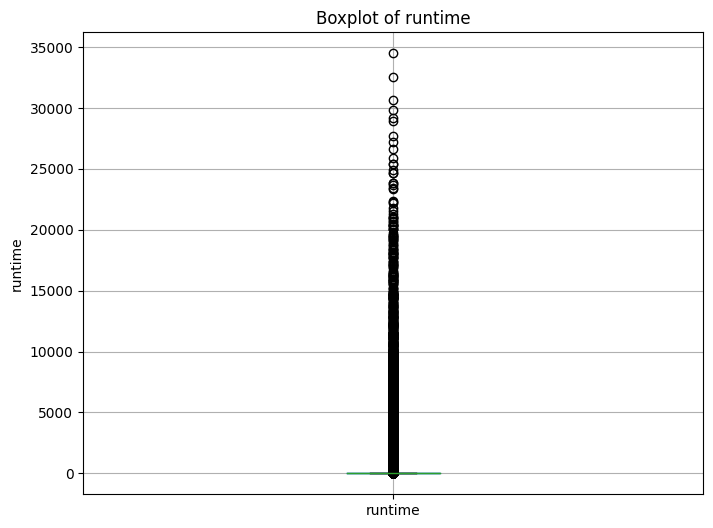

In [ ]:
## Visualize a boxplot for runtime column to identify outliers

final_df = final_df.withColumn("runtime", final_df["runtime"].cast("int"))
runtime_pd = final_df.select('runtime').toPandas()

plt.figure(figsize=(8, 6))
runtime_pd.boxplot(column='runtime')
plt.title('Boxplot of runtime')
plt.ylabel('runtime')
plt.xlabel('boxplot')
plt.show()

insight: There are outliers (presence of runtime which is unusual )in the runtime,  Movies with unusual runtimes should be removed as  they significantly differ from most other observations.


In [ ]:
## Getting the 99.5th percentile of runtime
quantile_runtime = final_df.approxQuantile("runtime", [0.995], 0.001)
quantile_runtime

[220.0]

In [ ]:
### Removing the outliers of runtime which are extreme unusual from the rest of the values
final_df = final_df.filter(final_df['runtime'] <= 300)

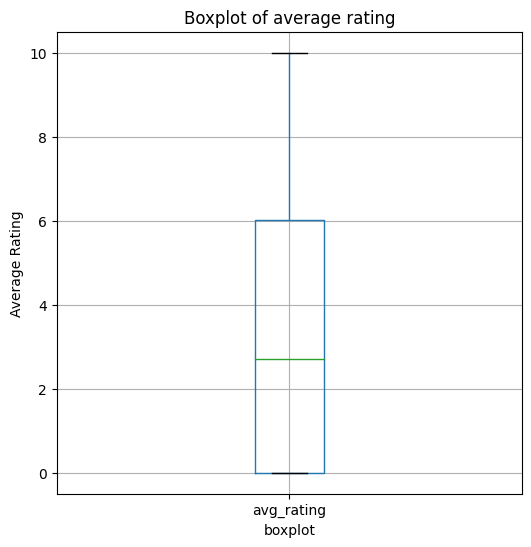

In [ ]:
## Visualize a boxplot for rating column to identify outliers

rating_pd = final_df.select('avg_rating').toPandas()
plt.figure(figsize=(6, 6))
rating_pd.boxplot(column='avg_rating')
plt.title('Boxplot of average rating')
plt.ylabel('Average Rating')
plt.xlabel('boxplot')
plt.show()

Insight: From the visualization, it can be seen that there are no outliers in the average rating column.

In [ ]:
final_df.count()

432410

##### Feature Extraction

Extracting release year and month from release date

In [ ]:
# Create new column for release year extracting from the relase date
final_df = final_df.withColumn('release_year', year(final_df['release_date']))

In [ ]:
# Create new column for release month extracting from the relase date
final_df = final_df.withColumn('release_month', month(final_df['release_date']))

##### One-Hot Encoding for genres

In [ ]:
## Here showing the unique genre in the data


from pyspark.sql.functions import split, explode, col, regexp_replace,length,trim


### Remove single quotes and other characters from the 'genres' column
cleaned_genres = final_df.withColumn("genres", regexp_replace(col("genres"), "[']|[\[\]]", ""))

#### Split the 'genres' column using comma
split_genres = cleaned_genres.select(explode(split(col("genres"), ",")).alias("genre")) \
                              .filter("genre != ''") \
                              .filter(~col("genre").rlike(r'\d+'))

### Displaying the unique list of genres
genres_list = split_genres.select(trim(split_genres["genre"]).alias("genre")).distinct()
### Filtering where the 'genre' column  length is more than 30 and does not contain valid genre names
valid_genres = genres_list.filter((length(col("genre")) < 30))
valid_genres.show()

+---------------+
|          genre|
+---------------+
|          Crime|
|        Romance|
|       TV Movie|
|       Thriller|
|      Adventure|
|          Drama|
|            War|
|    Documentary|
|         Family|
|        Fantasy|
|        History|
|        Mystery|
|      Animation|
|          Music|
|Science Fiction|
|         Horror|
|        Western|
|         Comedy|
|         Action|
+---------------+



In [ ]:
# converting to a list of genres
genre_list = valid_genres.select("genre").rdd.flatMap(lambda x: x).collect()
genre_list

['Crime',
 'Romance',
 'TV Movie',
 'Thriller',
 'Adventure',
 'Drama',
 'War',
 'Documentary',
 'Family',
 'Fantasy',
 'History',
 'Mystery',
 'Animation',
 'Music',
 'Science Fiction',
 'Horror',
 'Western',
 'Comedy',
 'Action']

In [ ]:
### Here Adding new columns for each unique genre, and assign a value of 1 to these columns if a movie's genre matches the corresponding category; otherwise, assign a value of 0.

for genre in genre_list:
    final_df = final_df.withColumn(genre, when(final_df.genres.contains(genre), 1).otherwise(0))

final_df.show(2)

+-------+--------------------+----------+------------+--------+------------+-------+-------+-----+------+-----------------+--------------------+--------------------+----------+--------------------+--------------+--------------------+--------------------+----------------+------------+-------------+-----+-------+--------+--------+---------+-----+---+-----------+------+-------+-------+-------+---------+-----+---------------+------+-------+------+------+
|     id|               title|avg_rating|rating_count|  status|release_date|revenue|runtime|adult|budget|original_language|      original_title|            overview|popularity|         poster_path|        genres|production_companies|production_countries|spoken_languages|release_year|release_month|Crime|Romance|TV Movie|Thriller|Adventure|Drama|War|Documentary|Family|Fantasy|History|Mystery|Animation|Music|Science Fiction|Horror|Western|Comedy|Action|
+-------+--------------------+----------+------------+--------+------------+-------+------

### Exploratory Data Analysis (EDA)

#### Genre Analysis

##### How does the distribution of number of movies vary across different genres in the  dataset?

In [ ]:
## Calculate the total number of movies corresponding to each genre
genre_counts = []
for genre in genre_list:
    total_movies = final_df.agg({genre: "sum"}).collect()[0][0]
    genre_counts.append((genre, total_movies))
genre_counts_df = spark.createDataFrame(genre_counts, ["genre_name", "number_of_movies"])
genre_counts_df.show()

+---------------+----------------+
|     genre_name|number_of_movies|
+---------------+----------------+
|          Crime|           22462|
|        Romance|           36672|
|       TV Movie|           16160|
|       Thriller|           29348|
|      Adventure|           16447|
|          Drama|          139695|
|            War|            7225|
|    Documentary|          108046|
|         Family|           18781|
|        Fantasy|           14763|
|        History|           11189|
|        Mystery|           12509|
|      Animation|           37636|
|          Music|           31588|
|Science Fiction|           14180|
|         Horror|           33126|
|        Western|            6980|
|         Comedy|           91989|
|         Action|           31985|
+---------------+----------------+



In [ ]:
genre_counts_df = spark.createDataFrame(genre_counts, ["genre_name", "number_of_movies"])
genre_counts_df.show()

+---------------+----------------+
|     genre_name|number_of_movies|
+---------------+----------------+
|          Crime|           22462|
|        Romance|           36672|
|       TV Movie|           16160|
|       Thriller|           29348|
|      Adventure|           16447|
|          Drama|          139695|
|            War|            7225|
|    Documentary|          108046|
|         Family|           18781|
|        Fantasy|           14763|
|        History|           11189|
|        Mystery|           12509|
|      Animation|           37636|
|          Music|           31588|
|Science Fiction|           14180|
|         Horror|           33126|
|        Western|            6980|
|         Comedy|           91989|
|         Action|           31985|
+---------------+----------------+



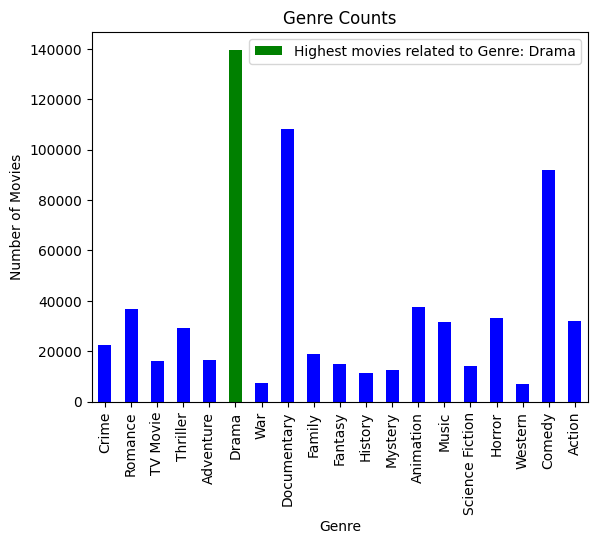

In [ ]:
genre_count_pd = genre_counts_df.toPandas()
# Plot the bar chart
ax = genre_count_pd.plot(kind='bar', x='genre_name', y='number_of_movies', color='blue', legend=False)

# Set title and labels
plt.title('Genre Counts')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.xticks(rotation=90)

# Find the genre with the highest count
highest_genre = genre_count_pd.loc[genre_count_pd['number_of_movies'].idxmax(), 'genre_name']

# Highlight the highest genre bar in green
highlighted_patch = ax.patches[genre_count_pd.index[genre_count_pd['genre_name'] == highest_genre][0]]
highlighted_patch.set_facecolor('green')

# Add legend
ax.legend([highlighted_patch], [f'Highest movies related to Genre: {highest_genre}'], loc='upper right')

plt.show()

**Insight:** The dataset shows that the highest number of movies belong to the drama genre, followed by Documentary and Comedy.

##### what are most popular movie genre in the year 2023?

In [ ]:
## I am Filtering movies for the year 2023 and filtering out the movies where popularity =0 because these movies might have a empty entry for popularity , which might affect our findings
## So, filtering out the movies where popularity =0 to focus the analysis on movies that have actually been viewed,
movies_2023 = final_df.filter((final_df.release_year == 2023) & (final_df.popularity > 0))

## Here Calculating the average popularity for each genre
genre_popularity = []
for genre in genre_list:
    total_popularity = movies_2023.filter(col(genre) == 1).agg({"popularity": "sum"}).collect()[0][0]
    genre_count = movies_2023.filter(col(genre) == 1).count()
    avg_popularity = total_popularity / genre_count if genre_count != 0 else 0
    genre_popularity.append((genre, avg_popularity))


avg_popularity_2023 = spark.createDataFrame(genre_popularity, ["genre", "average_popularity"])
top_popular_genre =avg_popularity_2023.orderBy(col("average_popularity").desc())
top_popular_genre.show(6)

+---------------+------------------+
|          genre|average_popularity|
+---------------+------------------+
|      Adventure|40.104026143790854|
|         Action| 27.27848160261651|
|       Thriller| 18.03080603725112|
|Science Fiction|17.922094214876036|
|            War|14.695425196850396|
|        Mystery|14.379160066006598|
+---------------+------------------+
only showing top 6 rows



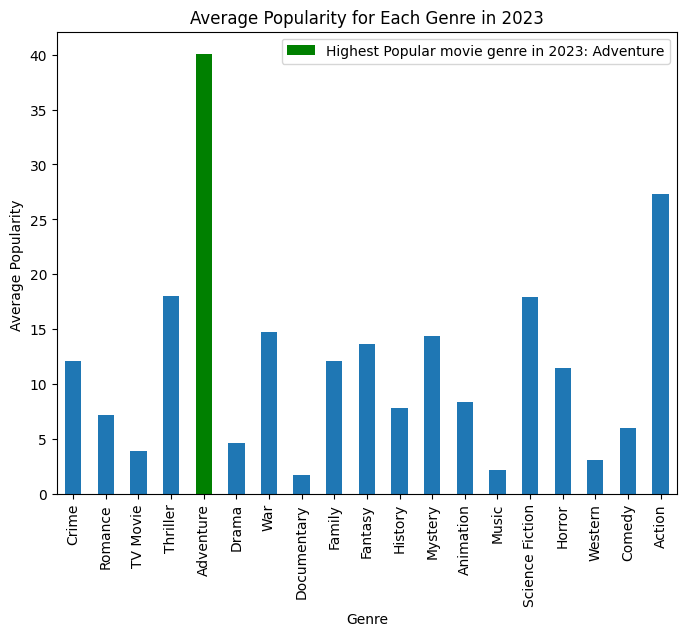

In [ ]:
# Visualize the average popularity variation across different movie genres in the year 2023
avg_popularity_pd = avg_popularity_2023.toPandas()

ax = avg_popularity_pd.plot(kind='bar', x='genre', y='average_popularity', figsize=(8,6))
plt.title('Average Popularity for Each Genre in 2023')
plt.xlabel('Genre')
plt.ylabel('Average Popularity ')
plt.xticks(rotation=90)

highest_count = avg_popularity_pd.loc[avg_popularity_pd['average_popularity'].idxmax(), 'genre']
highlighted_patch = ax.patches[avg_popularity_pd.index[avg_popularity_pd['genre'] == highest_count][0]]
highlighted_patch.set_facecolor('green')
ax.legend([highlighted_patch], [f'Highest Popular movie genre in 2023: {highest_count}'], loc='best')
plt.show()

**Insight:** In the year 2023, The most popular movie genre is Adventure, followed by Action, Science Fiction and Thriller genre.

##### What are the common words in the movie overviews across different genres?

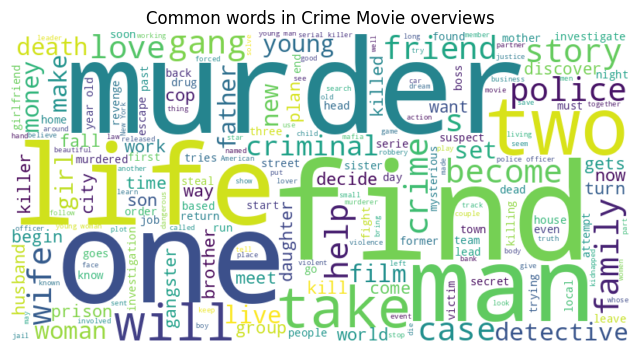

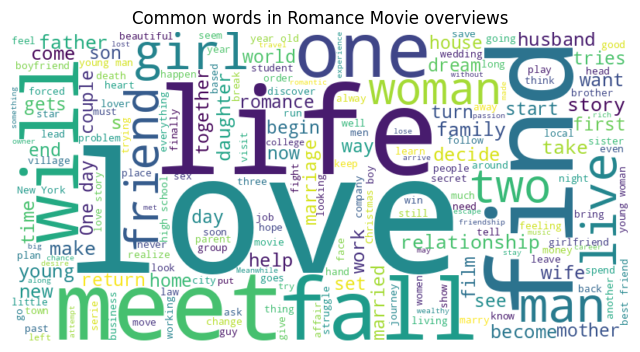

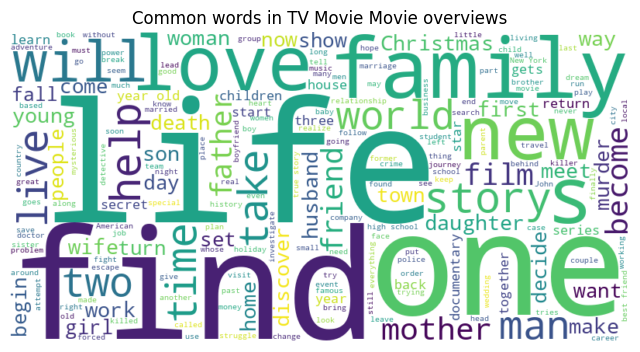

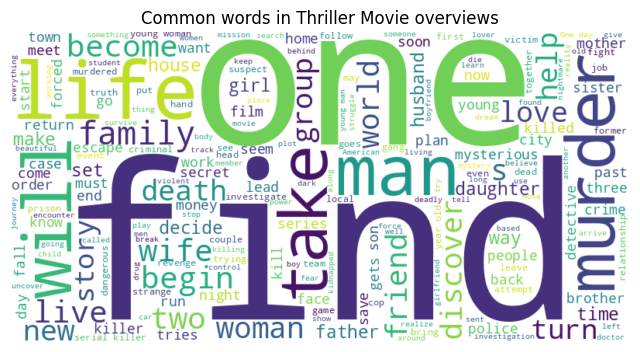

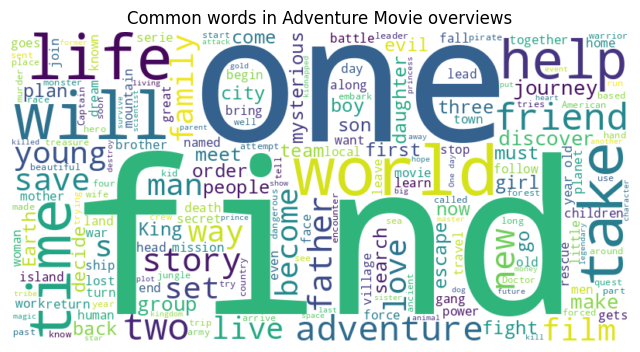

...

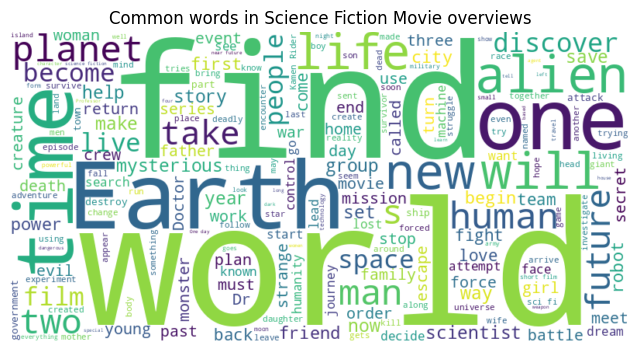

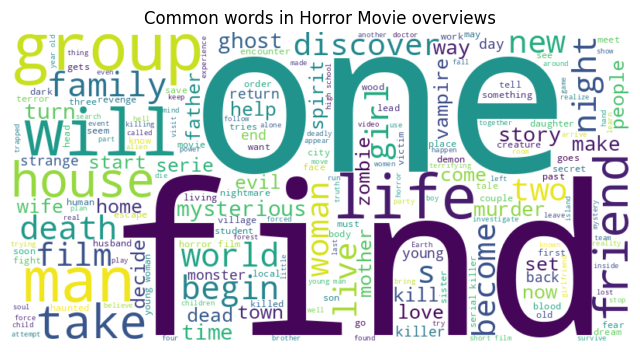

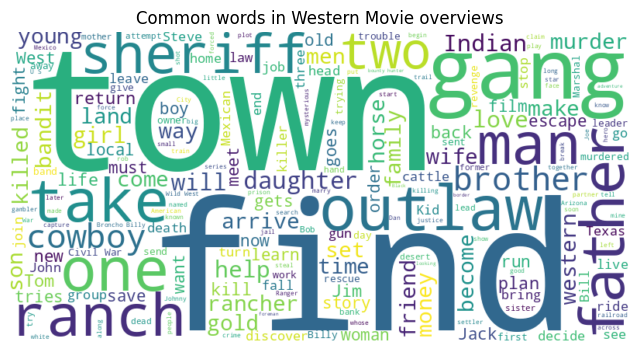

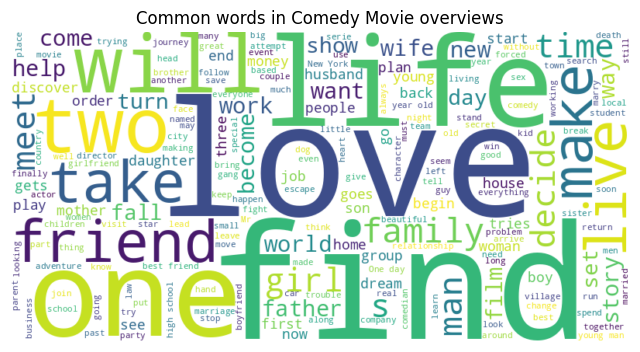

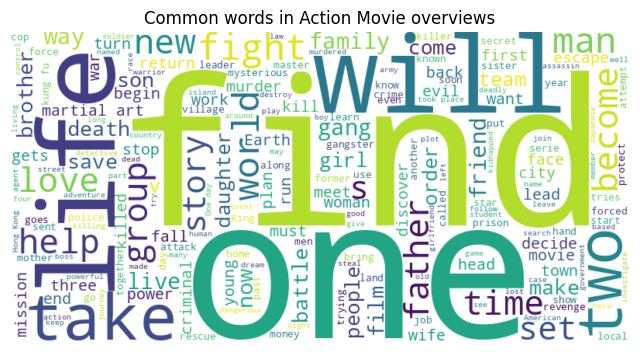

In [ ]:
from wordcloud import WordCloud
## Tokenizing the overviews
tokenized_data = final_df.withColumn("word", explode(split(col("overview"), " ")))

### collecting the words for each genre
genre_word_list ={}
for genre in genre_list:
  genre_words = tokenized_data.filter(col(genre) == 1) \
                              .select("word") \
                              .rdd.flatMap(lambda x:x).collect()
  genre_word_list[genre] = genre_words

### Generating word clouds
for genre, words in genre_word_list.items():
  if words:
    word_cloud = WordCloud(width=800, height = 400, background_color ="white").generate(' '.join(words))
    plt.figure(figsize = (8,6))
    plt.imshow(word_cloud, interpolation ="bilinear")
    plt.title(f"Common words in {genre} Movie overviews")
    plt.axis("off")
    plt.show()

**Insight:** The word cloud which visually represents the most frequently used words in movie description of each genre. For example, The most commonly used words in crime genre movie content include murder, police, life whereas for romance genre, the most common words are love, life, find and fall. This analysis helps to understand the theme and content difference across different genres.


##### What is the average rating of movies released since 2000 across different genres, and how does it vary across these genres?

In [ ]:
## Getting the movies where release year is greater or equal 2000
movies_df_2000 = final_df.filter(col("release_year") >= 2000)

In [ ]:
## First  Counting the number of movies with avg_rating equal to 0
count_zero_rating = movies_df_2000.filter(col('avg_rating') == 0).count()
count_zero_rating

137508

In [ ]:
## As so many movies have zero ratings, it may affect our original findings
### Zero ratings might occur when users opt not to provide a rating for a particular movie. So I will consider removing these for analysis
### also considering those movies having rating count more than 10 for insightful analysis
movies_df_2000 = movies_df_2000.filter((final_df['avg_rating'] != 0) & (final_df['rating_count'] > 10))

In [ ]:
## I am  calculating the average rating for each genre
genre_avg_rating = []

for genre in genre_list:
    avg_rating = movies_df_2000.where(col(genre) == 1).agg({"avg_rating": "avg"}).collect()[0][0]
    genre_avg_rating.append((genre, avg_rating))

### Creating a DataFrame
genre_avg_rating_df = spark.createDataFrame(genre_avg_rating, ['Genre', 'Avg_Rating'])
genre_avg_rating_df.show()

+---------------+------------------+
|          Genre|        Avg_Rating|
+---------------+------------------+
|          Crime|6.1539384984025585|
|        Romance| 6.212768196202535|
|       TV Movie| 6.185007620367163|
|       Thriller| 5.798737079520558|
|      Adventure|6.2207778125979365|
|          Drama| 6.296139271209381|
|            War|6.5012664233576665|
|    Documentary| 6.887421270382087|
|         Family| 6.424774076317383|
|        Fantasy| 6.251100691775559|
|        History|6.6358210455764075|
|        Mystery| 6.083132031249998|
|      Animation| 6.774183034257752|
|          Music| 6.934547528517107|
|Science Fiction| 5.778295679886688|
|         Horror| 5.319036651162791|
|        Western| 5.971310638297871|
|         Comedy| 6.076381757259854|
|         Action| 6.036530276118202|
+---------------+------------------+



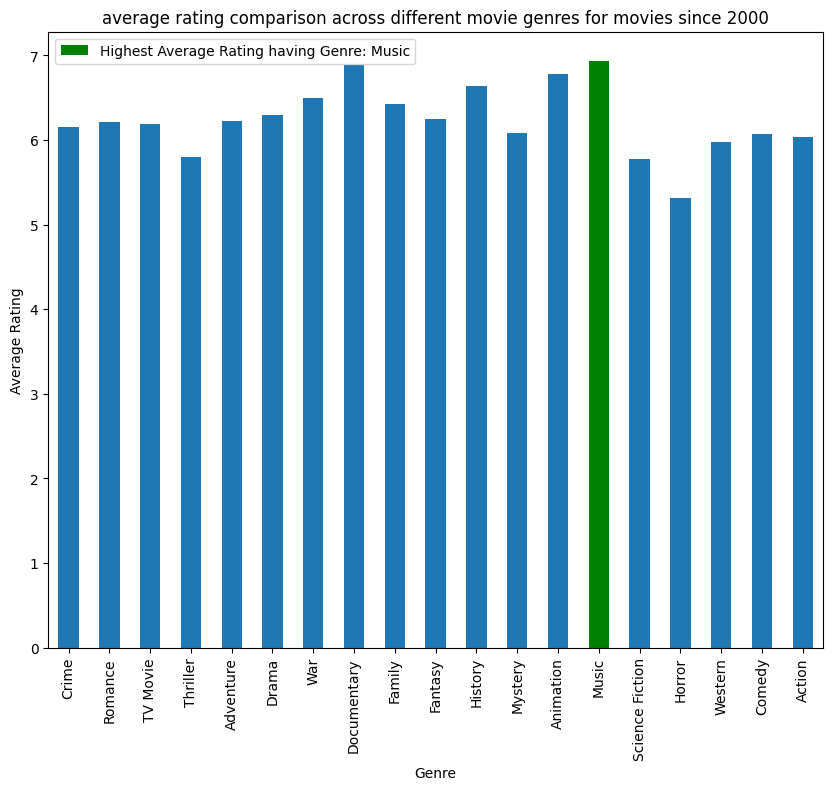

In [ ]:
### Here, Visualizing the average rating comparison across different movie genres
genre_avg_rating_pd = genre_avg_rating_df.toPandas()

ax = genre_avg_rating_pd.plot(kind='bar', x='Genre', y='Avg_Rating', figsize=(10, 8))
plt.title('average rating comparison across different movie genres for movies since 2000')
plt.xlabel('Genre')
plt.ylabel('Average Rating')
plt.xticks(rotation=90)

highest_count = genre_avg_rating_pd.loc[genre_avg_rating_pd['Avg_Rating'].idxmax(), 'Genre']
highlighted_patch = ax.patches[genre_avg_rating_pd.index[genre_avg_rating_pd['Genre'] == highest_count][0]]
highlighted_patch.set_facecolor('green')

ax.legend([highlighted_patch], [f'Highest Average Rating having Genre: {highest_count}'], loc='best')
plt.show()

###### **Insight:** Movies of documentary genre have the highest average rating among all the genres, indicating documentary genre movies recieve higher acceptability from audience.

##### How does the average ratings of Documentary, action, animation, fantasy, crime, mystery, horror,drama and romance genre movies change over a period from 2010 to 2023?

In [ ]:
### Selecting the movies between 2010 and 2023 that are of documentary,action, drama ,and romance genre
from pyspark.sql.functions import avg

movies_genre_df = final_df.filter((final_df.release_year.between(2010,2023)) & (final_df.avg_rating >0))
genre_rating_df = movies_genre_df.groupBy("release_year").agg(
      avg(when(col('Documentary') == 1 , col("avg_rating"))).alias("Documentary_Rating"),
      avg(when(col('Action') == 1 , col("avg_rating"))).alias("Action_Rating"),
      avg(when(col('Animation') == 1 , col("avg_rating"))).alias("Animation_Rating"),
      avg(when(col('Fantasy') == 1 , col("avg_rating"))).alias("Fantasy_Rating"),
      avg(when(col('Crime') == 1 , col("avg_rating"))).alias("Crime_Rating"),
      avg(when(col('Mystery') == 1 , col("avg_rating"))).alias("Mystery_Rating"),
      avg(when(col('Horror') == 1 , col("avg_rating"))).alias("Horror_Rating"),
      avg(when(col('Drama') == 1 , col("avg_rating"))).alias("Drama_Rating"),
      avg(when(col('Romance') == 1 , col("avg_rating"))).alias("Romance_Rating")).orderBy('release_year')

genre_rating_df.show()

+------------+------------------+------------------+------------------+------------------+-----------------+-----------------+------------------+------------------+------------------+
|release_year|Documentary_Rating|     Action_Rating|  Animation_Rating|    Fantasy_Rating|     Crime_Rating|   Mystery_Rating|     Horror_Rating|      Drama_Rating|    Romance_Rating|
+------------+------------------+------------------+------------------+------------------+-----------------+-----------------+------------------+------------------+------------------+
|        2010|6.5836814551907725|5.5679630931458695| 6.374623188405797| 5.982940639269406|5.609025179856115|5.573548913043478| 4.824134099616858| 5.790371038251366|  5.67672902097902|
|        2011| 6.621449760765552| 5.687115916955018| 6.322443914081145| 5.866274999999999|5.754930232558139|5.663201005025126| 4.871786618444847| 5.879793329964629| 5.789454379562042|
|        2012| 6.752320485367595| 5.865472118959108| 6.575130136986301| 5.960153

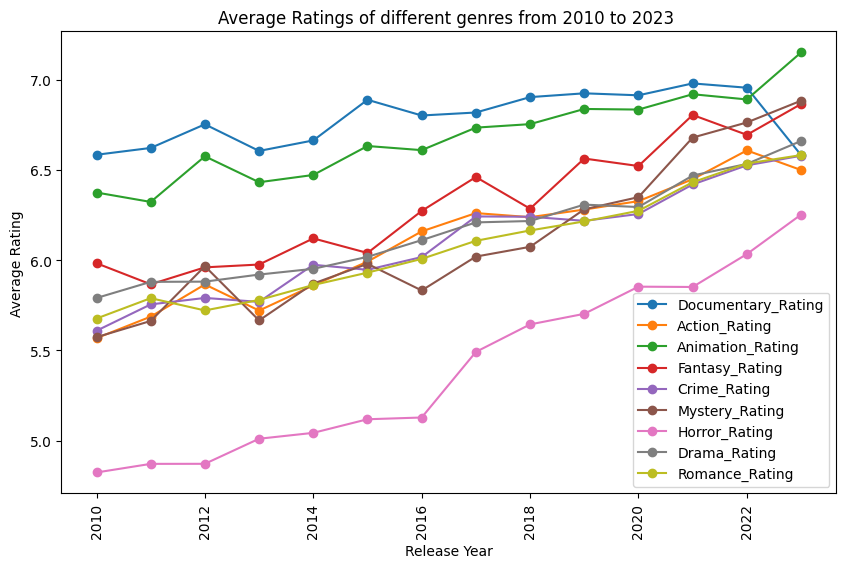

In [ ]:
#### Visualization to compare the total number of drama,action and romance genre movies released from 2010 to 2023
genre_rating_pd = genre_rating_df.toPandas()
ax = genre_rating_pd.plot(kind='line', x='release_year', marker ='o', figsize=(10, 6))
plt.title('Average Ratings of different genres from 2010 to 2023 ')
plt.xlabel('Release Year')
plt.ylabel('Average Rating')
plt.xticks(rotation=90)
plt.legend(["Documentary_Rating","Action_Rating","Animation_Rating", "Fantasy_Rating","Crime_Rating","Mystery_Rating","Horror_Rating","Drama_Rating","Romance_Rating"])
plt.show()

###### Insight: Movies of Documentary and animation genre recieve higher  average  ratings compared to the other genres from 2010 to 2023. Also, we can see that, the average ratings overally actually increased for every genres over the years, although there are some fluctuations.

##### How does the average revenue vary across different movie genres in the year 2022?

In [ ]:
## I am Filtering movies for the year 2022 and where revenue is greater than 0
movies_2022 = final_df.filter((final_df.release_year == 2022) & (final_df.revenue > 0))

## Here Calculating the total revenue for each genre
genre_revenue = []
for genre in genre_list:
    total_revenue = movies_2022.filter(col(genre) == 1).agg({"revenue": "sum"}).collect()[0][0]
    genre_count = movies_2022.filter(col(genre) == 1).count()
    avg_revenue = total_revenue / genre_count if genre_count != 0 else 0
    genre_revenue.append((genre, avg_revenue))

avg_revenue_2022 = spark.createDataFrame(genre_revenue, ["genre", "average_revenue_2022"])
avg_revenue_2022.show()

+---------------+--------------------+
|          genre|average_revenue_2022|
+---------------+--------------------+
|          Crime|2.3177831054054055E7|
|        Romance| 1.919686251162791E7|
|       TV Movie|            202500.0|
|       Thriller|2.3294377325301204E7|
|      Adventure|1.8425288104081634E8|
|          Drama|2.4138686489130434E7|
|            War|      9.5841401375E7|
|    Documentary|   3063132.193548387|
|         Family|1.0598622579411764E8|
|        Fantasy| 9.725740797297297E7|
|        History|       6.052441565E7|
|        Mystery| 2.639729234090909E7|
|      Animation|   1.0697474103125E8|
|          Music|2.7538274954545453E7|
|Science Fiction|1.8949873365714285E8|
|         Horror|1.5600394871794872E7|
|        Western|        1.03362946E7|
|         Comedy|4.3364196687943265E7|
|         Action|1.3211728051724137E8|
+---------------+--------------------+



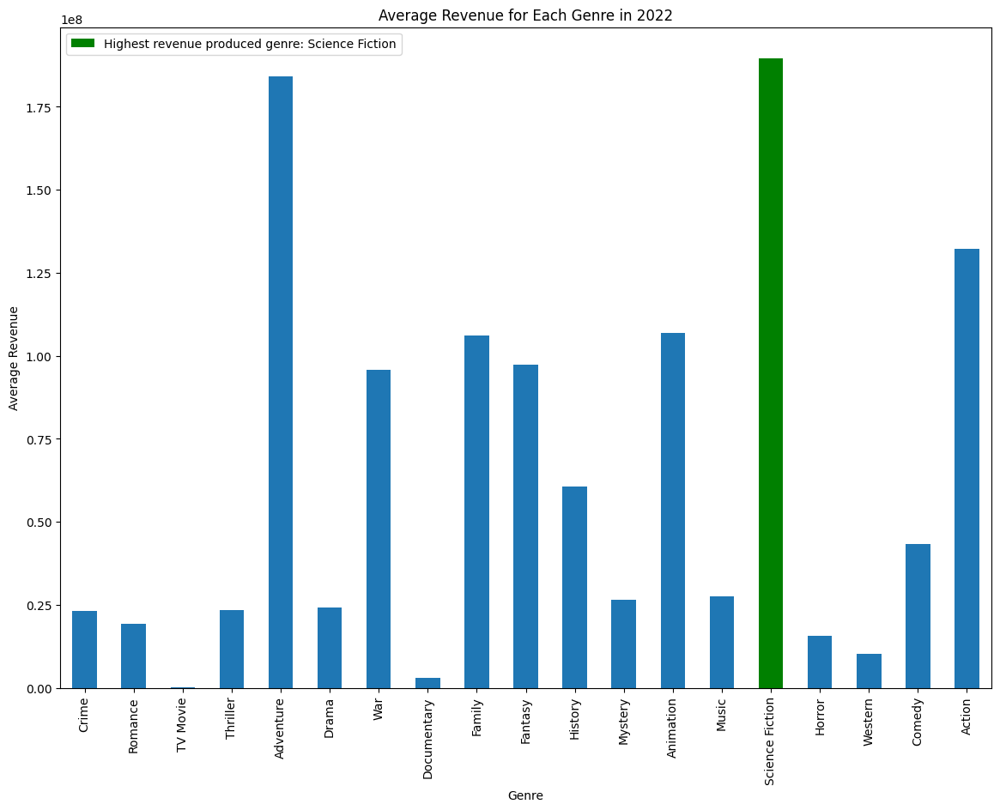

In [ ]:
#### Visualization of the average revenue variation across different movie genres in the year 2022 through a bar chart
avg_revenue_pd = avg_revenue_2022.toPandas()
ax =avg_revenue_pd.plot(kind='bar', x='genre', y='average_revenue_2022', figsize=(14, 10))
plt.title('Average Revenue for Each Genre in 2022')
plt.xlabel('Genre')
plt.ylabel('Average Revenue')
plt.xticks(rotation=90)

highest_count = avg_revenue_pd.loc[avg_revenue_pd['average_revenue_2022'].idxmax(), 'genre']
highlighted_patch = ax.patches[avg_revenue_pd.index[avg_revenue_pd['genre'] == highest_count][0]]
highlighted_patch.set_facecolor('green')

ax.legend([highlighted_patch], [f'Highest revenue produced genre: {highest_count}'], loc='upper left')
plt.show()

###### **Insight:** In the year 2022, for 'Science Fiction' genre movies earned the highest average revenue among all the genres, while Documentary, and  TV movie genre movies generates comparatively lesser revenue among all.

##### How has the average revenue of movies changed between 2021 and 2022 across different genres?

In [ ]:
## I am Filtering movies for the year 2023 and where revenue is greater than 0
movies_2021 = final_df.filter((final_df.release_year == 2021) & (final_df.revenue > 0))

## Here Calculating the total revenue for each genre
genre_revenue = []
for genre in genre_list:
    total_revenue = movies_2021.filter(col(genre) == 1).agg({"revenue": "sum"}).collect()[0][0]
    genre_count = movies_2021.filter(col(genre) == 1).count()
    avg_revenue = total_revenue / genre_count if genre_count != 0 else 0
    genre_revenue.append((genre, avg_revenue))

avg_revenue_2021 = spark.createDataFrame(genre_revenue, ["genre", "average_revenue_2021"])
avg_revenue_2021.show()

+---------------+--------------------+
|          genre|average_revenue_2021|
+---------------+--------------------+
|          Crime| 4.743092355319149E7|
|        Romance|2.0311342173076924E7|
|       TV Movie|           3127678.4|
|       Thriller|4.1307982655172415E7|
|      Adventure| 1.009689507887324E8|
|          Drama|2.0278493397727273E7|
|            War|1.0438307766666667E8|
|    Documentary|  1149477.4390243902|
|         Family|4.1712794448979594E7|
|        Fantasy| 5.817983366101695E7|
|        History|2.1513064739130434E7|
|        Mystery| 3.553794012820513E7|
|      Animation|5.3901630777777776E7|
|          Music|   3441795.777777778|
|Science Fiction|1.1412705553333333E8|
|         Horror| 2.371108364516129E7|
|        Western|         1.1398074E7|
|         Comedy| 4.094931877884615E7|
|         Action| 9.714968580645162E7|
+---------------+--------------------+



In [ ]:
### For each genre, calculating  the change in average revenue between 2022 and 2023 across different genres
revenue_change = avg_revenue_2022.join(avg_revenue_2021, on ='genre', how='inner') \
      .withColumn('Change_in_Revenue', col('average_revenue_2022') - col('average_revenue_2021'))
revenue_change.show()

+---------------+--------------------+--------------------+--------------------+
|          genre|average_revenue_2022|average_revenue_2021|   Change_in_Revenue|
+---------------+--------------------+--------------------+--------------------+
|         Action|1.3211728051724137E8| 9.714968580645162E7|3.4967594710789755E7|
|      Adventure|1.8425288104081634E8| 1.009689507887324E8| 8.328393025208394E7|
|      Animation|   1.0697474103125E8|5.3901630777777776E7|5.3073110253472224E7|
|         Comedy|4.3364196687943265E7| 4.094931877884615E7|  2414877.9090971127|
|          Crime|2.3177831054054055E7| 4.743092355319149E7|-2.42530924991374...|
|    Documentary|   3063132.193548387|  1149477.4390243902|  1913654.7545239967|
|          Drama|2.4138686489130434E7|2.0278493397727273E7|  3860193.0914031602|
|         Family|1.0598622579411764E8|4.1712794448979594E7| 6.427343134513805E7|
|        Fantasy| 9.725740797297297E7| 5.817983366101695E7|3.9077574311956026E7|
|        History|       6.05

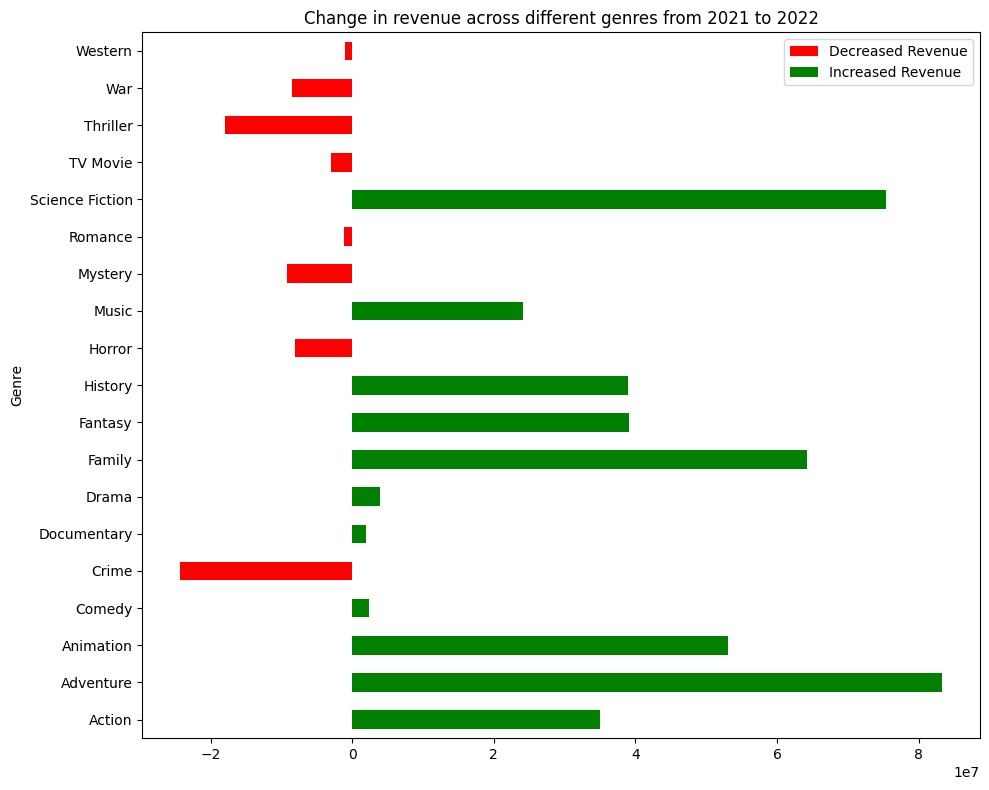

In [ ]:
### Visualization to show the change in average revenue between 2022 and 2023 across different genres
fig, revenue_ax = plt.subplots(figsize=(10, 8))
revenue_change_pd = revenue_change.toPandas()
colors = ['red' if x < 0 else 'green' for x in revenue_change_pd['Change_in_Revenue']]
revenue_change_pd.plot(kind='barh', x='genre', y='Change_in_Revenue', ax=revenue_ax,color=colors)
revenue_ax.set_ylabel("Genre")

legend_labels = ['Decreased Revenue', 'Increased Revenue']
legend_handles = [Patch(facecolor='red', label='Decreased Revenue'), Patch(facecolor='green', label='Increased Revenue')]
revenue_ax.legend(handles=legend_handles, labels=legend_labels, loc='upper right')
plt.title('Change in revenue across different genres from 2021 to 2022')
plt.tight_layout()
plt.show()

###### **Insight:** For crime, Horror, Mystery, Romance,Tv movie, thriller, western and war genre movies, the avg revenue decreased from 2021 to 2022, but for other genres(Action, Adventure, Animation, Documentary, Drama, Family, Fantasy,History, Music, Science Fiction), the avg revenue increased. The highest increase in avg revenue from 2021 to 2022 can be seen in Adventure movie genre.

##### What are the distributions of co-occurence for other genres when a movie is specified as action, comedy or drama?

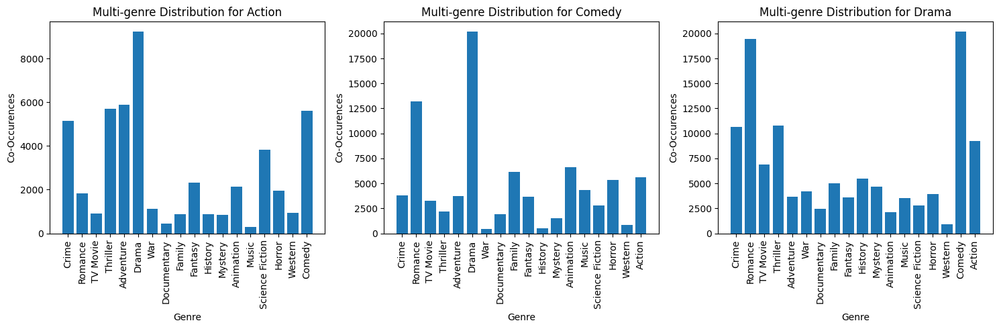

In [ ]:
def compute_occurence(selected_genre):
  occurences ={}
  for genre in genre_list:
    if genre != selected_genre:
      occurences[genre] = final_df.filter((final_df[genre]==1) & (final_df[selected_genre]==1)).count()
  return occurences

##Analyzing on action, Comedy and drama to check if a movie belongs to each genre, then, what are the distribution of co-occurence to other genre


fig, ax = plt.subplots(1, 3, figsize =(15,5))
for i, genre in enumerate(['Action','Comedy','Drama']):
  co_occurrence = compute_occurence(genre)
  ax[i].bar(co_occurrence.keys(), co_occurrence.values())
  ax[i].set_title(f'Multi-genre Distribution for {genre}')
  ax[i].set_xlabel("Genre")
  ax[i].set_ylabel("Co-Occurences")
  ax[i].tick_params(axis='x', rotation =90)

plt.tight_layout()
plt.show()


**Insight:** The visualization shows that Action genre movies frequently co-occur with drama, adventure and thriller genre. Moreover, Comedy genre movies overlap highly with drama genre and drama genre movies commonly co-occur with comedy and romance genre. So, this analysis provides insights into potential patterns in content categorization by visualizing the co-occurence of movie genres.

#### Rating Analysis

##### What are the top 5 movies having the highest avg Rating (considering minimum rating count 10000)?

In [ ]:
#### Finding only those movies having at least 10,000 rating count ( So that we get meaningful insight)
higher_rating_count_df = final_df.filter(col("rating_count") >= 10000)

#### Finding the movies having the highest rating
top_movies = higher_rating_count_df.orderBy(col("avg_rating").desc()).select("title", "avg_rating").limit(5)
top_movies.show()

+--------------------+----------+
|               title|avg_rating|
+--------------------+----------+
|       The Godfather|     8.707|
|The Shawshank Red...|     8.702|
|The Godfather Par...|     8.591|
|    Schindler's List|     8.573|
|       Spirited Away|     8.539|
+--------------------+----------+



##### What are the top 5 movies having the highest number of  Rating Count?

In [ ]:
#### Finding the movies having the highest rating count
top_rating_count_movies = final_df.orderBy(col("rating_count").desc()).select("title", "rating_count","avg_rating","popularity").limit(5)
top_rating_count_movies.show()

+--------------------+------------+----------+----------+
|               title|rating_count|avg_rating|popularity|
+--------------------+------------+----------+----------+
|           Inception|       34495|     8.364|    83.952|
|        Interstellar|       32571|     8.417|   140.241|
|              Avatar|       29815|     7.573|    79.932|
|        The Avengers|       29166|      7.71|    98.082|
|Avengers: Infinit...|       27713|     8.255|    154.34|
+--------------------+------------+----------+----------+



###### Inception is the movie having highest number of review count.

##### How has the average rating of movies changed  between 2022 and 2023  across different genres?

In [ ]:
## Selecting only the movies released on 2022 and 2023
ratings_df = final_df.filter((col('release_year') == 2022 )| (col('release_year') == 2023))

## As so many movies have zero ratings, it may affect our original findings
### Zero ratings might occur when users opt not to provide a rating for a particular movie. So I will consider removing these for analysis
### also considering those movies having rating count more than 10 for insightful analysis
ratings_df = ratings_df.filter((ratings_df['avg_rating'] != 0) & (ratings_df['rating_count'] > 10))

genre_avg_rating_2022 = []
## I am  calculating the average rating for each genre in 2022
rating_2022 = ratings_df.filter(col('release_year') == 2022 )
for genre in genre_list:
    avg_rating_2022 = rating_2022.where(col(genre) == 1).agg({"avg_rating": "avg"}).collect()[0][0]
    genre_avg_rating_2022.append((genre, avg_rating_2022))

### Creating a DataFrame
genre_avg_rating_2022_df = spark.createDataFrame(genre_avg_rating_2022, ['Genre', 'Avg_Rating_2022'])
genre_avg_rating_2022_df.show()


+---------------+------------------+
|          Genre|   Avg_Rating_2022|
+---------------+------------------+
|          Crime| 6.408042553191488|
|        Romance|6.5279846743295025|
|       TV Movie| 6.604258064516129|
|       Thriller| 6.104593167701863|
|      Adventure| 6.767474137931034|
|          Drama| 6.575435064935065|
|            War| 6.680259259259259|
|    Documentary| 7.009705882352942|
|         Family|  6.75988188976378|
|        Fantasy| 6.631972727272728|
|        History| 6.886272727272727|
|        Mystery| 6.184559322033898|
|      Animation| 7.017207692307692|
|          Music|  6.93288888888889|
|Science Fiction| 6.371376237623762|
|         Horror| 5.862113861386139|
|        Western| 6.084071428571428|
|         Comedy| 6.369702791461411|
|         Action| 6.399893877551021|
+---------------+------------------+



In [ ]:
genre_avg_rating_2023 = []
## I am  calculating the average rating for each genre in 2023
rating_2023 = ratings_df.filter(col('release_year') == 2023 )
for genre in genre_list:
    avg_rating_2023 = rating_2023.where(col(genre) == 1).agg({"avg_rating": "avg"}).collect()[0][0]
    genre_avg_rating_2023.append((genre, avg_rating_2023))

### Creating a DataFrame
genre_avg_rating_2023_df = spark.createDataFrame(genre_avg_rating_2023, ['Genre', 'Avg_Rating_2023'])
genre_avg_rating_2023_df.show()

+---------------+------------------+
|          Genre|   Avg_Rating_2023|
+---------------+------------------+
|          Crime| 6.639842105263158|
|        Romance|6.6537706422018355|
|       TV Movie| 6.668933333333333|
|       Thriller| 6.395142857142857|
|      Adventure| 6.751833333333334|
|          Drama|          6.675816|
|            War| 6.918142857142857|
|    Documentary| 7.055074074074074|
|         Family| 6.922395348837208|
|        Fantasy| 6.852461538461539|
|        History| 6.997249999999999|
|        Mystery| 6.452875000000001|
|      Animation| 7.190787234042553|
|          Music|           7.26808|
|Science Fiction| 6.408260869565218|
|         Horror| 6.169500000000001|
|        Western| 5.610799999999999|
|         Comedy| 6.513697416974169|
|         Action|6.5621558441558445|
+---------------+------------------+



In [ ]:
### For each genre, calculating  the change in average rating between 2022 and 2023

rating_change = genre_avg_rating_2023_df.join(genre_avg_rating_2022_df, on ='Genre', how='inner') \
      .withColumn('Change_in_Rating', col('Avg_Rating_2023') - col('Avg_Rating_2022'))
rating_change.show()

+---------------+------------------+------------------+--------------------+
|          Genre|   Avg_Rating_2023|   Avg_Rating_2022|    Change_in_Rating|
+---------------+------------------+------------------+--------------------+
|         Action|6.5621558441558445| 6.399893877551021| 0.16226196660482373|
|      Adventure| 6.751833333333334| 6.767474137931034|-0.01564080459769...|
|      Animation| 7.190787234042553| 7.017207692307692| 0.17357954173486068|
|         Comedy| 6.513697416974169| 6.369702791461411| 0.14399462551275732|
|          Crime| 6.639842105263158| 6.408042553191488|  0.2317995520716698|
|    Documentary| 7.055074074074074| 7.009705882352942|0.045368191721132156|
|          Drama|          6.675816| 6.575435064935065| 0.10038093506493517|
|         Family| 6.922395348837208|  6.75988188976378| 0.16251345907342785|
|        Fantasy| 6.852461538461539| 6.631972727272728|  0.2204888111888117|
|        History| 6.997249999999999| 6.886272727272727| 0.11097727272727198|

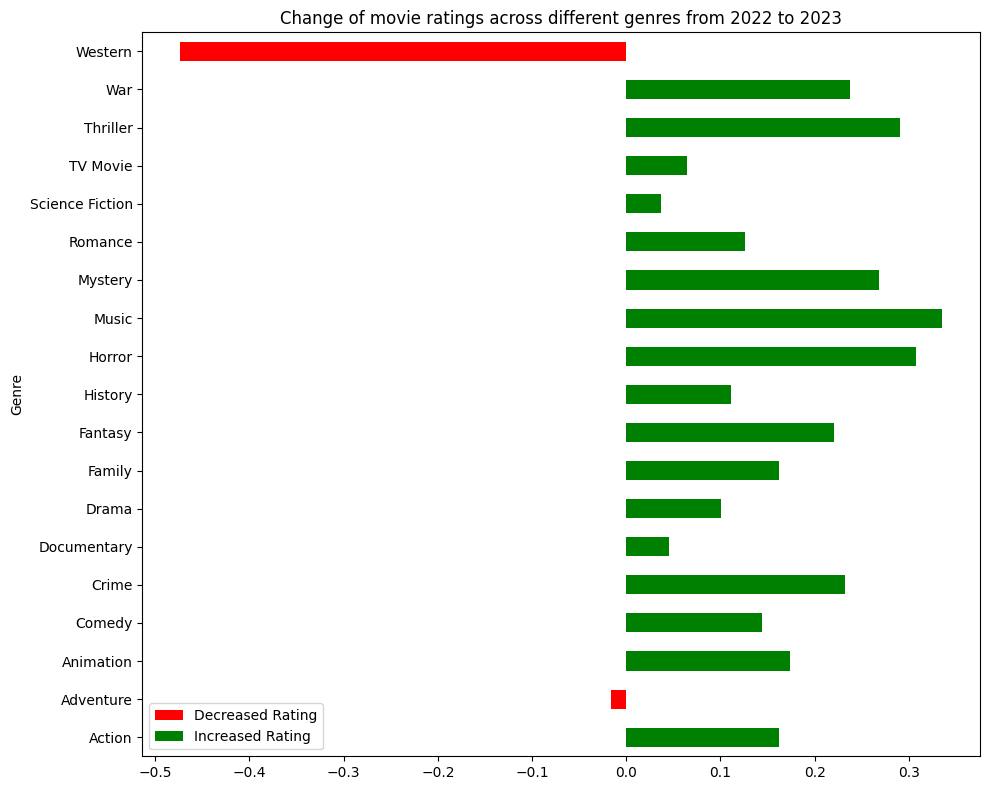

In [ ]:
fig, rating_ax = plt.subplots(figsize=(10, 8))
rating_change_pd = rating_change.toPandas()
colors = ['red' if x < 0 else 'green' for x in rating_change_pd['Change_in_Rating']]
rating_change_pd.plot(kind='barh', x='Genre', y='Change_in_Rating', ax=rating_ax,color=colors)
rating_ax.set_ylabel("Genre")

legend_labels = ['Decreased Rating', 'Increased Rating']
legend_handles = [Patch(facecolor='red', label='Decreased Rating'), Patch(facecolor='green', label='Increased Rating')]
rating_ax.legend(handles=legend_handles, labels=legend_labels, loc='lower left')
plt.title("Change of movie ratings across different genres from 2022 to 2023")
plt.tight_layout()
plt.show()

###### **Insight:** Apart from Western and Family genre, average ratings for all genres of movies increased from 2022 to 2023, whereas for Western and Family genre,the rating decreased.

#### Release Date Analysis

In [ ]:
## Get a summary for the release year
summary = final_df.select('release_year').summary()
summary.show()

+-------+------------------+
|summary|      release_year|
+-------+------------------+
|  count|            432410|
|   mean|1997.7641844545685|
| stddev|27.574574098308222|
|    min|              1865|
|    25%|              1986|
|    50%|              2009|
|    75%|              2018|
|    max|              2040|
+-------+------------------+



###### Is there any in the distribution of movie release years across different years?"

In [ ]:
def histogram(df, col, bins=10, xname=None, yname=None):
    # Calculating histogram in Spark
    vals = df.select(col).rdd.flatMap(lambda x: x).histogram(bins)

    # Preprocessing histogram points and locations
    width = vals[0][1] - vals[0][0]
    loc = [vals[0][0] + (i+1) * width for i in range(len(vals[1]))]

    # Making a bar plot
    plt.bar(loc, vals[1], width=width)
    plt.xlabel(col)
    plt.ylabel(yname)
    for i in range(len(vals[1])):
        plt.text(loc[i], vals[1][i], str(vals[1][i]), ha='center', va='bottom')

    plt.show()

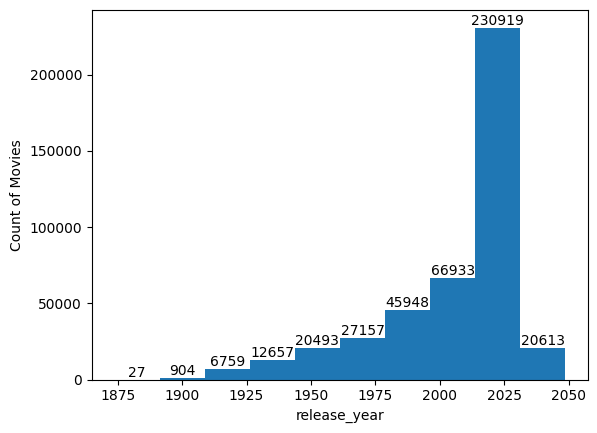

In [ ]:
histogram(final_df, 'release_year', bins=10,xname ='Release Year', yname='Count of Movies')

**Insights:** There is higher rise of released movies count after the year 2000 potentially indicating people's higher preference into movie

##### Which month typically sees the highest number of movie releases?

In [ ]:
## Number of movies released across different months
movie_count_by_month = final_df.groupBy("release_month").count()
movie_count_by_month_sorted = movie_count_by_month.orderBy('count', ascending=False)
movie_count_by_month_sorted.show()

+-------------+-----+
|release_month|count|
+-------------+-----+
|            1|75859|
|           10|41609|
|           11|36580|
|            9|36561|
|           12|35415|
|            3|32602|
|            6|31620|
|            4|30683|
|            5|29420|
|            8|28850|
|            2|26961|
|            7|26250|
+-------------+-----+



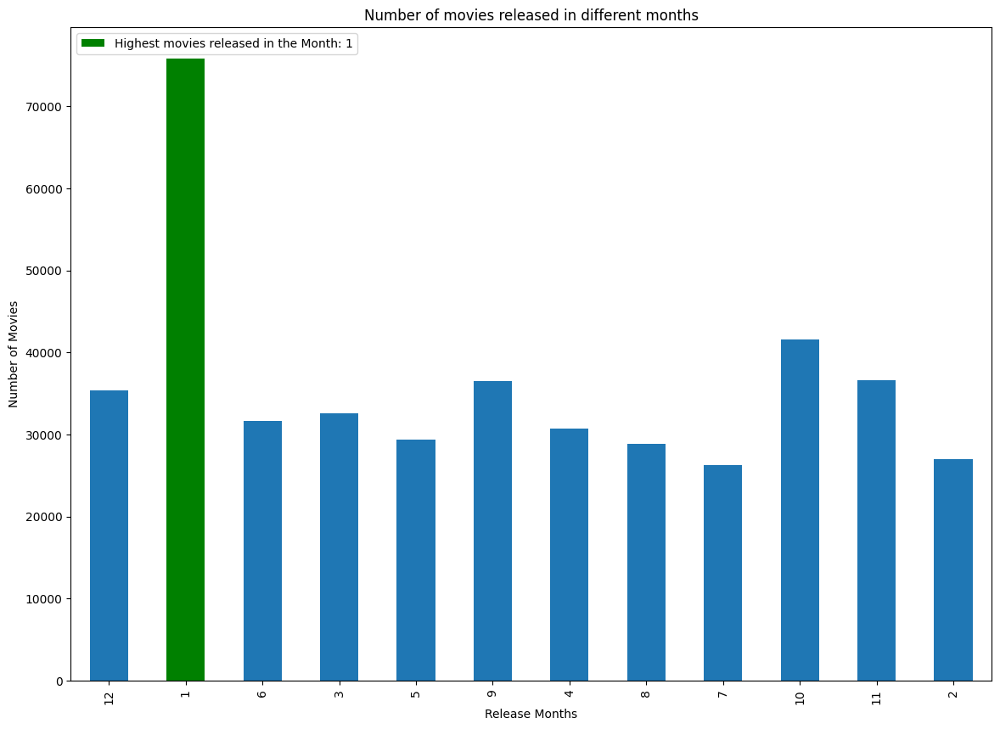

In [ ]:
### Convert PySpark DataFrame to Pandas DataFrame
movie_count_pd = movie_count_by_month.toPandas()

ax = movie_count_pd.plot(kind='bar', x='release_month', y='count', figsize=(14, 10))
plt.title('Number of movies released in different months')
plt.xlabel('Release Months')
plt.ylabel('Number of Movies')
plt.xticks(rotation=90)


highest_count = movie_count_pd.loc[movie_count_pd['count'].idxmax(), 'release_month']
### Highlight the highest genre bar in green
highlighted_patch = ax.patches[movie_count_pd.index[movie_count_pd['release_month'] == highest_count][0]]
highlighted_patch.set_facecolor('green')

ax.legend([highlighted_patch], [f'Highest movies released in the Month: {highest_count}'], loc='upper left')
plt.show()

###### **Insight**: Highest number of movies are released in month 1( January), followed by month 10(October) and 11(November), and lowest number of movies are released in month 7(July)

##### How does the number of action, drama and romance genre movies released change over a period from 2000 to 2023?

In [ ]:
### Selecting the movies between 2010 and 2023 that are of action, drama and romance genre
movies_genre_df = final_df.filter((final_df.release_year.between(2010,2023)))
action_drama_romance_movies = movies_genre_df.filter((movies_genre_df.Action ==1) | (movies_genre_df.Animation ==1) |
                                                      (movies_genre_df.Drama ==1) | (movies_genre_df.Mystery ==1) |
                                                      (movies_genre_df.Crime ==1) | (movies_genre_df.Fantasy ==1) |
                                                      (movies_genre_df.Romance ==1) | (movies_genre_df.Horror ==1) )

action_drama_romance_movies_count = action_drama_romance_movies.groupBy("release_year") \
                .agg({"Action":"sum", "Animation":"sum","Drama":"sum","Mystery":"sum", "Crime":"sum","Fantasy":"sum", "Romance":"sum", "Horror":"sum"}) \
                .orderBy("release_year")
action_drama_romance_movies_count.show()

+------------+--------------+-----------+------------+------------+----------+------------+----------+-----------+
|release_year|sum(Animation)|sum(Horror)|sum(Fantasy)|sum(Romance)|sum(Drama)|sum(Mystery)|sum(Crime)|sum(Action)|
+------------+--------------+-----------+------------+------------+----------+------------+----------+-----------+
|        2010|           765|        769|         301|         792|      2582|         240|       340|        703|
|        2011|           816|        873|         342|         804|      2876|         255|       341|        726|
|        2012|           805|        985|         362|         883|      3126|         270|       396|        710|
|        2013|           954|       1070|         405|         957|      3564|         294|       460|        800|
|        2014|           983|       1256|         428|        1060|      3825|         388|       461|        798|
|        2015|          1017|       1323|         489|        1176|      4209|  

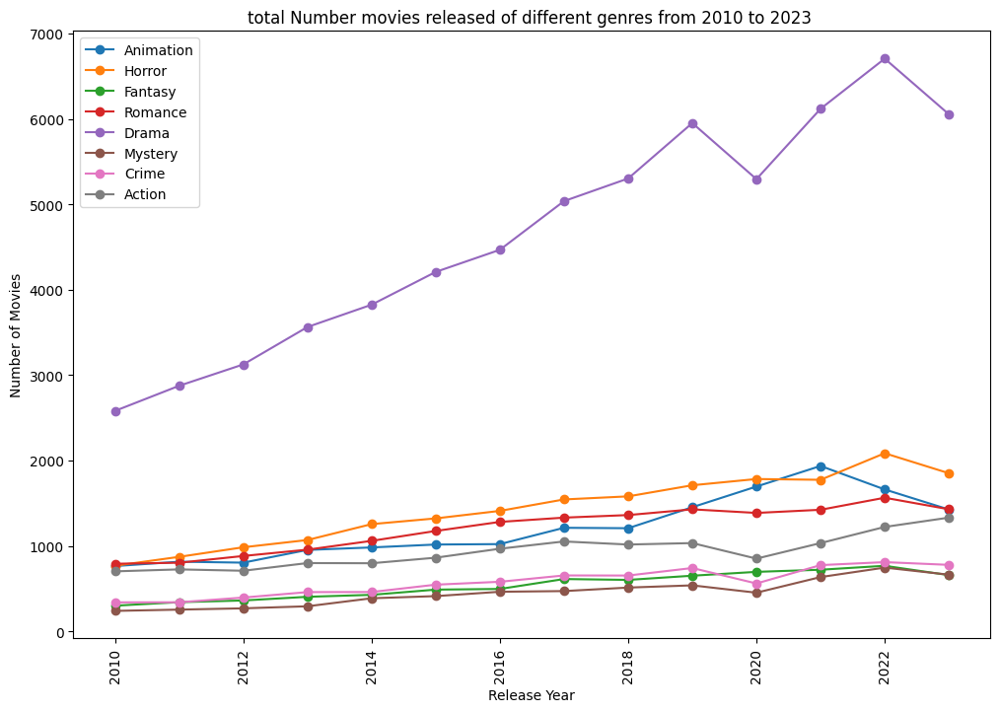

In [ ]:
#### Visualization to compare the total number of drama,action and romance genre movies released from 2010 to 2023
action_drama_romance_movies_count_pd = action_drama_romance_movies_count.toPandas()
ax = action_drama_romance_movies_count_pd.plot(kind='line', x='release_year', marker ='o', figsize=(12, 8))
plt.title('total Number movies released of different genres from 2010 to 2023 ')
plt.xlabel('Release Year')
plt.ylabel('Number of Movies')
plt.xticks(rotation=90)
plt.legend(["Animation","Horror","Fantasy","Romance", "Drama","Mystery", "Crime", "Action"])
plt.show()

###### **Insight:** It is evident that Higher number of Drama genre movies are relased from 2010 to 2023 compared to other genres. Also, there is increasing number of movies released in drama genres over the years although some fluctuations, and the release of other genre movies are experience almost constant or slow increase over the years.

##### How does the number movies released in December and January month change over a period from 2010 to 2023?

In [ ]:
### Selecting the movies between 2010 and 2023 that are released in december month
dec_month_movies = final_df.filter((final_df.release_year.between(2010,2023)) & (final_df['release_month'] == 12))
dec_month_movies_count = dec_month_movies.groupBy("release_year").count().orderBy("release_year")
### sorting by count to find out which year higher number of movies are released in December
dec_month_movies_count_sorted = dec_month_movies_count.orderBy('count', ascending =False)
dec_month_movies_count_sorted.show(5)

+------------+-----+
|release_year|count|
+------------+-----+
|        2021| 1916|
|        2022| 1774|
|        2020| 1752|
|        2019| 1597|
|        2018| 1363|
+------------+-----+
only showing top 5 rows



In [ ]:
### Selecting the  movies between 2010 and 2023 that are released in January month
jan_month_movies = final_df.filter((final_df.release_year.between(2010,2023)) & (final_df['release_month'] == 11))
jan_month_movies_count = jan_month_movies.groupBy("release_year").count().orderBy("release_year") \
                                                                        .withColumnRenamed("count", "January_count")
jan_month_movies_count.show()

+------------+-------------+
|release_year|January_count|
+------------+-------------+
|        2010|          796|
|        2011|          924|
|        2012|         1003|
|        2013|         1120|
|        2014|         1176|
|        2015|         1242|
|        2016|         1351|
|        2017|         1602|
|        2018|         1580|
|        2019|         1923|
|        2020|         1880|
|        2021|         2143|
|        2022|         2137|
|        2023|         1302|
+------------+-------------+



In [ ]:
## Joining the counts
monthy_movies_count = dec_month_movies_count.join(jan_month_movies_count, on ='release_year', how ="outer") \
                                            .withColumnRenamed("count", "december_count")
monthy_movies_count.show()

+------------+--------------+-------------+
|release_year|december_count|January_count|
+------------+--------------+-------------+
|        2010|           667|          796|
|        2011|           679|          924|
|        2012|           792|         1003|
|        2013|           899|         1120|
|        2014|           994|         1176|
|        2015|          1121|         1242|
|        2016|          1182|         1351|
|        2017|          1306|         1602|
|        2018|          1363|         1580|
|        2019|          1597|         1923|
|        2020|          1752|         1880|
|        2021|          1916|         2143|
|        2022|          1774|         2137|
|        2023|           875|         1302|
+------------+--------------+-------------+



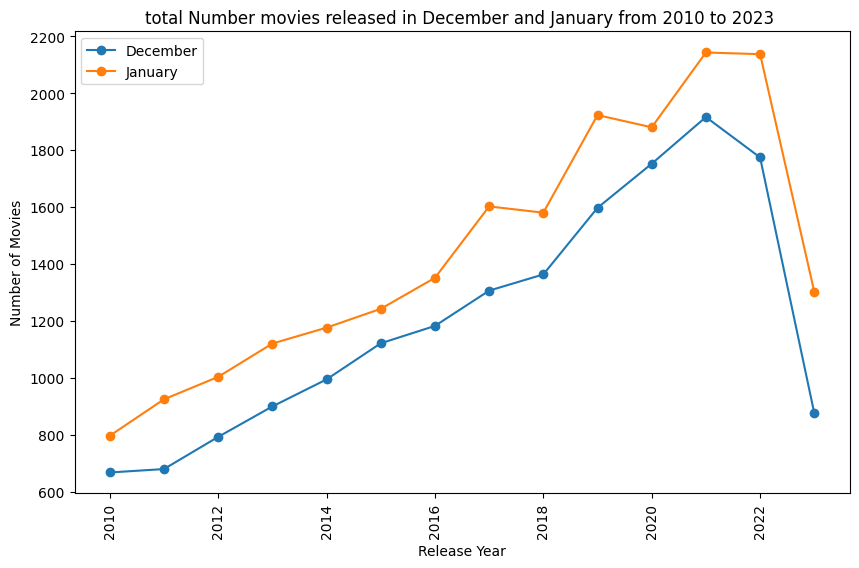

In [ ]:
#### Visualization of the total number of movies released in December and January from 2010 to 2023
monthy_movies_count_pd = monthy_movies_count.toPandas()
ax = monthy_movies_count_pd.plot(kind='line', x='release_year', y=['december_count','January_count'], marker ='o',figsize=(10, 6))
plt.title('total Number movies released in December and January from 2010 to 2023 ')
plt.xlabel('Release Year')
plt.ylabel('Number of Movies')
plt.xticks(rotation=90)
plt.legend(['December','January'])
plt.show()

###### **Insight:** Both in december and january there is similar kind of trends in the number of movies released.From 2010, there is a rapid increase in the number of movies released in december and january month, showing highest number of movies released in 2021, but in the subsequent years, the number of relased movies in december decreased significantly.

#### Original Movie Language Analysis

##### What is the distribution of original movie languages in our dataset? Are there any dominant languages in terms of frequency?

In [ ]:
## Here showing  the count of distribution of original movie languages
language_distribution = final_df.groupBy('original_language').count()
language_distribution.show()

+-----------------+------+
|original_language| count|
+-----------------+------+
|               en|234656|
|               cr|     9|
|               ne|   177|
|               vi|   387|
|               nb|    58|
|               ps|    27|
|               sl|   629|
|               ro|   942|
|               uz|    52|
|               ka|   344|
|               ur|   257|
|               ti|     4|
|               kw|     4|
|               lv|   749|
|               pl|  2788|
|               cn|  3351|
|               ln|     8|
|               st|    11|
|               hy|   174|
|               sk|   402|
+-----------------+------+
only showing top 20 rows



The language code "en" corresponds to English, "cr" represents Cree, "fy" stands for Western Frisian, "vi" denotes Vietnamese, "ne" indicates Nepali, "ty" signifies Tahitian, "nb" stands for Norwegian Bokmål, "ps" represents Pashto, "ro" denotes Romanian, "sl" signifies Slovenian, "uz" represents Uzbek, "ka" denotes Georgian, "ur" stands for Urdu, "ti" represents Tigrinya, "ba" stands for Bashkir, "kw" denotes Cornish, "nv" signifies Navajo, "lv" stands for Latvian, "pl" represents Polish, and "cn" signifies Chinese.

In [ ]:
def pieplot(df, col, lim=5, yname=None):
    classes = df.groupBy(col).count().orderBy('count', ascending=False)
    plt.figure(figsize=(10, 8))
    pd_df = classes.limit(lim).toPandas()

    ax = pd_df.plot(kind='pie', y='count', labels=pd_df[col], autopct='%1.1f%%', legend=False)
    plt.ylabel(yname)
    language_names = {
        "en": "English",
        "ja": "Japanese",
        "fr": "French",
        "de": "German",
        "es": "Spanish"
    }
    legend_labels = [f'{language_names.get(label, label)} ({percentage:.1f}%)' for label, percentage in zip(pd_df[col], pd_df['count'] / pd_df['count'].sum() * 100)]
    plt.legend(legend_labels, loc="best", bbox_to_anchor=(1, 0.5))
    plt.title("Distribution of top 5 movie languages")
    plt.axis('equal')


    plt.show()

<Figure size 1000x800 with 0 Axes>

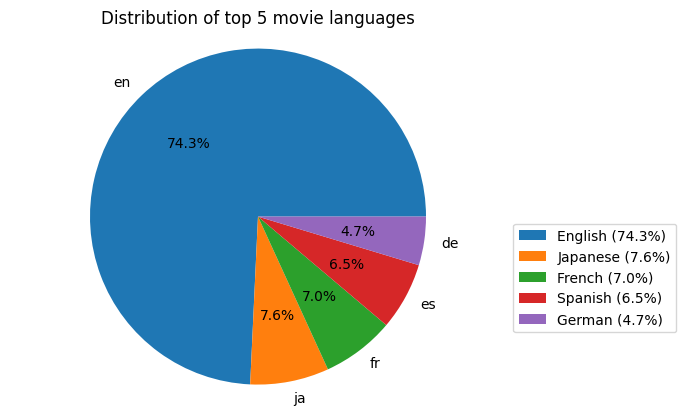

In [ ]:
pieplot(final_df, 'original_language')

###### Insight: Higher percentage of movies are in English as original Language compared to ther othe languages, which shows a dominance of english language movies in the dataset.

In [ ]:
def barplot(df, col, lim=10, yname=None):
    classes = df.groupBy(col).count().orderBy('count', ascending=False)

    # Take first 'lim' number of rows and convert to pandas
    pd_df = classes.limit(lim).toPandas()

    # Making plot
    ax = pd_df.plot(kind='bar', x=col)
    plt.ylabel(yname)

    # Find the item with the highest count
    highest_freq = pd_df.loc[pd_df['count'].idxmax(), col]

    # Highlight the highest genre bar in green
    highlighted_patch = ax.patches[pd_df.index[pd_df[col] == highest_freq][0]]
    highlighted_patch.set_facecolor('green')

    # Add legend
    ax.legend([highlighted_patch], [f'Highest count: {highest_freq}'], loc='upper right')
    for index, value in enumerate(pd_df['count']):
        ax.text(index, value, str(value), ha='center', va='bottom')
    plt.show()

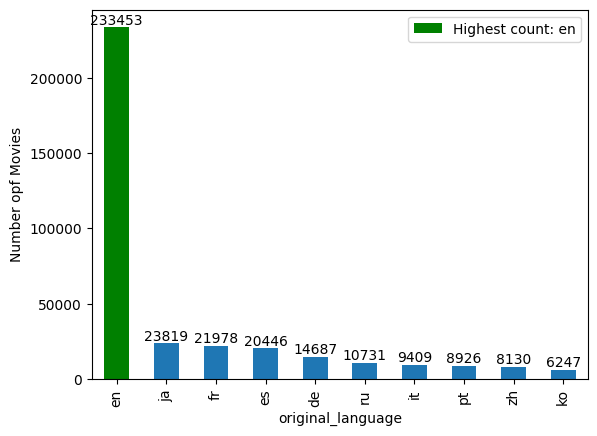

In [ ]:
barplot(final_df, 'original_language', yname='Number opf Movies')

###### **Insight:** The number of movies with English as original langue outnumber the number movies in other languages.

##### How does number of movies released with english as original language change over a period from 2010 to 2023?

In [ ]:
### Selecting the english language movies between 2010 and 2023
english_movies = final_df.filter((final_df.release_year.between(2010,2023)) & (final_df['original_language'] == 'en'))
english_movies_count = english_movies.groupBy("release_year").count().orderBy("release_year")
english_movies_count.show()

+------------+-----+
|release_year|count|
+------------+-----+
|        2010| 5046|
|        2011| 5549|
|        2012| 6048|
|        2013| 6725|
|        2014| 7101|
|        2015| 7340|
|        2016| 7596|
|        2017| 8649|
|        2018| 8679|
|        2019| 9542|
|        2020| 9892|
|        2021|10478|
|        2022|10530|
|        2023|10165|
+------------+-----+



In [ ]:
### sorting by count to find out which year higher number of english movies released
english_movies_count_sorted = english_movies_count.orderBy('count', ascending =False)
english_movies_count_sorted.show(5)

+------------+-----+
|release_year|count|
+------------+-----+
|        2022|10530|
|        2021|10478|
|        2023|10165|
|        2020| 9892|
|        2019| 9542|
+------------+-----+
only showing top 5 rows



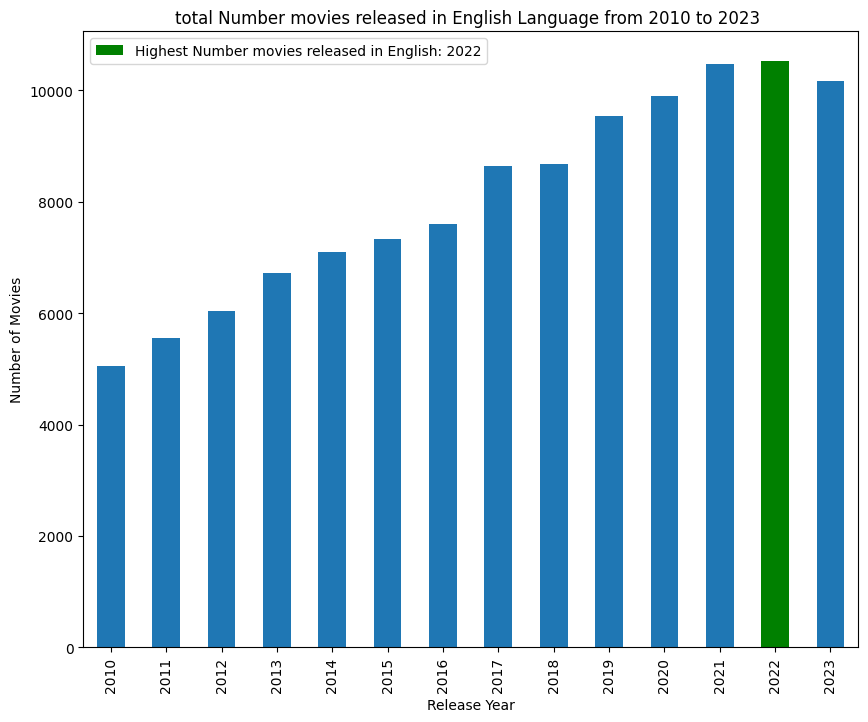

In [ ]:
#### Visualization of the total number of movies to find out which year higher number of english movies released
english_movies_count_pd = english_movies_count.toPandas()
ax = english_movies_count_pd.plot(kind='bar', x='release_year', y='count', figsize=(10, 8))
plt.title('total Number movies released in English Language from 2010 to 2023 ')
plt.xlabel('Release Year')
plt.ylabel('Number of Movies')
plt.xticks(rotation=90)

highest_count = english_movies_count_pd.loc[english_movies_count_pd['count'].idxmax(), 'release_year']
highlighted_patch = ax.patches[english_movies_count_pd.index[english_movies_count_pd['release_year'] == highest_count][0]]
highlighted_patch.set_facecolor('green')

ax.legend([highlighted_patch], [f'Highest Number movies released in English: {highest_count}'], loc='best')
plt.show()

###### **Insight:** Between 2010-2023, the highest number of english movies released in 2022 and lowest number of english movies released in 2010.

#### Analysis of release Status

##### What is the distribution of movies across different release status?

In [ ]:
## Finding the unique values in  status column to see different release status
final_df.select('status').distinct().show()

+---------------+
|         status|
+---------------+
|        Rumored|
|       Released|
|  In Production|
|       Canceled|
|        Planned|
|Post Production|
+---------------+



In [ ]:
## Getting number of movies of different  release status
movie_count_by_status = final_df.groupBy("status").count()
movie_count_by_status_sorted = movie_count_by_status.orderBy('count', ascending=False)
movie_count_by_status_sorted.show()

+---------------+------+
|         status| count|
+---------------+------+
|       Released|431129|
|  In Production|  1170|
|Post Production|   859|
|        Planned|   224|
|        Rumored|     4|
|       Canceled|     2|
+---------------+------+



In [ ]:
def barplot(df, col, lim=10, yname=None):
    # Group by column and count the number of rows in each group
    classes = df.groupBy(col).count().orderBy('count', ascending=False)

    # Limit the number of rows to the specified limit
    pd_df = classes.limit(lim).toPandas()
    ax = pd_df.plot(kind='bar', x=col, legend=False)
    plt.ylabel(yname)


    for index, value in enumerate(pd_df['count']):
        ax.text(index, value, str(value), ha='center', va='bottom')
    plt.show()

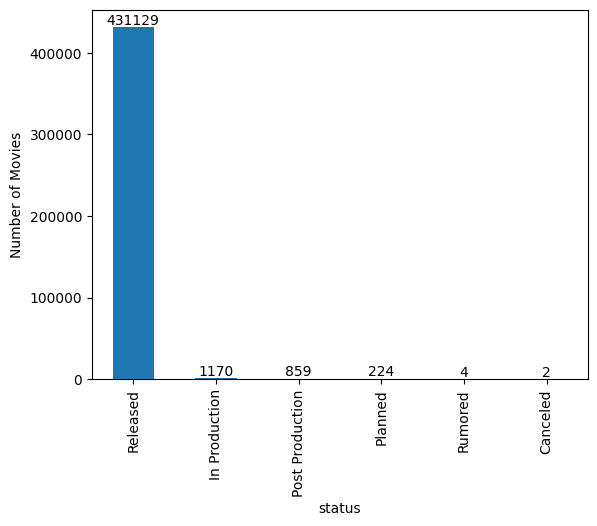

In [ ]:
barplot(final_df, 'status', yname='Number of Movies')

###### Insight: The number of relasead movies outnumbers the number of movies having other Release status.

##### Is there any increasing or decreasing trends in the number of released movies from 1990  to 2023?

In [ ]:
### Selecting the english language movies between 1990 and 2023
released_movies = final_df.filter((final_df.release_year.between(1990,2023)) & (final_df['status'] == "Released"))
released_movies_count = released_movies.groupBy("release_year").count().orderBy("release_year")
released_movies_count.show()

+------------+-----+
|release_year|count|
+------------+-----+
|        1990| 3318|
|        1991| 3298|
|        1992| 3318|
|        1993| 3336|
|        1994| 3423|
|        1995| 3492|
|        1996| 3405|
|        1997| 3661|
|        1998| 3678|
|        1999| 3909|
|        2000| 4103|
|        2001| 4511|
|        2002| 5025|
|        2003| 5483|
|        2004| 6197|
|        2005| 6727|
|        2006| 7467|
|        2007| 7660|
|        2008| 8174|
|        2009| 8523|
+------------+-----+
only showing top 20 rows



In [ ]:
### sorting by count to find out which year higher number of movies are released
released_movies_count_sorted = released_movies_count.orderBy('count', ascending =False)
released_movies_count_sorted.show(5)

+------------+-----+
|release_year|count|
+------------+-----+
|        2022|20807|
|        2021|20106|
|        2019|18795|
|        2020|18545|
|        2023|17107|
+------------+-----+
only showing top 5 rows



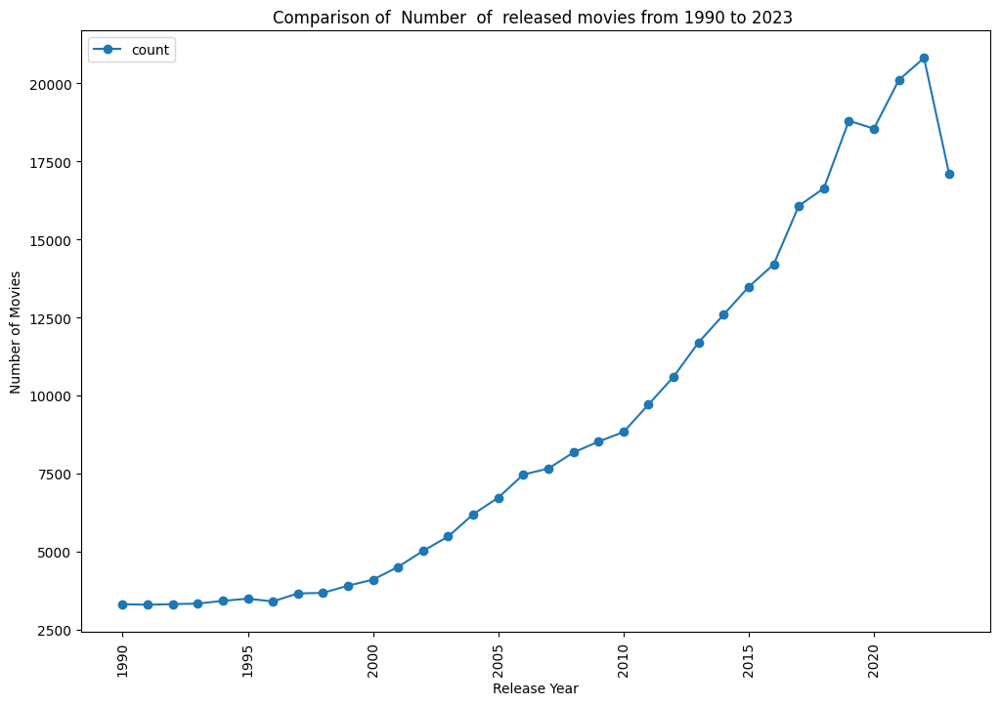

In [ ]:
#### Visualization of the total number of movies released  from 1990 to 2023
released_movies_count_pd = released_movies_count.toPandas()
ax = released_movies_count_pd.plot(kind='line', x='release_year', y='count', marker ='o',figsize=(12, 8))
plt.title('Comparison of  Number  of  released movies from 1990 to 2023 ')
plt.xlabel('Release Year')
plt.ylabel('Number of Movies')
plt.xticks(rotation=90)

plt.show()

###### Insight: There is a gradual increasing trend in the number of released movies from 1990 to 2022, althought the number of released movies decreased in 2023.

#### Production Country Analysis

##### What is the comparative movie production count in United States of America, United Kingdom, France, Japan, China, Netherlands, and India?

In [ ]:
### Here , Creating separate columns for these production countries and and assign a value of 1 to these columns if a movie's production country matches the corresponding country; otherwise, assign a value of 0.

selected_production_countries = ['United States of America', 'United Kingdom', 'France', 'Japan','India','Netherlands']

for country in selected_production_countries:
    final_df = final_df.withColumn(country.replace(' ', '_'), \
                            when(final_df.production_countries.contains(country), 1).otherwise(0))

In [ ]:
#### Here showing the movie counts produced in  these selected countries
selected_production_countries = ['United_States_of_America', 'United_Kingdom', 'France', 'Japan','India','Netherlands']
production_country_count = []
for country in selected_production_countries:
    count = final_df.filter(col(country) == 1).count()
    production_country_count.append((country, count))


production_country_count_df = spark.createDataFrame(production_country_count, ['selected_production_countries', 'Count'])
production_country_count_df.show()

+-----------------------------+------+
|selected_production_countries| Count|
+-----------------------------+------+
|         United_States_of_...|110820|
|               United_Kingdom| 26295|
|                       France| 23758|
|                        Japan| 23571|
|                        India| 13885|
|                  Netherlands|  3693|
+-----------------------------+------+



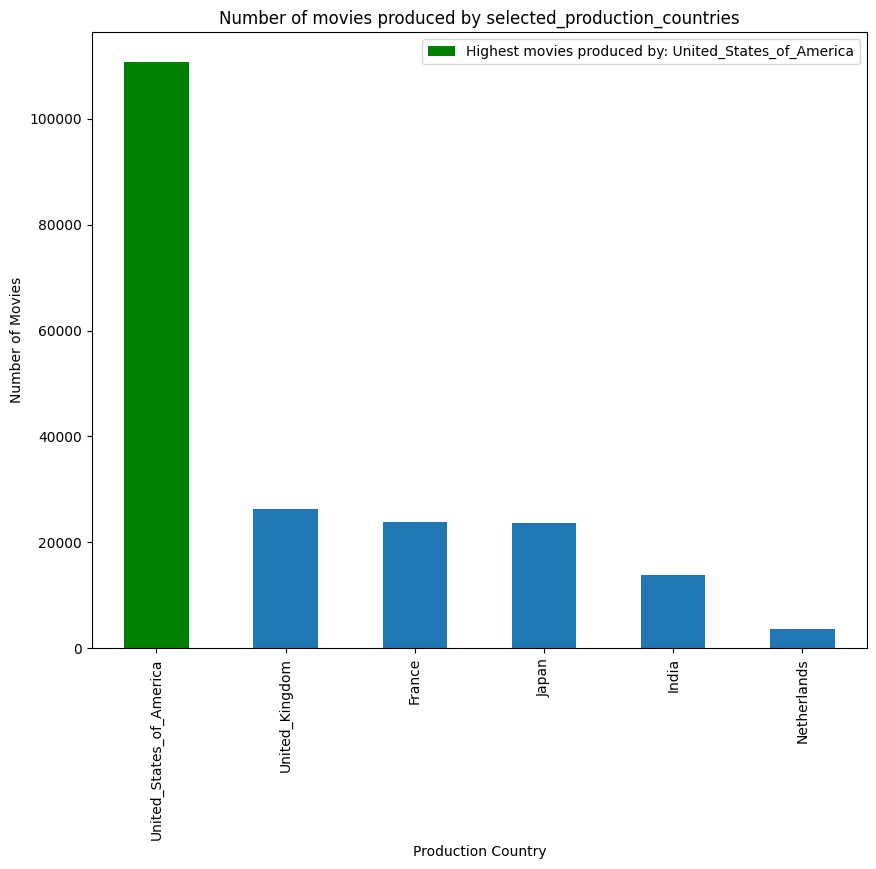

In [ ]:
### Here, Visualizing the number of movies produced in the selected countries to show comparison
production_count_pd = production_country_count_df.toPandas()

ax = production_count_pd.plot(kind='bar', x='selected_production_countries', y='Count', figsize=(10, 8))
plt.title('Number of movies produced by selected_production_countries')
plt.xlabel('Production Country')
plt.ylabel('Number of Movies')
plt.xticks(rotation=90)

highest_count = production_count_pd.loc[production_count_pd['Count'].idxmax(), 'selected_production_countries']
highlighted_patch = ax.patches[production_count_pd.index[production_count_pd['selected_production_countries'] == highest_count][0]]
highlighted_patch.set_facecolor('green')

ax.legend([highlighted_patch], [f'Highest movies produced by: {highest_count}'], loc='best')
plt.show()

###### **Insight:** It is evident that, according to the dataset, most number of movies are produced in United States, followed by United Kingdom.

##### How does the total revenue change for movies produced in United States from 2015 to 2023?

In [ ]:
### Selecting the USA produced movies between 2015 and 2023
US_movies = final_df.filter((final_df.release_year.between(2015,2023)) & (final_df.revenue > 0) & (final_df.United_States_of_America == 1))
US_revenues = US_movies.groupBy("release_year").agg({"revenue": "sum"}).orderBy("release_year")
US_revenues.show()

+------------+---------------+
|release_year|   sum(revenue)|
+------------+---------------+
|        2015|2.2509588536E10|
|        2016|2.5633850315E10|
|        2017|2.4639490626E10|
|        2018|2.5305247829E10|
|        2019| 2.087371851E10|
|        2020|  2.942760822E9|
|        2021|1.1458486888E10|
|        2022|1.4061406953E10|
|        2023|1.1539680813E10|
+------------+---------------+



In [ ]:
### sorting the Total Revenue to find out which year USA generates higher revenue
US_revenues_sorted = US_revenues.orderBy('sum(revenue)', ascending =False)
US_revenues_sorted.show(5)

+------------+---------------+
|release_year|   sum(revenue)|
+------------+---------------+
|        2016|2.5633850315E10|
|        2018|2.5305247829E10|
|        2017|2.4639490626E10|
|        2015|2.2509588536E10|
|        2019| 2.087371851E10|
+------------+---------------+
only showing top 5 rows



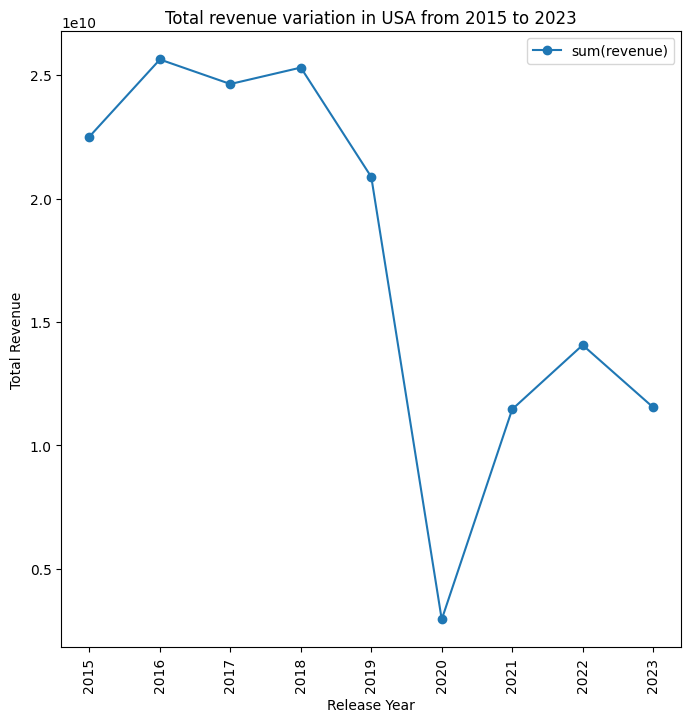

In [ ]:
#### Visualization of the total revenue variation in USA from 2015 to 2023
US_revenues_pd = US_revenues.toPandas()
US_revenues_pd.plot(kind='line', x='release_year', y='sum(revenue)', marker='o', figsize=(8, 8))
plt.title('Total revenue variation in USA from 2015 to 2023')
plt.xlabel('Release Year')
plt.ylabel('Total Revenue')
plt.xticks(rotation=90)
plt.show()

###### **Insight:** In the year 2016, USA generates the highest revenue, but the revenue experience a signifcant decrease in the year 2022, but in the subsequesnt year 2021, there is a increase in the total revenue in USA.

##### What is the comparative movie revenue in United States of America, United Kingdom, France, Japan, China, Netherlands, and India in the year 2022?

In [ ]:
#### Here showing the total movie revenues produced in  these selected countries and considering the movies having nonzero revenues
movie_df_2022 = final_df.filter((final_df.release_year == 2022) & (final_df.revenue > 0))
selected_production_countries = ['United_States_of_America', 'United_Kingdom', 'France', 'Japan','India']
production_country_revenue = []
for country in selected_production_countries:
    revenue_val = movie_df_2022.filter(col(country) == 1).agg({"revenue": "sum"}).collect()[0][0]
    production_country_revenue.append((country, revenue_val))


production_country_revenue_2022 = spark.createDataFrame(production_country_revenue, ['selected_production_countries', 'Revenue_2022'])
production_country_revenue_2022.show()

+-----------------------------+---------------+
|selected_production_countries|   Revenue_2022|
+-----------------------------+---------------+
|         United_States_of_...|1.4061406953E10|
|               United_Kingdom|  1.011445709E9|
|                       France|   2.92850447E8|
|                        Japan|  1.599419912E9|
|                        India|   6.21188926E8|
+-----------------------------+---------------+



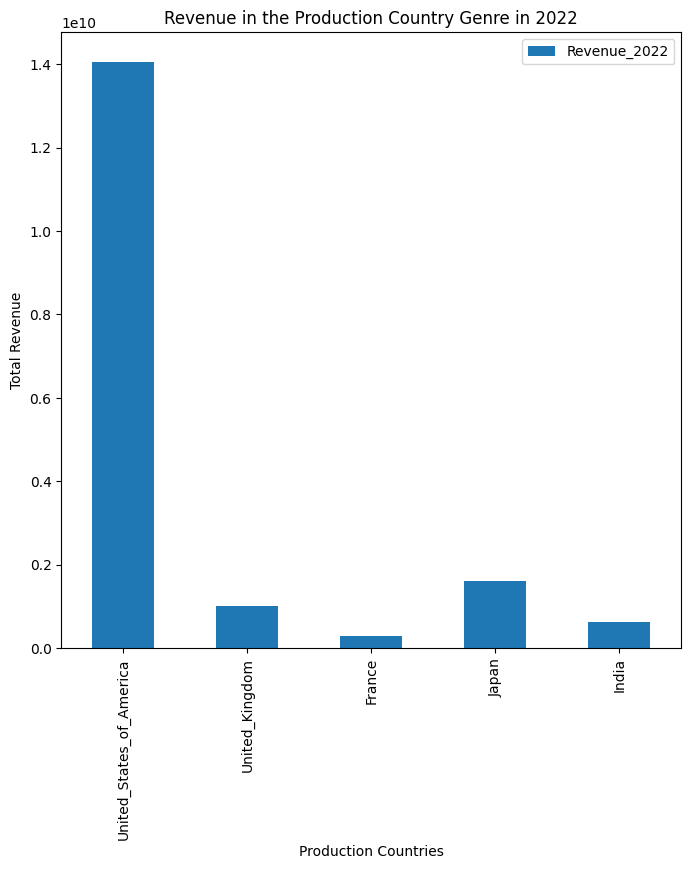

In [ ]:
#### Visualization of the average revenue variation across different production countries in the year 2022 through a bar chart
production_country_revenue_2022_pd = production_country_revenue_2022.toPandas()
production_country_revenue_2022_pd.plot(kind='bar', x='selected_production_countries', y='Revenue_2022', figsize=(8, 8))
plt.title('Revenue in the Production Country Genre in 2022')
plt.xlabel('Production Countries')
plt.ylabel('Total Revenue')
plt.xticks(rotation=90)
plt.show()

###### **Insight:** From the visualization it is evident that, In USA, the total revenue is higher comparative to the other countries in 2022

#### Budget Analysis

##### What are top 5 highest budget movies and show the revenue, ratings  and popularity of these movies?

In [ ]:
#### Finding the movies having the highest budget
top_movies = final_df.orderBy(col("budget").desc()).select("title", "budget","revenue","avg_rating","popularity").limit(5)
top_movies.show()

+--------------------+---------+-------------+----------+----------+
|               title|   budget|      revenue|avg_rating|popularity|
+--------------------+---------+-------------+----------+----------+
|Avatar: The Way o...|    4.6E8|2.320250281E9|     7.654|   241.285|
|   Lost in the Stars|4.17549E8|   3.340392E8|      6.33|    23.732|
|Pirates of the Ca...|   3.79E8|1.045713802E9|     6.538|    79.192|
|Avengers: Age of ...|   3.65E8|1.405403694E9|     7.276|    96.565|
|   Avengers: Endgame|   3.56E8|        2.8E9|     8.263|    91.756|
+--------------------+---------+-------------+----------+----------+



##### Is there any relationship between budget and revenue? ( Considering the movies released on 2023)

In [ ]:
## considering the movies released on 2023
movie_2023 = final_df.filter((final_df.release_year == 2023) & (final_df.budget >0))
budget_summary_df = movie_2023.select('budget').describe()
budget_summary_df.show()

+-------+-------------------+
|summary|             budget|
+-------+-------------------+
|  count|                118|
|   mean|5.451886026271187E7|
| stddev| 7.60272007466603E7|
|    min|            15000.0|
|    max|          4.17549E8|
+-------+-------------------+



In [ ]:
percentile_25 = movie_2023.approxQuantile("budget", [0.25], 0.001)
percentile_25

[7000000.0]

In [ ]:
median_budget = movie_2023.approxQuantile("budget", [0.5], 0.001)
median_budget

[25000000.0]

In [ ]:
percentile_75 = movie_2023.approxQuantile("budget", [0.75], 0.001)
percentile_75

[70000000.0]

In [ ]:
### I will categorize the budget column in three categories: low, medium and high ( for better analysis)
### lower budget : <=7000000.0
### medium budget: between(7000000.0 - 25000000.0)
### Highet Budget: >= 25000000.0
budget_categories = movie_2023.withColumn("budget_category",
                                                      when(col("budget") <=7000000.0, "low_budget")
                                                      .when((col("budget") >7000000.0) & (col("budget") <= 25000000.0), "medium_budget")
                                                      .otherwise("high_budget"))



#### Here, I  actually group the data by budget categories and then calculate avg  revenue
budget_revenue_df = budget_categories.groupBy("budget_category") \
    .agg({"revenue": "avg"}) \
    .withColumnRenamed("avg(revenue)", "average_revenue")

budget_revenue_df = budget_revenue_df.orderBy(when(col("budget_category")=='low_budget',1)
                                              .when(col("budget_category")=='medium_budget',2)
                                              .otherwise(3))
budget_revenue_df.show()


+---------------+--------------------+
|budget_category|     average_revenue|
+---------------+--------------------+
|     low_budget|        6070627.1875|
|  medium_budget|3.5443570222222224E7|
|    high_budget|2.2502046554237288E8|
+---------------+--------------------+



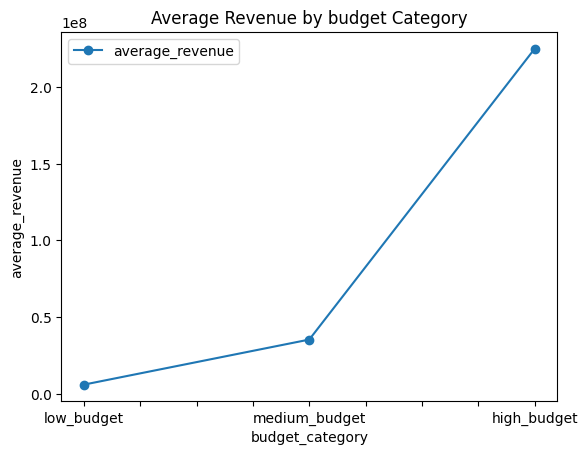

In [ ]:
budget_revenue_pd = budget_revenue_df.toPandas()

budget_revenue_pd.plot(kind='line', x='budget_category',
                       y='average_revenue', marker='o')


plt.title("Average Revenue by budget Category")
plt.xlabel("budget_category")
plt.ylabel("average_revenue")
plt.show()

###### **Insight:** High budget movies produce higher revenue compared to the lower budget movies

In [ ]:
from pyspark.sql.functions import corr

### Calculating the correlation between budget and revenue
cor_budget_revenue = final_df.stat.corr("budget","revenue")
cor_budget_revenue

0.757757919341402

###### **Insight:** As the correlation between  budget and revenue are positive and more than 0.75, that means  higher budget movies will result into higher revenues

##### How does the budget of movies produced in USA change over a period between 2000 and 2023 across Action Documentary, Drama genre?

In [ ]:
### Selecting the movies between 2010 and 2023 that are of documentary,action, drama ,and romance genre and produced in USA
from pyspark.sql.functions import avg

US_movies_df = final_df.filter((final_df.release_year.between(2010,2023)) & (final_df.budget >0) & (final_df['United_States_of_America'] ==1))
US_genre_budget_df = US_movies_df.groupBy("release_year").agg(
      avg(when(col('Documentary') == 1 , col("budget"))).alias("Documentary_Budget"),
      avg(when(col('Action') == 1 , col("budget"))).alias("Action_Budget"),
      avg(when(col('Drama') == 1 , col("budget"))).alias("Drama_Budget"),
      avg(when(col('Romance') == 1 , col("budget"))).alias("Romance_Budget")).orderBy('release_year')

US_genre_budget_df.show()

+------------+------------------+--------------------+--------------------+--------------------+
|release_year|Documentary_Budget|       Action_Budget|        Drama_Budget|      Romance_Budget|
+------------+------------------+--------------------+--------------------+--------------------+
|        2010| 1511441.892857143|         3.3712155E7|        1.69537295E7|2.4881329310344826E7|
|        2011|         1340508.0| 3.746731375268817E7|1.3804657826771654E7|1.5655566717391305E7|
|        2012| 650420.0697674418|4.6163375469879515E7| 1.645094405263158E7|1.7280268888888888E7|
|        2013|        1101855.66| 4.356324657575758E7|1.3070867035294117E7|   7802227.282051282|
|        2014|       483307.4375| 4.986290452439024E7|1.4530746612716762E7|            1.6353E7|
|        2015|219323.78333333333| 4.055634632941177E7|   9254699.264705881|1.1028773823529411E7|
|        2016| 556544.5681818182|4.4680731541284405E7|1.1758400222797928E7|      1.0693465375E7|
|        2017|319546.342105263

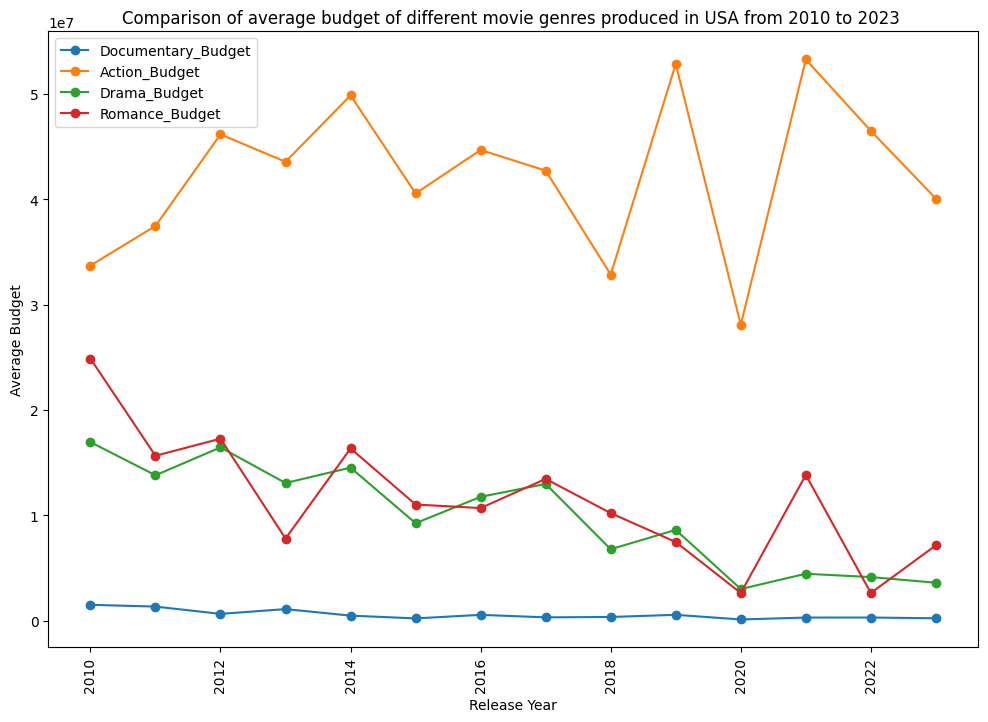

In [ ]:
#### Visualization to compare the average budget of drama,action , documentary and romance genre movies produced  in US from 2010 to 2023
US_genre_budget_pd = US_genre_budget_df.toPandas()
ax = US_genre_budget_pd.plot(kind='line', x='release_year', marker ='o', figsize=(12, 8))
plt.title('Comparison of average budget of different movie genres produced in USA from 2010 to 2023 ')
plt.xlabel('Release Year')
plt.ylabel('Average Budget')
plt.xticks(rotation=90)
plt.legend(["Documentary_Budget","Action_Budget","Drama_Budget","Romance_Budget"])
plt.show()

###### **Insight:** the average budget of Action movie are significatntly higher compared to the other selected genres over a period between 2010 and 2023. Also, there is a decreasing trend of  average budget for drama genre and almost a stable average  budget for documentary genre movies produced in USA over the chosen years.



#### Production Company Analysis

##### What is the comparative movie production count among Marvel Studios, Pixar, DC Entertainment, and Warner Bros. Pictures?

In [ ]:
### Here , Creating separate columns for these production companies and and assign a value of 1 to these columns if a movie's production company matches the corresponding value; otherwise, assign a value of 0.

production_companies = ['Marvel Studios', 'Pixar', 'DC Entertainment', 'Warner Bros. Pictures']
for company in production_companies:
    final_df = final_df.withColumn(company.replace('.', '_'), \
                                   when(final_df.production_companies.contains(company), 1).otherwise(0))

In [ ]:
#### Here showing the movie counts of these production companies
production_count = []
production_companies = ['Marvel Studios', 'Pixar', 'DC Entertainment', 'Warner Bros_ Pictures']
for company in production_companies:
    count = final_df.filter(col(company) == 1).count()
    production_count.append((company, count))


production_count_df = spark.createDataFrame(production_count, ['Production_company', 'Count'])
production_count_df.show()

+--------------------+-----+
|  Production_company|Count|
+--------------------+-----+
|      Marvel Studios|   82|
|               Pixar|  134|
|    DC Entertainment|  107|
|Warner Bros_ Pict...| 2727|
+--------------------+-----+



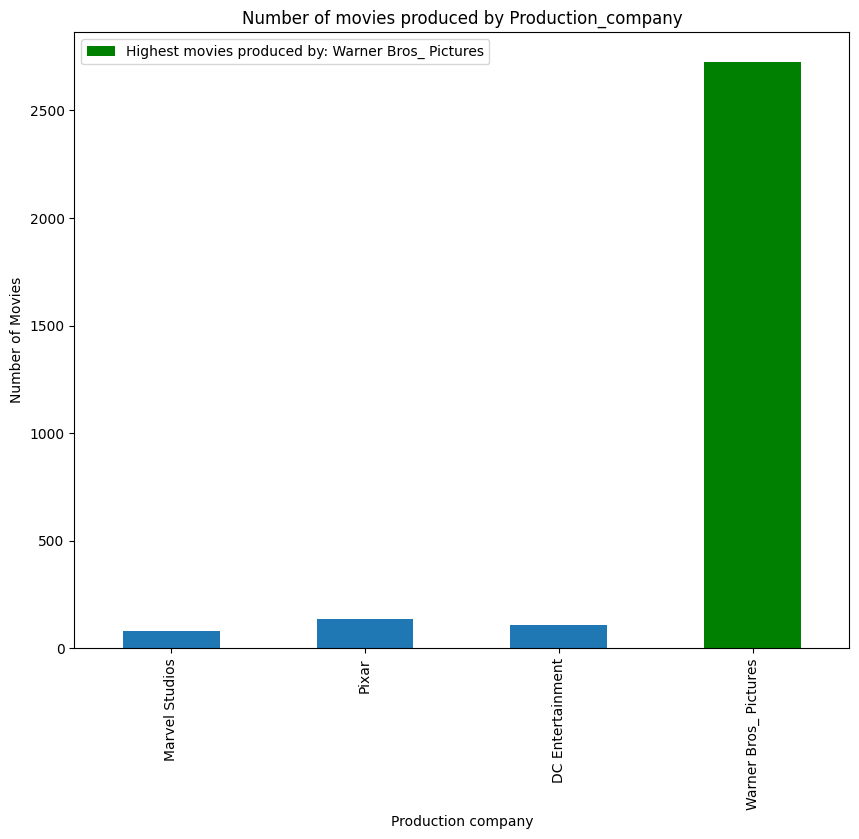

In [ ]:
### Here, Visualizing the number of movies produced by the companies to show comparison
production_count_pd = production_count_df.toPandas()

ax = production_count_pd.plot(kind='bar', x='Production_company', y='Count', figsize=(10, 8))
plt.title('Number of movies produced by Production_company')
plt.xlabel('Production company')
plt.ylabel('Number of Movies')
plt.xticks(rotation=90)

highest_count = production_count_pd.loc[production_count_pd['Count'].idxmax(), 'Production_company']
highlighted_patch = ax.patches[production_count_pd.index[production_count_pd['Production_company'] == highest_count][0]]
highlighted_patch.set_facecolor('green')

ax.legend([highlighted_patch], [f'Highest movies produced by: {highest_count}'], loc='upper left')
plt.show()

###### **Insight:** Among the selected production companies, Warner Bros Pictures produces higher number of movies  and Marvel Studies produces the lower number of movies compared to the  other companies and

##### Among Marvel Studios, Pixar, DC Entertainment, and Warner Bros. Pictures, which company gained highest revenue in between 2020 to 2023?

In [ ]:
### Firstly, filtering the movies having release year of 2023
moviedf_2023 = final_df.filter((col("release_year") <= 2023) & (col("release_year") >= 2020))
selected_production_companies = ['Marvel Studios', 'Pixar', 'DC Entertainment', 'Warner Bros_ Pictures']

### Calculating the total revenue for for the selected production companies

revenue_by_companies = []
for company in selected_production_companies:
    total_revenue = moviedf_2023.filter(col(company) == 1).agg({"revenue": "sum"}).collect()[0][0]
    revenue_by_companies.append((company, total_revenue))

### Creating a dataframe for revenue for  selected production companies
revenue_df_2023 = spark.createDataFrame(revenue_by_companies, ["Production Company", "Total Revenue 2023"])
revenue_df_2023.show()

+--------------------+------------------+
|  Production Company|Total Revenue 2023|
+--------------------+------------------+
|      Marvel Studios|     7.033213954E9|
|               Pixar|     1.060178285E9|
|    DC Entertainment|            2.03E8|
|Warner Bros_ Pict...|     4.114406714E9|
+--------------------+------------------+



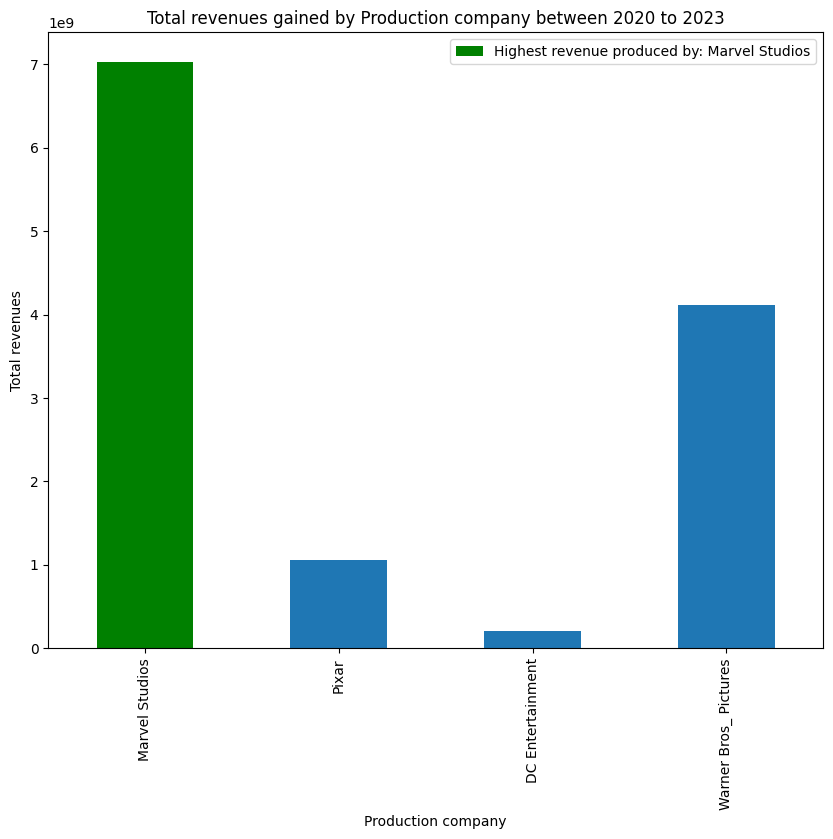

In [ ]:
### Here, Visualizing the revenues produced by the companies to show comparison
revenue_pd = revenue_df_2023.toPandas()

ax = revenue_pd.plot(kind='bar', x='Production Company', y='Total Revenue 2023', figsize=(10, 8))
plt.title('Total revenues gained by Production company between 2020 to 2023')
plt.xlabel('Production company')
plt.ylabel('Total revenues')
plt.xticks(rotation=90)

highest_count = revenue_pd.loc[revenue_pd['Total Revenue 2023'].idxmax(), 'Production Company']
highlighted_patch = ax.patches[revenue_pd.index[revenue_pd['Production Company'] == highest_count][0]]
highlighted_patch.set_facecolor('green')

ax.legend([highlighted_patch], [f'Highest revenue produced by: {highest_count}'], loc='upper right')
plt.show()

###### **Insights:** Marvel Studies  gained highest revenues between 2020 to 2023 among the selected production companies ( Pixar, DC Entertainment, Warner Bros Pictures)

##### How does the total revenue change for movies produced by Warner Bros Pictures from 2010 to 2023?

In [ ]:
### Selecting the Warner Bros produced movies between 2010 and 2023
WB_movies = final_df.filter((final_df.release_year.between(2010,2023)) & (final_df.revenue > 0) & (final_df['Warner Bros_ Pictures'] == 1))
WB_revenues = WB_movies.groupBy("release_year").agg({"revenue": "sum"}).orderBy("release_year")
WB_revenues.show()

+------------+-------------+
|release_year| sum(revenue)|
+------------+-------------+
|        2010|3.044779517E9|
|        2011|3.234587915E9|
|        2012|3.221648666E9|
|        2013|3.244627146E9|
|        2014|3.220254085E9|
|        2015|1.680217434E9|
|        2016|3.889126702E9|
|        2017|2.900471957E9|
|        2018|4.768756559E9|
|        2019|1.376512235E9|
|        2020| 7.98169928E8|
|        2021| 7.30750703E8|
|        2022| 1.75623575E9|
|        2023| 8.29250338E8|
+------------+-------------+



In [ ]:
### sorting by the Total Revenue to find out which year Warner Bros Pictures generates higher revenue
WB_revenues_sorted = WB_revenues.orderBy('sum(revenue)', ascending =False)
WB_revenues_sorted.show(5)

+------------+-------------+
|release_year| sum(revenue)|
+------------+-------------+
|        2018|4.768756559E9|
|        2016|3.889126702E9|
|        2013|3.244627146E9|
|        2011|3.234587915E9|
|        2012|3.221648666E9|
+------------+-------------+
only showing top 5 rows



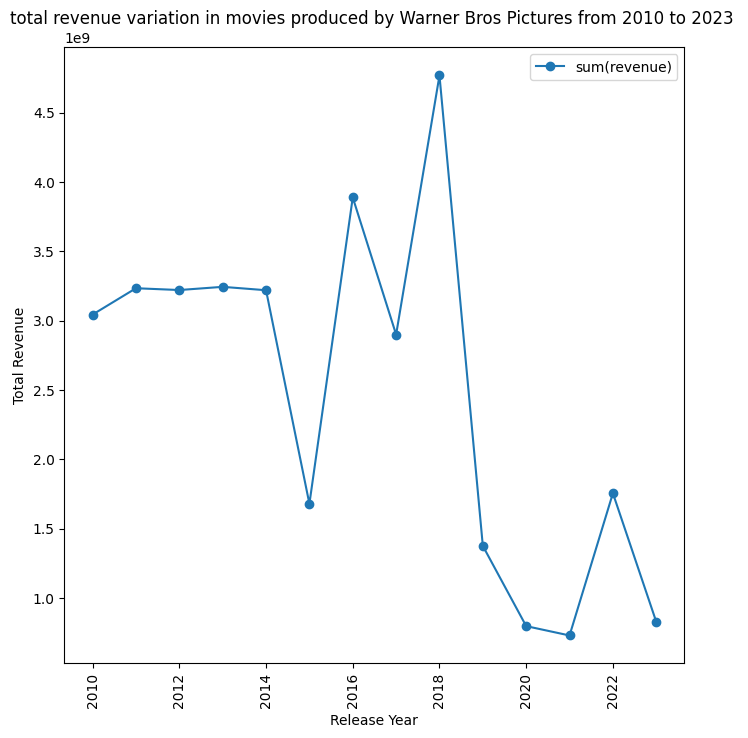

In [ ]:
#### Visualization of the total revenue variation in movies produced by Warner Bros Pictures from 2010 to 2023
WB_revenues_pd = WB_revenues.toPandas()
WB_revenues_pd.plot(kind='line', x='release_year', y='sum(revenue)', marker='o', figsize=(8, 8))
plt.title('total revenue variation in movies produced by Warner Bros Pictures from 2010 to 2023 ')
plt.xlabel('Release Year')
plt.ylabel('Total Revenue')
plt.xticks(rotation=90)
plt.show()

###### **Insight:** In the year 2018,  Warner Bros Pictures produced movies generates higher revenue, but in the subsequent years (except  year 2022), there is a decrease in the revenue  for production company Warner Bros Pictures.

##### Among Marvel Studios, Pixar, DC Entertainment, and Warner Bros. Pictures, which company produced movies having higher average rating?

In [ ]:
selected_production_companies = ['Marvel Studios', 'Pixar', 'DC Entertainment', 'Warner Bros_ Pictures']

### Calculating the average ratings  for the selected production companies
rating_by_companies = []
for company in selected_production_companies:
    avg_ratings_by_company = final_df.filter(col(company) == 1).agg({"avg_rating": "avg"}).collect()[0][0]
    rating_by_companies.append((company, avg_ratings_by_company))

### Creating a dataframe for average rating for  selected production companies
rating_by_companies_df = spark.createDataFrame(rating_by_companies, ["Production Company", "Average_Rating"])
rating_by_companies_df.show()

+--------------------+-----------------+
|  Production Company|   Average_Rating|
+--------------------+-----------------+
|      Marvel Studios|7.084323076923079|
|               Pixar|6.886026785714285|
|    DC Entertainment|6.936367346938774|
|Warner Bros_ Pict...|6.511196521739132|
+--------------------+-----------------+



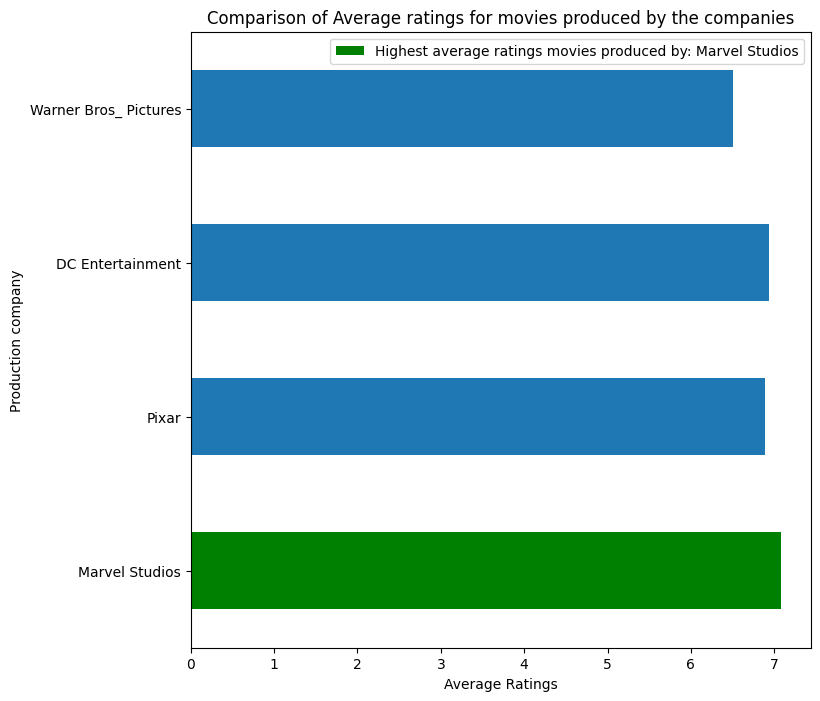

In [ ]:
### Here, Visualizing the average ratings for movies produced by the companies to show comparison
rating_by_companies_pd = rating_by_companies_df.toPandas()

ax = rating_by_companies_pd.plot(kind='barh', x='Production Company', y='Average_Rating', figsize=(8, 8))
plt.title('Comparison of Average ratings for movies produced by the companies')
plt.ylabel('Production company')
plt.xlabel('Average Ratings')
#plt.yticks(rotation=90)

highest_count = rating_by_companies_pd.loc[rating_by_companies_pd['Average_Rating'].idxmax(), 'Production Company']
highlighted_patch = ax.patches[rating_by_companies_pd.index[rating_by_companies_pd['Production Company'] == highest_count][0]]
highlighted_patch.set_facecolor('green')

ax.legend([highlighted_patch], [f'Highest average ratings movies produced by: {highest_count}'], loc='best')
plt.show()

###### Insight: Movies produced by Mravel Studies earns higher average ratings compared to other selected production companies ( Pixar, DC Entertainment, Warner Bros Pictures) , although the difference in average ratings  between these selected production companies is not particularly significant, which indicates a competetive environment.

#### Revenue Analysis

##### What are top 5 highest revenue movies and show the budget, ratings and popularity of these movies?

In [ ]:
#### Finding the movies having the highest revenue
top_movies = final_df.orderBy(col("revenue").desc()).select("title","revenue","budget","avg_rating","popularity").limit(5)
top_movies.show()

+--------------------+-------------+------+----------+----------+
|               title|      revenue|budget|avg_rating|popularity|
+--------------------+-------------+------+----------+----------+
|              Avatar|2.923706026E9|2.37E8|     7.573|    79.932|
|   Avengers: Endgame|        2.8E9|3.56E8|     8.263|    91.756|
|Avatar: The Way o...|2.320250281E9| 4.6E8|     7.654|   241.285|
|             Titanic|2.264162353E9| 2.0E8|       7.9|   102.348|
|Star Wars: The Fo...|2.068223624E9|2.45E8|     7.293|    66.772|
+--------------------+-------------+------+----------+----------+



##### How does revenue produced by action, drama and romance genre movies change over a period from 2000 to 2023?

In [ ]:
### Selecting the movies between 2010 and 2023 that are of action, drama and romance genre
movies_genre_revenue_df = final_df.filter((final_df.release_year.between(2010,2023)) & (final_df.revenue >0) )
movies_genre_revenue_df = movies_genre_revenue_df.groupBy("release_year").agg(
      avg(when(col('Documentary') == 1 , col("revenue"))).alias("Documentary_Revenue"),
      avg(when(col('Action') == 1 , col("revenue"))).alias("Action_Revenue"),
      avg(when(col('Drama') == 1 , col("revenue"))).alias("Drama_Revenue"),
      avg(when(col('Romance') == 1 , col("revenue"))).alias("Romance_Revenue")).orderBy('release_year')

movies_genre_revenue_df.show()

+------------+-------------------+--------------------+--------------------+--------------------+
|release_year|Documentary_Revenue|      Action_Revenue|       Drama_Revenue|     Romance_Revenue|
+------------+-------------------+--------------------+--------------------+--------------------+
|        2010|          6998090.2| 6.368324373043478E7|2.9164124260869566E7|3.9959565690721646E7|
|        2011|  5539465.617647059| 9.521059804950495E7|2.6801107412037037E7| 4.153761456164384E7|
|        2012|        4771158.625|1.1708089388349515E8| 4.004589613963964E7|3.9491926938271604E7|
|        2013|          4008146.0| 1.196949821111111E8| 3.004106910300429E7|       1.965968375E7|
|        2014|         1198703.75|1.3951434226363635E8| 2.925047330232558E7|3.3222707243902437E7|
|        2015| 1328965.1612903227|1.4002380702752292E8|2.9314204071129706E7| 3.150280308235294E7|
|        2016| 1929579.9090909092| 8.881636143312103E7| 2.638820181205674E7|3.3210114866666667E7|
|        2017|  7455

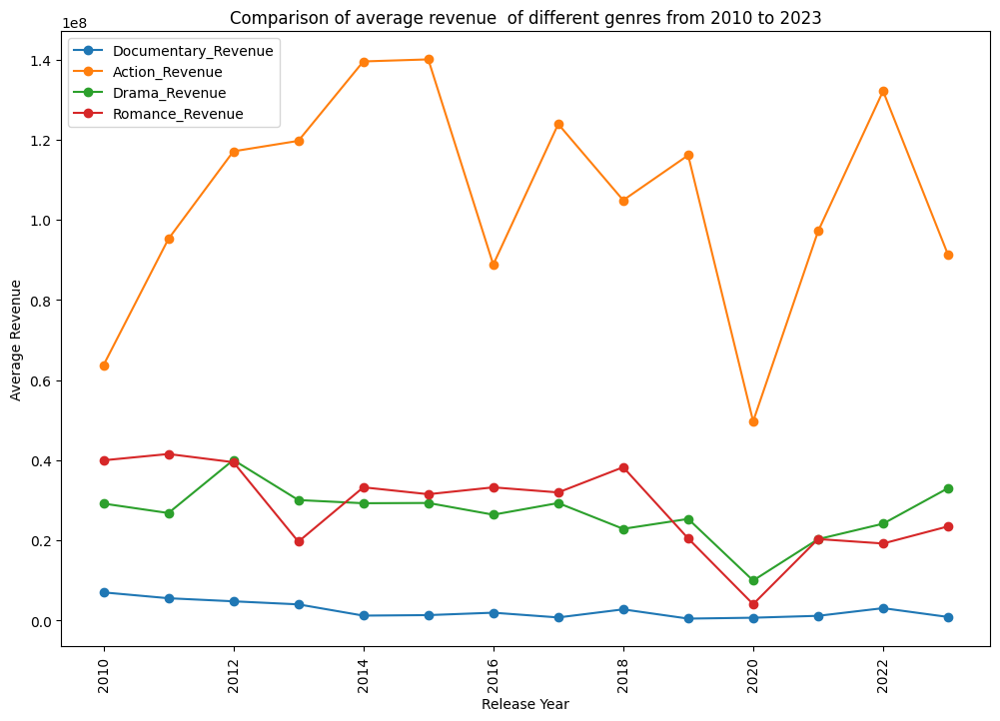

In [ ]:
#### Visualization to compare the average revenue of drama,action and romance genre movies released from 2010 to 2023
movies_genre_revenue_pd = movies_genre_revenue_df.toPandas()
ax = movies_genre_revenue_pd.plot(kind='line', x='release_year', marker ='o', figsize=(12, 8))
plt.title('Comparison of average revenue  of different genres from 2010 to 2023')
plt.xlabel('Release Year')
plt.ylabel('Average Revenue')
plt.xticks(rotation=90)
plt.legend(["Documentary_Revenue","Action_Revenue","Drama_Revenue","Romance_Revenue"])
plt.show()

###### **Insight:** Movies of Action genre gains higher average revenue compared to the  other genres from 2010 to 2023. Also, we can see that,  average revenue generated from documentary genre movies stayed almost consistent and generated lowest revenue among the selected genres in between 2010 and 2023, while for the other genres (Drama, Action, Romance), the average revenue shows fluctuations in between the years.

#### Analysis of Movie Category on the basis of 'Adult' column

In [ ]:
## Here showing  the count of distribution of movies whether is adult category or not
adult_category_distribution = final_df.groupBy('adult').count()
adult_category_distribution.show()

+-----+------+
|adult| count|
+-----+------+
| true|  8686|
|false|424702|
+-----+------+



<Figure size 1400x1000 with 0 Axes>

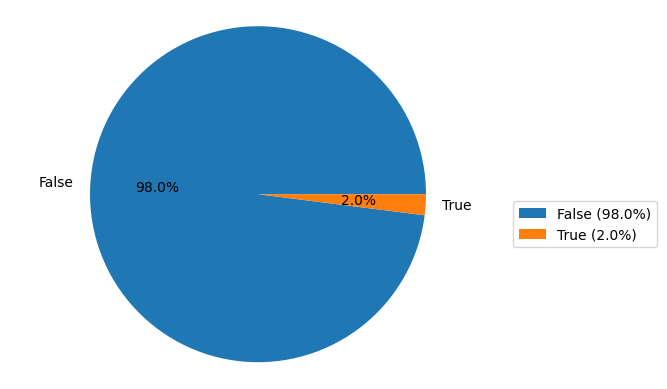

In [ ]:
## Showing a pie plot to show the distribution of movies whether the movie is with Adult category or not
pieplot(final_df, 'adult')

###### **Insight:** In the dataset, around 98% of movies are labeled as non-Adult whereas only 2% movies are considered as adult films.

##### Is ther any significant differences in average rating between adult and non-adult film?

In [ ]:
### Selecting the movies having non-zero rating to have only the movie that are originally rated
movies_rat_df = final_df.filter((final_df.avg_rating > 0) & (final_df.rating_count > 0))


### Selecting the adult and non-adult films and calcualting the average rating for each of them
adult_films = movies_rat_df.filter(col('adult') == True)
non_adult_films = movies_rat_df.filter(col('adult') == False)
adult_avg_rating = adult_films.agg({'avg_rating':'avg'}).collect()[0][0]
non_adult_avg_rating = non_adult_films.agg({'avg_rating':'avg'}).collect()[0][0]

## Creating a pyspark dataframe to show the  average rating for each of them
rating_data = [("Adult", adult_avg_rating),("Non-Adult", non_adult_avg_rating)]
rating_adult_df = spark.createDataFrame(rating_data, ["Film Category","Average Rating"])
rating_adult_df.show()


+-------------+-----------------+
|Film Category|   Average Rating|
+-------------+-----------------+
|        Adult|7.000641703377389|
|    Non-Adult| 5.99382038799007|
+-------------+-----------------+



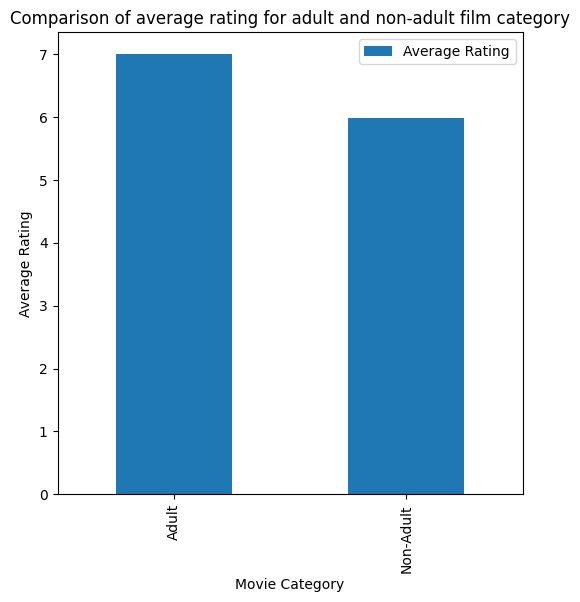

In [ ]:
### Here, Visualizing the average rating for adult and non-adult film category
rating_adult_pd = rating_adult_df.toPandas()

ax = rating_adult_pd.plot(kind='bar', x='Film Category', y='Average Rating', figsize=(6, 6))
plt.title('Comparison of average rating for adult and non-adult film category')
plt.xlabel('Movie Category')
plt.ylabel('Average Rating')
plt.xticks(rotation=90)

plt.show()

###### Insight: Adult category movie has higher average ratings compared to movies of non-Adult categrory.

#### Runtime Analysis

##### Are there any trends(increasing or decreasing) in movie runtime over the decades for movies released since 1900

In [ ]:
from pyspark.sql.functions import floor

### Considering those  movies which are released and actually rated and having a minimum of 30 min.runtime
movie_runtime_df = final_df.filter((col('release_year') > 1900) & (col('status') == 'Released') & (col('runtime') > 30))


### NOW, CALCULATING DEDADE AND Aggregate dta by decade and averaging runtime
movie_runtime_df = movie_runtime_df.withColumn("decade", floor(movie_runtime_df["release_year"]/10)*10)
runtime_df = movie_runtime_df.groupBy("decade").agg({"runtime":"avg"})

In [ ]:
movie_runtime_df.describe("runtime").show()

+-------+------------------+
|summary|           runtime|
+-------+------------------+
|  count|            293013|
|   mean| 90.22475794589319|
| stddev|30.519868958648022|
|    min|                31|
|    max|               300|
+-------+------------------+



In [ ]:
### showing  the top 5 decades when the avg runtime was highest
maxruntime_decade = runtime_df.orderBy(col("avg(runtime)").desc())
maxruntime_decade.show(5)

+------+-----------------+
|decade|     avg(runtime)|
+------+-----------------+
|  1960| 92.1262579346648|
|  1980|92.05199894328989|
|  2000|91.38784232701344|
|  2010|91.09423365910911|
|  1990|90.93683141748559|
+------+-----------------+
only showing top 5 rows



In [ ]:
## sorting by decades
runtime_decade = runtime_df.orderBy(col("decade").asc())

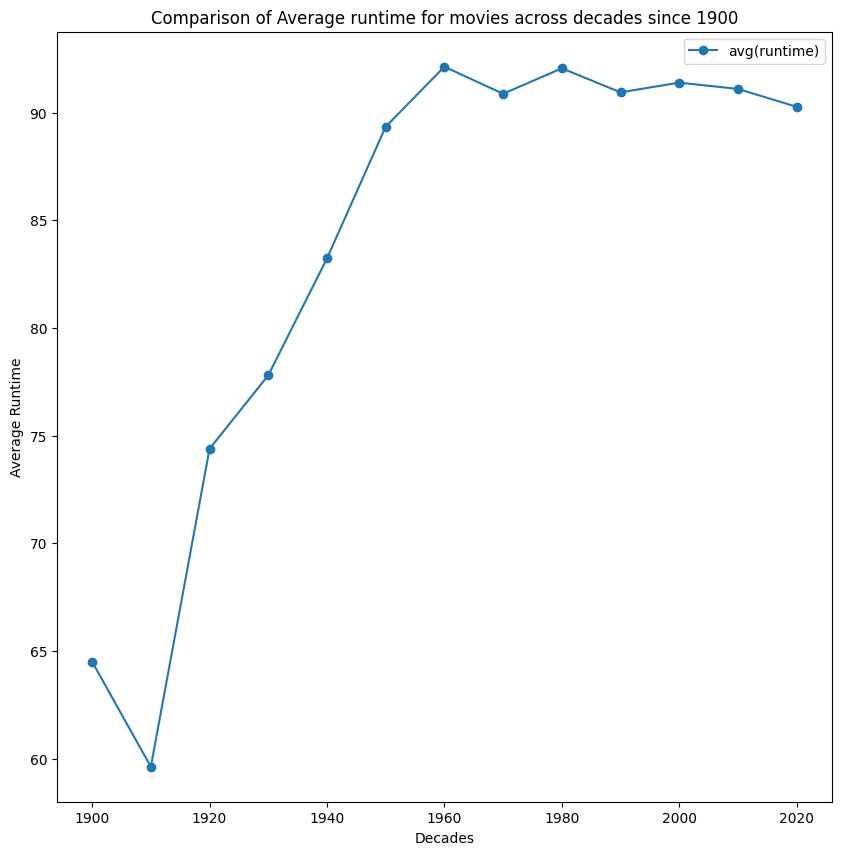

In [ ]:
### Here, Visualizing the average runtime for movies across decades
runtime_decade_pd = runtime_decade.toPandas()

ax = runtime_decade_pd.plot(kind='line', x='decade', y='avg(runtime)', marker='o', figsize=(10, 10))
plt.title('Comparison of Average runtime for movies across decades since 1900')
plt.xlabel('Decades')
plt.ylabel('Average Runtime')
#plt.yticks(rotation=90)

plt.show()

###### Insight: The average runtime of movies increased  a notable increase from the 1910 decade to 1960 decade, indicating a trend towards longer duration movies. However, in the subsequent decades of 1960, the average runtime shows fluctuations.

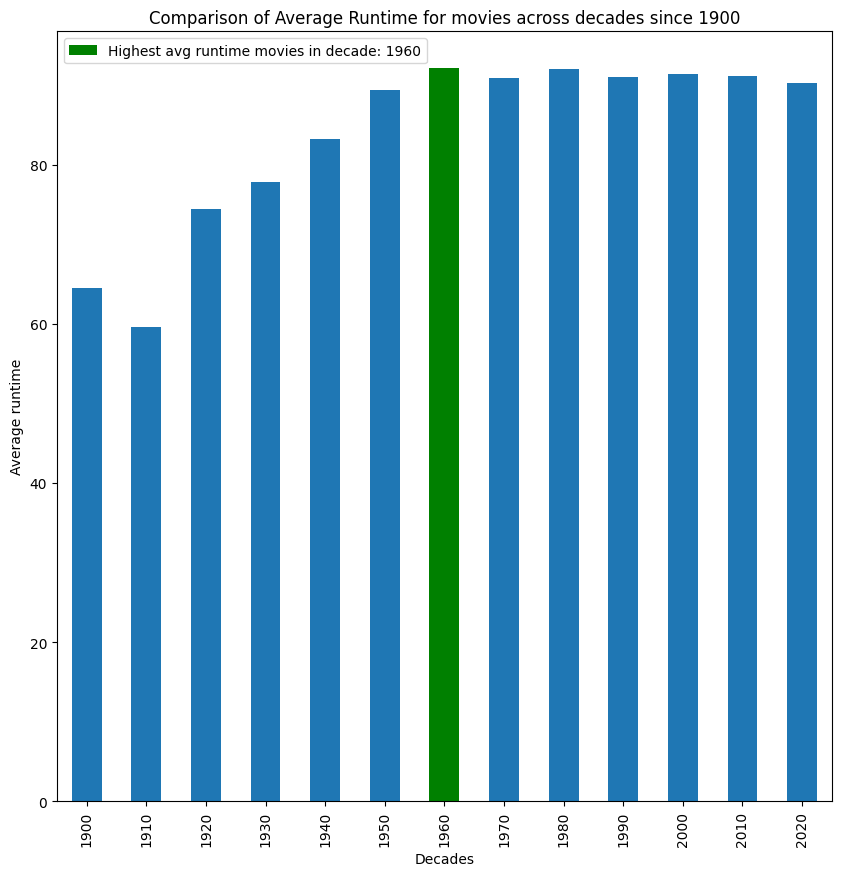

In [ ]:
### Here, Visualizing the average runtime for movies across decades
runtime_decade_pd = runtime_decade.toPandas()

ax = runtime_decade_pd.plot(kind='bar', x='decade', y='avg(runtime)', figsize=(10, 10))
plt.title('Comparison of Average Runtime for movies across decades since 1900')
plt.xlabel('Decades')
plt.ylabel('Average runtime')
#plt.yticks(rotation=90)

highest_count = runtime_decade_pd.loc[runtime_decade_pd['avg(runtime)'].idxmax(), 'decade']
highlighted_patch = ax.patches[runtime_decade_pd.index[runtime_decade_pd['decade'] == highest_count][0]]
highlighted_patch.set_facecolor('green')

ax.legend([highlighted_patch], [f'Highest avg runtime movies in decade: {highest_count}'], loc='upper left')
plt.show()

###### **Insight: ** Highest average ratings of movies are in 1960 decade,  from 1900- 1960 the avg runtime in movies increased gradually ,but for the subsequent decades there are minimal fluctuations in the average ratings.

##### how does the runtime of movies (Between 2020-2023) correlate with their popularity metrics?

In [ ]:
## Considering three categories of runtime :
### i) movies having less than 120 min (2hr) runtime
### ii) movies having more than 120 min(2hr) runtime but less than 180 min(3hr) runtime
### iii) movies having more than 180 min(3hr) runtime

movie_df_2018 = final_df.filter((col("release_year") >= 2020) & (col("release_year") <= 2023))
## Filtering out the movies having 0 popularity to focus the analysis on movies that have actually been viewed,
movie_df_2018 = movie_df_2018.filter(movie_df_2018.popularity > 0)
runtime_categories = movie_df_2018.withColumn("runtime_category",
                                                      when(col("runtime") < 120, "<120 min")
                                                      .when((col("runtime") >= 120) & (col("runtime") <= 180), "120-180 min")
                                                      .otherwise(">180 min"))

#### Here, I  actually group the data by runtime categories and then calculate avg popularity metrics
runtime_popularity_df = runtime_categories.groupBy("runtime_category") \
    .agg({"popularity": "avg"}) \
    .withColumnRenamed("avg(popularity)", "average_popularity")
runtime_popularity_df.show()

+----------------+------------------+
|runtime_category|average_popularity|
+----------------+------------------+
|        <120 min| 2.529114060977856|
|     120-180 min| 7.793755029140834|
|        >180 min| 2.777165526675787|
+----------------+------------------+



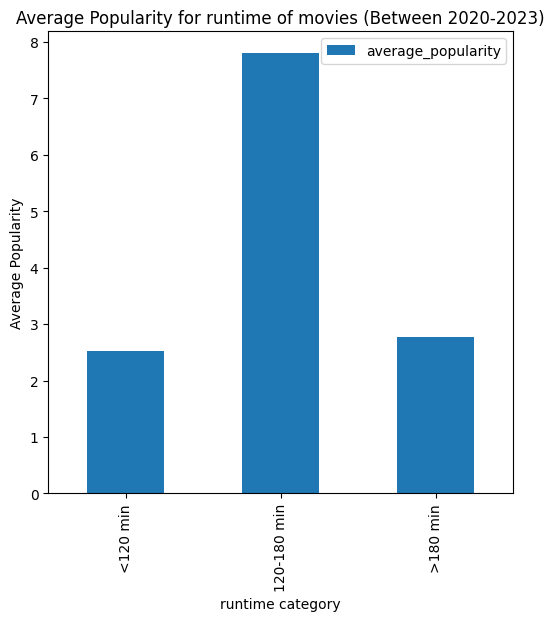

In [ ]:
# Visualize the comparison of popularity for different categories of runtime of movies (Between 2020-2023)
runtime_popularity_pd = runtime_popularity_df.toPandas()

runtime_popularity_pd.plot(kind='bar', x='runtime_category', y='average_popularity', figsize=(6,6))
plt.title('Average Popularity for runtime of movies (Between 2020-2023)')
plt.xlabel('runtime category')
plt.ylabel('Average Popularity')
plt.xticks(rotation=90)
plt.show()

###### **Insight:** Movies having runtime between 120 and 180 min  have the highest popularity compared to the movies belonging other category of runtime which highlights the fact that audience prefer movies have a moderate runtime between 120 to 180 min.

#### Popularity Analysis

##### What are top 5 highest popular movies and show the budget, revenue and ratings of these movies?

In [ ]:
#### Finding the movies having the highest popularity
top_movies = final_df.orderBy(col("popularity").desc()).select("title","popularity", "budget","revenue","avg_rating").limit(5)
top_movies.show()

+-----------------+----------+---------+------------+----------+
|            title|popularity|   budget|     revenue|avg_rating|
+-----------------+----------+---------+------------+----------+
|      Blue Beetle|  2994.357|    1.2E8|1.24818235E8|     7.139|
|     Gran Turismo|  2680.593|    6.0E7|     1.148E8|     8.068|
|       The Nun II|  1692.778|   3.85E7|     2.312E8|     6.545|
|Meg 2: The Trench|  1567.273|   1.29E8|3.84056482E8|     6.912|
|       Talk to Me|  1458.514|4500000.0|      7.26E7|     7.214|
+-----------------+----------+---------+------------+----------+



##### How has the average populairty of movies changed between 2022 and 2023 across different genres?

In [ ]:
## I am Filtering movies for the year 2022 and filtering out the movies where popularity =0 because these movies might have a empty entry for popularity , which might affect our findings
## So, filtering out the movies where popularity =0 to focus the analysis on movies that have actually been viewed,
movies_2022 = final_df.filter((final_df.release_year == 2022) & (final_df.popularity > 0))

## Here Calculating the average popularity for each genre
genre_popularity = []
for genre in genre_list:
    total_popularity = movies_2022.filter(col(genre) == 1).agg({"popularity": "sum"}).collect()[0][0]
    genre_count = movies_2022.filter(col(genre) == 1).count()
    avg_popularity = total_popularity / genre_count if genre_count != 0 else 0
    genre_popularity.append((genre, avg_popularity))


avg_popularity_2022 = spark.createDataFrame(genre_popularity, ["genre", "average_popularity"])
avg_popularity_2022.show()

+---------------+------------------+
|          genre|average_popularity|
+---------------+------------------+
|          Crime| 4.583101250000001|
|        Romance|3.5456022427440668|
|       TV Movie|2.8030608575380356|
|       Thriller|  5.25451116333725|
|      Adventure|11.529199178644767|
|          Drama|2.2513172782874524|
|            War| 7.121436708860759|
|    Documentary|1.0954242474091207|
|         Family| 6.523900000000001|
|        Fantasy| 6.525086137281296|
|        History|3.7240113378684807|
|        Mystery| 4.413090287277703|
|      Animation|3.4988819142324483|
|          Music| 1.528659203980098|
|Science Fiction| 5.826031019202365|
|         Horror| 3.455411706349211|
|        Western|3.5756352941176472|
|         Comedy| 3.229064350064344|
|         Action| 7.916548790658885|
+---------------+------------------+



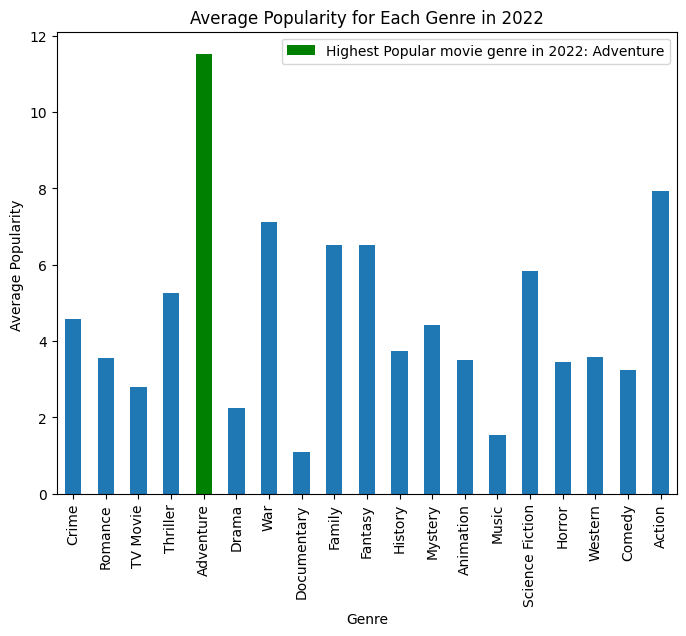

In [ ]:
# Visualize the average popularity variation across different movie genres in the year 2022
avg_popularity_pd = avg_popularity_2022.toPandas()

ax = avg_popularity_pd.plot(kind='bar', x='genre', y='average_popularity', figsize=(8,6))
plt.title('Average Popularity for Each Genre in 2022')
plt.xlabel('Genre')
plt.ylabel('Average Popularity ')
plt.xticks(rotation=90)

highest_count = avg_popularity_pd.loc[avg_popularity_pd['average_popularity'].idxmax(), 'genre']
highlighted_patch = ax.patches[avg_popularity_pd.index[avg_popularity_pd['genre'] == highest_count][0]]
highlighted_patch.set_facecolor('green')
ax.legend([highlighted_patch], [f'Highest Popular movie genre in 2022: {highest_count}'], loc='best')
plt.show()

###### **Insight:** In the year 2022, Adventure genre movies are the most popular among all genres, followed by action and war genre movies.

In [ ]:
## I am Filtering movies for the year 2032 and filtering out the movies where popularity =0 because these movies might have a empty entry for popularity , which might affect our findings
## So, filtering out the movies where popularity =0 to focus the analysis on movies that have actually been viewed,
movies_2023 = final_df.filter((final_df.release_year == 2023) & (final_df.popularity > 0))

## Here Calculating the average popularity for each genre
genre_popularity = []
for genre in genre_list:
    total_popularity = movies_2023.filter(col(genre) == 1).agg({"popularity": "sum"}).collect()[0][0]
    genre_count = movies_2023.filter(col(genre) == 1).count()
    avg_popularity = total_popularity / genre_count if genre_count != 0 else 0
    genre_popularity.append((genre, avg_popularity))


avg_popularity_2023 = spark.createDataFrame(genre_popularity, ["genre", "average_popularity_2023"])
avg_popularity_2023.show()

+---------------+-----------------------+
|          genre|average_popularity_2023|
+---------------+-----------------------+
|          Crime|     12.082046875000001|
|        Romance|      7.084192461908577|
|       TV Movie|      3.858656686626746|
|       Thriller|       17.5793961038961|
|      Adventure|     33.216687361419076|
|          Drama|      4.064144033674952|
|            War|     14.695425196850396|
|    Documentary|     1.7230161652447293|
|         Family|     12.061016447368422|
|        Fantasy|      13.73927814569536|
|        History|      7.819664705882352|
|        Mystery|     14.410127906976742|
|      Animation|      7.932490802675579|
|          Music|      2.172681672025723|
|Science Fiction|     17.922094214876036|
|         Horror|     11.474525308641969|
|        Western|     3.0666923076923074|
|         Comedy|      5.999310416666657|
|         Action|     23.969804797353177|
+---------------+-----------------------+



In [ ]:
### For each genre, calculating  the change in average popularity between 2022 and 2023 across different genres

popularity_change = avg_popularity_2023.join(avg_popularity_2022, on ='genre', how='inner') \
      .withColumn('Change_in_Popularity', col('average_popularity_2023') - col('average_popularity')) \
      .withColumnRenamed('average_popularity', 'average_popularity_2022')
popularity_change.show()

+---------------+-----------------------+-----------------------+--------------------+
|          genre|average_popularity_2023|average_popularity_2022|Change_in_Popularity|
+---------------+-----------------------+-----------------------+--------------------+
|         Action|     23.969804797353177|      7.916548790658885|   16.05325600669429|
|      Adventure|     33.216687361419076|     11.529199178644767|   21.68748818277431|
|      Animation|      7.932490802675579|     3.4988819142324483|    4.43360888844313|
|         Comedy|      5.999310416666657|     3.2055467181467123|  2.7937636985199448|
|          Crime|     12.082046875000001|      4.440411838790934|   7.641635036209068|
|    Documentary|     1.7230161652447293|     1.0954242474091207|  0.6275919178356086|
|          Drama|      4.064144033674952|     2.2513172782874524|     1.8128267553875|
|         Family|     12.061016447368422|      6.523900000000001|   5.537116447368421|
|        Fantasy|      13.73927814569536|  

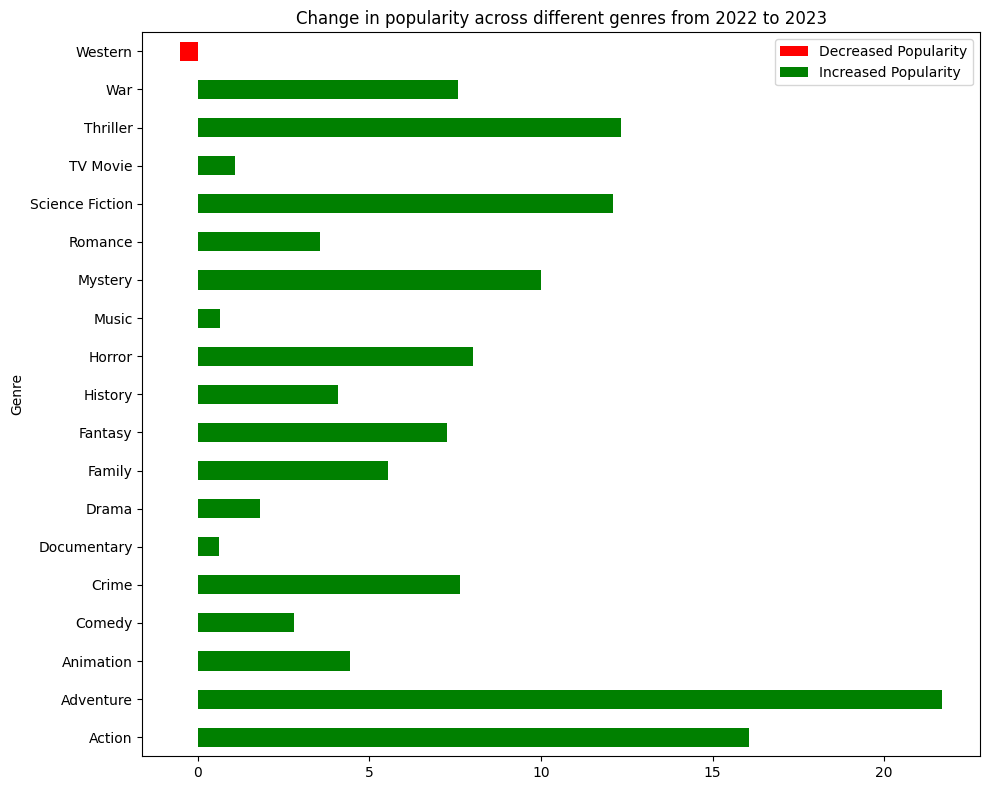

In [ ]:
### Visualization to show the change in average rating between 2022 and 2023 across different genres
fig, popularity_ax = plt.subplots(figsize=(10, 8))
popularity_change_pd = popularity_change.toPandas()
colors = ['red' if x < 0 else 'green' for x in popularity_change_pd['Change_in_Popularity']]
popularity_change_pd.plot(kind='barh', x='genre', y='Change_in_Popularity', ax=popularity_ax,color=colors)
popularity_ax.set_ylabel("Genre")

legend_labels = ['Decreased Popularity', 'Increased Popularity']
legend_handles = [Patch(facecolor='red', label='Decreased Popularity'), Patch(facecolor='green', label='Increased Popularity')]
popularity_ax.legend(handles=legend_handles, labels=legend_labels, loc='upper right')
plt.title('Change in popularity across different genres from 2022 to 2023')
plt.tight_layout()
plt.show()

###### **Insight:** Except from Western genre, the popularity for movies of all genres increases from 2022 to 2023, while for western genre the popularity decreased.

##### Among Marvel Studios, Pixar, DC Entertainment, and Warner Bros. Pictures, movies produced by which company has the highest average popularity (Considering movies released between 2018 to 2023)?

In [ ]:
### Firstly, filtering the movies having release year between 2018 and 2023
moviedf = final_df.filter((col("release_year") <= 2023) & (col("release_year") >= 2018))
selected_production_companies = ['Marvel Studios', 'Pixar', 'DC Entertainment', 'Warner Bros_ Pictures']

### Calculating the average popularity for the selected production companies
populaity_by_companies = []
for company in selected_production_companies:
    avg_popularity = moviedf.filter(col(company) == 1).agg({"popularity": "avg"}).collect()[0][0]
    populaity_by_companies.append((company, avg_popularity))

### Creating a dataframe for revenue for  selected production companies
avg_popularity_df = spark.createDataFrame(populaity_by_companies, ["Production Company", "Avg_popularity"])
avg_popularity_df.show()

+--------------------+------------------+
|  Production Company|    Avg_popularity|
+--------------------+------------------+
|      Marvel Studios| 57.38791428571429|
|               Pixar| 65.84437837837837|
|    DC Entertainment|20.014695652173913|
|Warner Bros_ Pict...|106.30653124999998|
+--------------------+------------------+



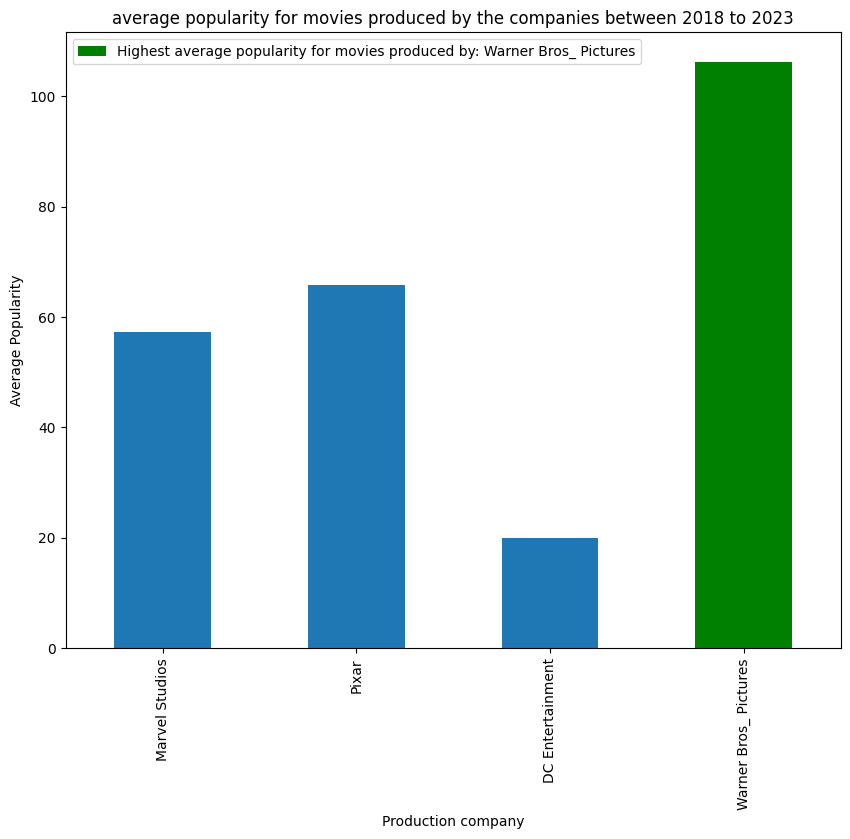

In [ ]:
### Here, Visualizing the average popularity for movies produced by the companies to show comparison (betweeen 2018 and 2023)
avg_popularity_pd = avg_popularity_df.toPandas()

ax = avg_popularity_pd.plot(kind='bar', x='Production Company', y='Avg_popularity', figsize=(10, 8))
plt.title('average popularity for movies produced by the companies between 2018 to 2023')
plt.xlabel('Production company')
plt.ylabel('Average Popularity')
plt.xticks(rotation=90)

highest_count = avg_popularity_pd.loc[avg_popularity_pd['Avg_popularity'].idxmax(), 'Production Company']
highlighted_patch = ax.patches[avg_popularity_pd.index[avg_popularity_pd['Production Company'] == highest_count][0]]
highlighted_patch.set_facecolor('green')

ax.legend([highlighted_patch], [f'Highest average popularity for movies produced by: {highest_count}'], loc='upper left')
plt.show()

###### Insight: Considering the movies released between 2018 and 2023, movies produced by Warner bros pictures company shows the highest average popularity among the selected production companies, followed by Pixar and Marvel Studios.

### **Movie Recommendation based on content**

The project explores two different approaches for content-based movie recommendation: Word2Vec approach and TF-IDF approach.

In [ ]:
back_up = final_df

In [ ]:
final_df.count()

432410

##### Word2Vec Approach

Word2Vec is a word embedding technique in NLP which captures the semantic relationship between words. For content based genre classification, after applying some preprocessing(removing stop words, punctuations and tokenizing text into words),  Word2Vec  model is trained and embeddings are genreated for each movie and after calculating the cosine similarity between movies embedding, similar movies are recommended.

In [ ]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

## finding the common words used
stop_words_list = set(stopwords.words('english'))
stop_words_list

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

In [ ]:
## Since there are more than 4 lac movies, It takes a lot of computational resource to compute.
movies_df = final_df.filter((final_df.release_year<2024) & (final_df['rating_count'] !=0)  &
                            (final_df['original_language'] =='en'))
movies_df.count()

118994

In [ ]:
movies_df =movies_df.toPandas()

In [ ]:
movies_df['content'] = movies_df['title'] + ' ' +  movies_df['overview'] + '' + movies_df['genres']


In [ ]:
movies_df.head(2)

,id,title,avg_rating,rating_count,status,release_date,revenue,runtime,adult,budget,...,Pixar,DC Entertainment,Warner Bros_ Pictures,United_States_of_America,United_Kingdom,France,Japan,India,Netherlands,content
0,593068,"""Please Kill Me, I'm a Faggot Nigger Jew""",5.300,3,Released,1996-07-23,0.0,10,False,0.0,...,0,0,0,1,0,0,0,0,0,"""Please Kill Me, I'm a Faggot Nigger Jew"" The ..."
1,381915,"""Weird Al"" Yankovic: The Ultimate Video Collec...",8.167,6,Released,2003-02-09,0.0,90,False,0.0,...,0,0,0,0,0,0,0,0,0,"""Weird Al"" Yankovic: The Ultimate Video Collec..."


In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
import re
from nltk.tokenize import word_tokenize
### Applying pre-processing to text (converting to lowercase, removing stopwords, removing punctuation and text tokenization)
text_processing = lambda text: [word.lower() for word in word_tokenize(re.sub(r'[^\w\s]','',text)) if word.lower() not in stop_words_list]
movies_df['content'] = movies_df['content'].apply(text_processing)
movies_df['content']


0         [please, kill, im, faggot, nigger, jew, viewer...
1         [weird, al, yankovic, ultimate, video, collect...
2         [jr, 35, years, old, photographer, jr, street,...
3         [luckynumber, made, tv, movie, based, true, st...
4         [notalone, teenage, girl, takes, selfie, home,...
                                ...                        
114858    [cuddlebearavi, cuddlebearavi, found, footage,...
114859     [isteve, comedic, look, life, steve, jobscomedy]
114860    [lights, ones, home, familial, grief, gives, s...
114861    [vita, carnis, analog, horrorliveaction, horro...
114862    [colores, qatsi, trilogy, journalist, v, b, pr...
Name: content, Length: 114863, dtype: object

In [ ]:
from gensim.models import Word2Vec

#### Training word2vec model using tokenized text data
word2vec_model = Word2Vec(movies_df['content'], min_count =1)

In [ ]:
#### Utizing word2vec model to calculate the mean embedding vector for a list of word tokens
#### returning zero vector if no embeddings can be found for the tokens

def embedding_generation(token_list):
  embedding_vec =[]
  for word in token_list:
    if word in word2vec_model.wv:
      embedding_vec.append(word2vec_model.wv[word])
  return np.mean(embedding_vec, axis =0) if embedding_vec else np.zeros(word2vec_model.vector_size)

movies_df['embedding_list'] = movies_df['content'].apply(embedding_generation)

In [ ]:
## Showing the embedding vector list
movies_df['embedding_list']

0         [0.2273532, 1.2890477, 0.075147495, 0.07590684...
1         [-0.077278204, 0.7322491, -0.17522936, -0.2095...
2         [0.090231545, 1.213066, 0.2282548, -0.13746053...
3         [-0.015812803, 1.237347, 0.33005667, -0.273432...
4         [0.25942984, 1.8078233, 0.306702, -0.7196712, ...
                                ...                        
114858    [-0.39765775, 1.4273652, 0.13953163, -0.265848...
114859    [-0.48685956, 0.6116039, -0.30409172, -0.92095...
114860    [0.40887907, 1.5062033, 0.14402428, -0.4066607...
114861    [0.36477166, 0.798881, 0.43650758, 0.47616404,...
114862    [-0.29524314, 0.8883672, -0.081095204, -0.2764...
Name: embedding_list, Length: 114863, dtype: object

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity


def get_recommendation(movie_name):
  selected_movie = movies_df[movies_df['title'] == movie_name]

  ## Getting the embedding list and genres fro selected movies
  movie_features = selected_movie[['embedding_list','genres']].iloc[0]
  selected_movie_genre = movie_features['genres']
  selected_movie_embedding_vec = movie_features['embedding_list']


  ### Calculating cosine similarity between selected movie and each of the movies
  similiarity_list =[]

  for index, movie in movies_df.iterrows():
    embedding_similarity = cosine_similarity([movie['embedding_list']], [selected_movie_embedding_vec])[0][0]
    genre_similarity = int(movie['genres'] == selected_movie_genre)
    similarity = (embedding_similarity + genre_similarity) /2
    similiarity_list.append(similarity)

  movies_df['similarity'] = similiarity_list

  ### Finding the recommended movies  based on similarity by sorting dataframe in descending order
  similar_movies_list = movies_df.sort_values(by= 'similarity', ascending = False)
  top_10_recommendation = similar_movies_list.iloc[1:11]
  top_10_recommendation = top_10_recommendation[['title','genres']]
  return top_10_recommendation









###### Getting Movie Recommendation result

In [ ]:
## Selecting the movie for which I want recommend similar movies like that
recommendation = get_recommendation('Star Wars: The Last Jedi')
recommendation

,title,genres
10818,The Empire Strikes Back,"Adventure, Action, Science Fiction"
51095,Star Wars: The Force Awakens,"Adventure, Action, Science Fiction"
37370,Star Wars: Episode I - The Phantom Menace,"Adventure, Action, Science Fiction"
9716,Star Wars: Episode II - Attack of the Clones,"Adventure, Action, Science Fiction"
113973,Star Wars: The Rise of Skywalker,"Adventure, Action, Science Fiction"
79368,Star Wars: Episode III - Revenge of the Sith,"Adventure, Action, Science Fiction"
79365,Star Wars,"Adventure, Action, Science Fiction"
48150,Megaforce,"Adventure, Action, Science Fiction"
97401,X2,"Adventure, Action, Science Fiction"
44672,Doctor Who: The Power of the Doctor,"Adventure, Action, Science Fiction"


In [ ]:
## Getting the selected movies genre to compare the genres between the recommended movies and the selected movie
selected_movie_genre = movies_df.loc[movies_df['title'] == 'Star Wars: The Last Jedi', 'genres']
selected_movie_genre.values[0]

'Adventure, Action, Science Fiction'

**Result Analysis:** As it is evident that all the recommended movies using word2vec approach for '**Star Wars: The Last Jedi**' having the same genres(Adventure, Action, Science Fiction) of the input movie, which demonstrates that the recommendation is really effective in suggesting similar movies. Also, suggested movies include 'Star Wars: The Force Awakens', 'Star Wars: Episode I - The Phantom Menace', 'Star Wars: Episode II - Attack of the Clones' which highlights the content similarites between the selected movie 'Star Wars: The Last Jedi' and the suggested movies.

In [ ]:
## Selecting the movie for which I want recommend similar movies like that
recommendation = get_recommendation("Pirates of the Caribbean: Dead Man's Chest")
recommendation

,title,genres
63503,Pirates of the Caribbean: The Curse of the Bla...,"Adventure, Fantasy, Action"
86350,Conan the Destroyer,"Adventure, Fantasy, Action"
108294,The Barbarians,"Adventure, Fantasy, Action"
66871,The Lord of the Rings: The Fellowship of the Ring,"Adventure, Fantasy, Action"
103761,Kull the Conqueror,"Adventure, Fantasy, Action"
16418,Conan the Barbarian,"Adventure, Fantasy, Action"
109361,The Lord of the Rings: The Return of the King,"Adventure, Fantasy, Action"
81122,The Lord of the Rings: The Two Towers,"Adventure, Fantasy, Action"
63501,Pirates of the Caribbean: At World's End,"Adventure, Fantasy, Action"
4799,Heavenquest: A Pilgrim's Progress,"Adventure, Fantasy, Action"


In [ ]:
## Getting the selected movies genre to compare the genres between the recommended movies and the selected movie
selected_movie_genre = movies_df.loc[movies_df['title'] == "Pirates of the Caribbean: Dead Man's Chest", 'genres']
selected_movie_genre.values[0]

'Adventure, Fantasy, Action'

**Result Analysis:** As it is evident that all the recommended movies  of '**Pirates of the Caribbean: Dead Man's Chest**' having the same genres(Adventure, Fantasy,  Action) of the input movie, which demonstrates that the recommendation is really effective in suggesting similar movies.

In [ ]:
## Selecting the movie for which I want recommend similar movies like that
recommendation = get_recommendation('The Lord of the Rings: The Return of the King')
recommendation

,title,genres
86350,Conan the Destroyer,"Adventure, Fantasy, Action"
2537,Clash of the Titans,"Adventure, Fantasy, Action"
26271,Thor,"Adventure, Fantasy, Action"
81122,The Lord of the Rings: The Two Towers,"Adventure, Fantasy, Action"
108294,The Barbarians,"Adventure, Fantasy, Action"
66871,The Lord of the Rings: The Fellowship of the Ring,"Adventure, Fantasy, Action"
16418,Conan the Barbarian,"Adventure, Fantasy, Action"
63689,Prince of Persia: The Sands of Time,"Adventure, Fantasy, Action"
78182,Red Sonja,"Adventure, Fantasy, Action"
103761,Kull the Conqueror,"Adventure, Fantasy, Action"


In [ ]:
## Getting the selected movies genre to compare the genres between the recommended movies and the selected movie
selected_movie_genre = movies_df.loc[movies_df['title'] == 'The Lord of the Rings: The Return of the King','genres']
selected_movie_genre.values[0]

'Adventure, Fantasy, Action'

**Result Analysis:** As it is evident that all the recommended movies of 'The Lord of the Rings: The Return of the King' having the same genres (Adventure, Fantasy, Action)of the input movie, which demonstrates that the recommendation is really effective in suggesting similar movies.

##### **TF-IDF (Term Frequency-Inverse Document Frequency) Technique**

TF-IDF (Term Frequency Inverse Document Frequency) is method in NLP to measure how a important a term within a document relative to a collection of documents.

TF-IDF combines two factors: term frequency (how often a word appears in a document) and inverse document frequency (how unique a word is across all the documents in a corpus).

The formula for term frequency(TF),

$$\text{TF} = \frac{\text{Number of times the specific term appears in document }}{\text{Total number of terms in document }}$$

The formula for inverse document frequency(IDF),
$$\text{IDF} = \log (\frac{\text{Number of documents}}{\text{Number of documents that contain the specific term}})$$

Finally, $$\text{TF-IDF} = \text{TF} * \text{IDF} $$


So, Using TF-IDF vectorizer to generate TF-IDF values, and then after calculating the cosine similarity between the TF-IDF values, similar movies are recommended.

In [ ]:
## Since there are more than 4 lac movies, It takes a lot of computational resource to compute.
### So, for recommendation, we will consider a df having less movies
movies_since_1900 = final_df.filter((final_df.release_year>=1900) & (final_df.release_year<2024) &
                                     (final_df['original_language'] == 'en') &
                                    (final_df['rating_count']> 5))

In [ ]:
movies_since_1900.count()

53088

In [ ]:
overview_df = movies_since_1900.select("id", "title", "overview","genres")
movies_df = overview_df.toPandas()

In [ ]:
movies_df = movies_df.sort_values(by="id", ascending=False)
movies_df.head(2)

,id,title,overview,genres
7549,1197699,E70,After a series of strange sounds in the middle...,"Horror, Thriller"
20350,1174775,Good Chemistry: The Story of Elemental,Pixar director Peter Sohn takes viewers on a h...,Documentary


In [ ]:
nltk.download('stopwords')
from nltk.corpus import stopwords

## finding the common words used
stop_words_list = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

###TfidfVectorizer generates TF-IDF(Term Frequency-Inverse Document Frequency) values for words in content overviews, excluding common English stop words.
content = movies_df['title'] + ' ' + movies_df['overview'] + ' ' + movies_df['genres']
tfidf_vect = TfidfVectorizer(stop_words='english', min_df = 2)
tf_matrix = tfidf_vect.fit_transform(content)



In [ ]:
## Using cosine_similarity function  to compute similarity between rows of the TF-IDF matrix
from sklearn.metrics.pairwise import cosine_similarity
similarity = cosine_similarity(tf_matrix)

In [ ]:
def recommendation_using_TFIDF(movie_name):
  selected_movie_index = movies_df[movies_df['title'] == movie_name].index[0]
  ## Based on the similarity score, finding the indices of the similar movies
  similarity_scores = similarity[selected_movie_index]
  sorted_indices = similarity_scores.argsort()[::-1][1:]
  selected_movie_genre = set(movies_df.loc[selected_movie_index,'genres'].split(','))

  recommended_movies =[]
  for index in sorted_indices:
    genres_lists =set(movies_df.loc[index,'genres'].split(','))
    if genres_lists == selected_movie_genre:
      recommended_movies.append(movies_df.loc[index,'title'])
      if(len(recommended_movies) == 10):
        break
  return recommended_movies

###### Getting the Recommended movie Results

In [ ]:
### getting recommended movie list for 'Star Wars' movie
recommendation = recommendation_using_TFIDF("Star Wars")
recommended_movie_list = movies_df[movies_df['title'].isin(recommendation)][['title','genres']]
recommended_movie_list = recommended_movie_list.set_index('title').loc[recommendation].reset_index()
recommended_movie_list

,title,genres
0,Star Wars: The Rise of Skywalker,"Adventure, Action, Science Fiction"
1,Journey 2: The Mysterious Island,"Adventure, Action, Science Fiction"
2,The Hunger Games: Catching Fire,"Adventure, Action, Science Fiction"
3,Avengers: Endgame,"Adventure, Science Fiction, Action"
4,Transformers,"Adventure, Science Fiction, Action"
5,Star Wars: Episode III - Revenge of the Sith,"Adventure, Action, Science Fiction"
6,Starship Troopers 3: Marauder,"Adventure, Science Fiction, Action"
7,Apocalypse of Ice,"Adventure, Science Fiction, Action"
8,Flash Gordon's Trip to Mars,"Adventure, Science Fiction, Action"
9,X2,"Adventure, Action, Science Fiction"


In [ ]:
## Getting the selected movies genre to compare the genres between the recommended movies and the selected movie
selected_movie_genre = movies_df.loc[movies_df['title'] == 'Star Wars','genres']
selected_movie_genre.values[0]

'Adventure, Action, Science Fiction'

**Result Analysis:** So the recommendation system is effective in providing similar movie suggestions as it is evident that both the given input movie("Star Wars") and recommended movies belong to same genres(Adventure, Science Fiction, Action).Also, the content of the recommended movies such as 'Star Wars: The Rise of Skywalker','Star Wars: Episode III - Revenge of the Sith' perfectly aligns with the selected movie 'Star Wars'.

In [ ]:
### getting recommended movie list for 'Avengers: Endgame' movie
recommendation = recommendation_using_TFIDF("Avengers: Endgame")
recommended_movie_genres = movies_df[movies_df['title'].isin(recommendation)][['title','genres']]
recommended_movie_genres = recommended_movie_genres.set_index('title').loc[recommendation].reset_index()
recommended_movie_genres

,title,genres
0,Star Wars,"Adventure, Action, Science Fiction"
1,Megaforce,"Adventure, Action, Science Fiction"
2,Waterworld,"Adventure, Action, Science Fiction"
3,X2,"Adventure, Action, Science Fiction"
4,The Hunger Games: Catching Fire,"Adventure, Action, Science Fiction"
5,Transformers,"Adventure, Science Fiction, Action"
6,Star Wars: Episode III - Revenge of the Sith,"Adventure, Action, Science Fiction"
7,Captain America: Civil War,"Adventure, Action, Science Fiction"
8,Valerian and the City of a Thousand Planets,"Adventure, Science Fiction, Action"
9,Avengers: Infinity War,"Adventure, Action, Science Fiction"


In [ ]:
## Getting the selected movies genre to compare the genres between the recommended movies and the selected movie
selected_movie_genre = movies_df.loc[movies_df['title'] == 'Avengers: Endgame','genres']
selected_movie_genre.values[0]

'Adventure, Science Fiction, Action'

**Result Analysis:** So the recommendation system is effective in providing similar movie suggestions as it is evident that both the given input movie("Avengers: Endgame") and recommended movies belong to same genres(Adventure, Science Fiction, Action) and also the content of recommended movie 'Avengers:Infinity War' aligns well with the selected movie 'Avengers:Endgame'.

### **Genre Classification Based on Movie name and Overview**

Here, Genre classification is  a multilabel classification, where each movie can be associated with multiple genre classes. Multilabel classification is a type of classification where instances can be assigned to multiple categories simultaneously.

In [ ]:
### Selceting the english movies
movies_df = final_df.filter((final_df['original_language'] == 'en'))
movie_df = movies_df.toPandas()

In [ ]:
### For fast computation, we are considering 1,00,000 movies sorted by release date
movie_df_sorted = movie_df.sort_values(by='release_date')
final_movies_df = movie_df_sorted.head(100000)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report
from sklearn.multioutput import MultiOutputClassifier
import warnings
warnings.filterwarnings("ignore")

In [ ]:
final_movies_df['content'] = final_movies_df['title'] + ' ' + final_movies_df['overview']

In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords

## finding the common words used
stop_words_list = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
### Applying pre-processing to text (converting to lowercase, removing stopwords, and  perform lemmatization)

### lemmatization is a process of reducing a word to base form
lemmatizer = WordNetLemmatizer()
def apply_lemmatization(movie_content):
  lemmatized_text = [lemmatizer.lemmatize(word) for word in word_tokenize(movie_content) if word not in stop_words_list]
  return ' '.join(lemmatized_text)
final_movies_df['content'] = final_movies_df['content'].apply(lambda x: apply_lemmatization(x.lower()))


In [ ]:
### X containing the content
X = final_movies_df['content']
# y contains the genre columns whic are one hot encoded
y = final_movies_df[['Crime', 'Romance', 'TV Movie', 'Thriller', 'Adventure', 'Drama', 'War',
       'Documentary', 'Family', 'Fantasy', 'History', 'Mystery', 'Animation',
       'Music', 'Science Fiction', 'Horror', 'Western', 'Comedy', 'Action']]

## Here, Splitting the data, 80% train and 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=30)

In [ ]:
## I have converted the text data into numerical representation using  TF-IDF vectorization
vectorizer = TfidfVectorizer()
X_train_data = vectorizer.fit_transform(X_train)
X_test_data = vectorizer.transform(X_test)

##### Logistic Regression

In [ ]:
from sklearn.metrics import precision_score,f1_score,recall_score

In [ ]:
from sklearn.linear_model import LogisticRegression

##  Using Multi-output classification  since multiple target variables for genres,
## and each movie can have multiple genre classes simultaneously
lr_classifier = MultiOutputClassifier(LogisticRegression(solver='lbfgs'))

## Train  and prediction
lr_classifier.fit(X_train_data, y_train)
lr_y_pred = lr_classifier.predict(X_test_data)

In [ ]:
classification_reports = classification_report(y_test, lr_y_pred, target_names= genre_list)
print(classification_reports)

                 precision    recall  f1-score   support

          Crime       0.64      0.22      0.33      1343
        Romance       0.56      0.13      0.20      1549
       TV Movie       0.73      0.03      0.05      1261
       Thriller       0.58      0.12      0.20      1329
      Adventure       0.65      0.10      0.18       911
          Drama       0.70      0.46      0.56      5195
            War       0.71      0.25      0.37       440
    Documentary       0.89      0.70      0.79      4424
         Family       0.70      0.16      0.26      1070
        Fantasy       0.62      0.04      0.07       600
        History       0.62      0.02      0.03       448
        Mystery       0.63      0.14      0.23       633
      Animation       0.91      0.56      0.69      2430
          Music       0.85      0.56      0.68      1896
Science Fiction       0.82      0.30      0.44       681
         Horror       0.83      0.36      0.50      1145
        Western       0.93    

In [ ]:
average_precision_list ={}
average_recall_list ={}
average_f1_score_list ={}

average_precision_LR = precision_score(y_test, lr_y_pred,average ='micro')
average_precision_list['Logistic Regression'] = average_precision_LR
average_recall_LR = recall_score(y_test, lr_y_pred,average ='micro')
average_recall_list['Logistic Regression'] = average_recall_LR
average_f1_score_LR = f1_score(y_test, lr_y_pred,average ='micro')
average_f1_score_list['Logistic Regression'] = average_f1_score_LR

print("Average precision: ",average_precision_LR)
print("Average Recall: ",average_recall_LR)
print("Average f1-score: ",average_f1_score_LR)

Average precision:  0.7881592843386966
Average Recall:  0.38974563774883264
Average f1-score:  0.5215728997512796


In [ ]:
def plot_classification_report(classification_report_res, model_name):
  res = classification_report_res.split('\n')[2:-5]
  precision_list =[]
  recall=[]
  f1_scores =[]

  for r in res:
    values = r.strip().split()
    if values:
      genre = values[0]
      if genre == 'TV' or genre =='Science':
        precision_list.append(float(values[2]))
        recall.append(float(values[3]))
        f1_scores.append(float(values[4]))
      else:
        precision_list.append(float(values[1]))
        recall.append(float(values[2]))
        f1_scores.append(float(values[3]))

  classification_result = {
    'Precision': precision_list, 'Recall': recall, 'F1-score':f1_scores,'Genres':genre_list}

  fig =plt.figure(figsize = (14,6))
  indx = np.array(range(len(classification_result['Genres'])))
  plt.bar(indx, classification_result['Precision'], width =0.3, label='Precision')
  plt.bar(indx +0.3, classification_result['Recall'], width =0.3,label='Recall')
  plt.plot(indx +0.15, classification_result['F1-score'], marker='o',label='F1-Score', color='green')
  plt.ylim((0,1))
  plt.xticks(indx+0.3,classification_result['Genres'],rotation=90 )
  plt.ylabel('Score')
  plt.title(f'Evaluation for {model_name} model using Precision, Recall and F1-score')
  plt.legend()
  plt.tight_layout()
  plt.show()


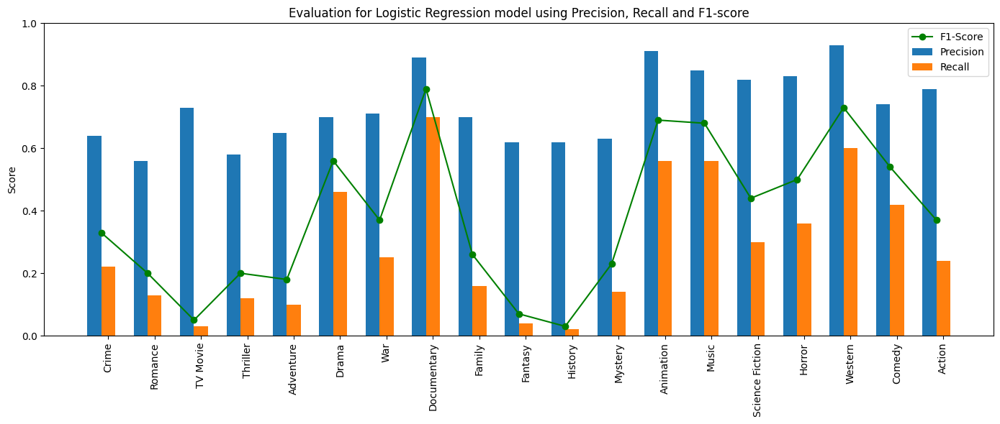

In [ ]:
### Visualizing classification report for Logistic Regression
plot_classification_report(classification_reports,"Logistic Regression")

**Result Analysis:**

By analysing Precision, Recall and F1-score, it is evident that the Logistic Regression model performs moderately well in predicting **‘Documentary’,'Music',Western' and ‘Animation'** genres. But, the model struggles to classify accurately for genres including **'History','Fantasy', TV Movie** which is evident from the low recall and F1-scores for these genres.

Precision helps us to measure the accuracy of the model’s positive predictions, that means, by precision, we can know what percentage of the model’s positive predictions are correct. Here, the model precision for Western genre is 0.93, which means that the  model is correct 90% of the time when the model predicts the movie to be of Western genre. Highest Precision for this logistic regression model can seen in 'Western' genre.

Recall helps us to understand what percentage of actual positive instances the model can accurately predict, as recall is the ratio of  correctly predicted positive instances and total positive instances.The highest recall can be seen here is for Documentary genre. Here, the recall for **Documentary** genre is 0.70 which means that the model can predict 70% of the actual Western genre movies correctly.


F1- score for **Documentary** genre is the highest here, which is 0.79. This indicates that the logistic regression model effectively balances precision (the accuracy of positive predictions) and recall for 'Documentary' genre and the model performs well in accurately identifying documentary genre.

In [ ]:
### Calculating the accuracy of logistics regression
from sklearn.metrics import accuracy_score
lr_accuracy = accuracy_score(y_test, lr_y_pred)
print("Accuracy:", lr_accuracy)

Accuracy: 0.33345


Accuracy Analysis: In multibale classification scenario, which means, instances can belong to multiple classes simultaneously, the accuracy that we got for logistic regression model is 0.3345. As this is a multilabel classification problem, accuracy is not the perfect evaluation metric to measure model performance, for evaluation metric, I am considering Precision, Recall and F1-score.

In [ ]:
import seaborn as sns
### defining a function for  visualizing confusion matrix for each genre
def plot_confusion_matrix(confusion_Matrix):
  for i in range(len(genre_list)):
    plt.figure(figsize=(7, 4))
    sns.heatmap(confusion_Matrix[i], annot=True, fmt='d', cmap='coolwarm',
                yticklabels=['No ' + genre_list[i], 'Has ' + genre_list[i]],
                xticklabels= ['No ' + genre_list[i], 'Has ' + genre_list[i]],
                linewidths=.5, linecolor='black')
    plt.xlabel('Predicted Genre')
    plt.ylabel('True Genre')
    plt.title('Confusion Matrix for ' + genre_list[i])
    plt.show()

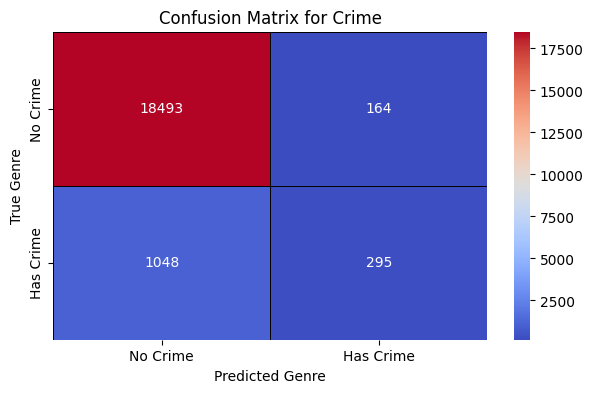

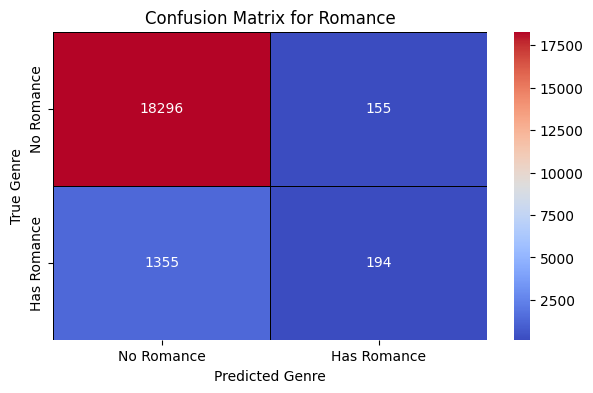

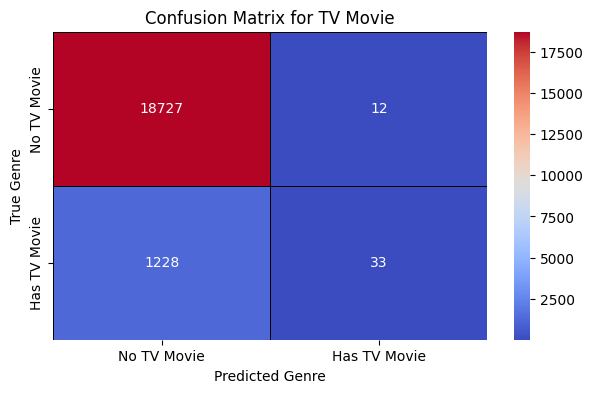

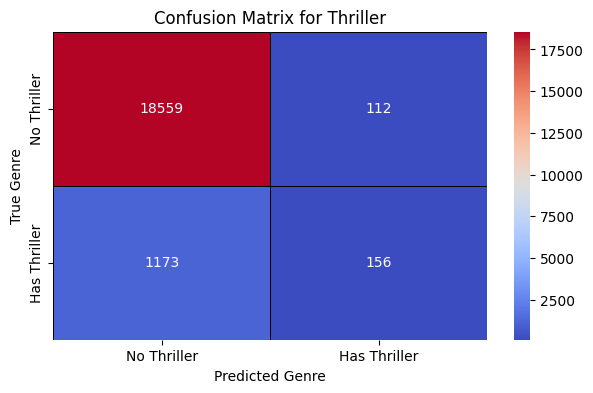

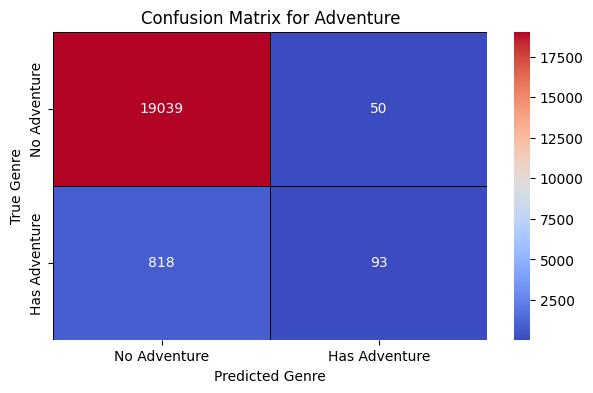

...

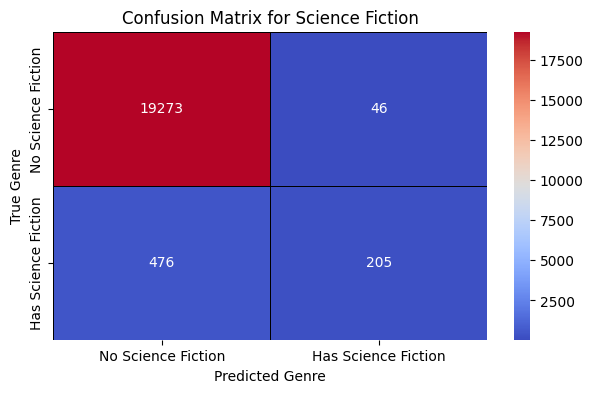

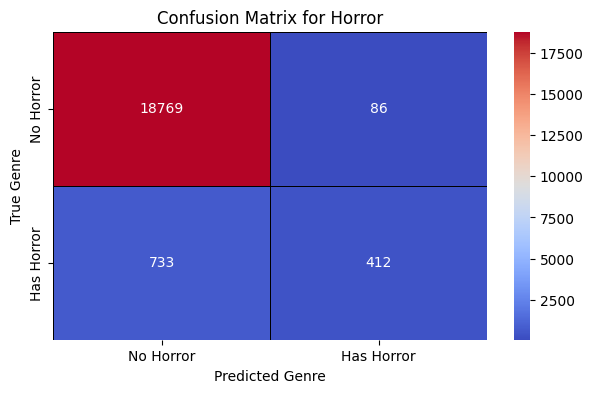

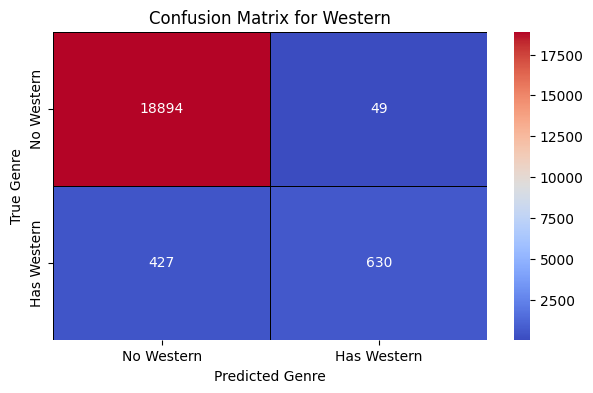

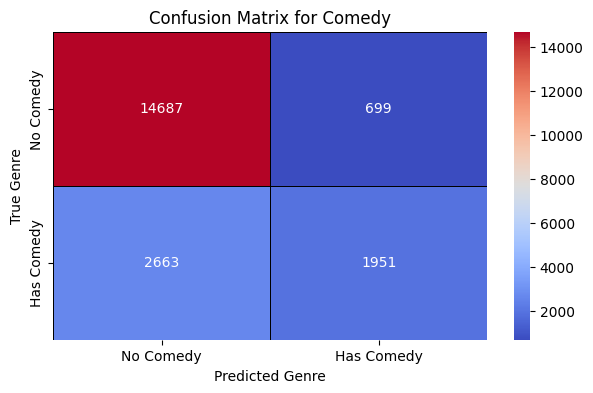

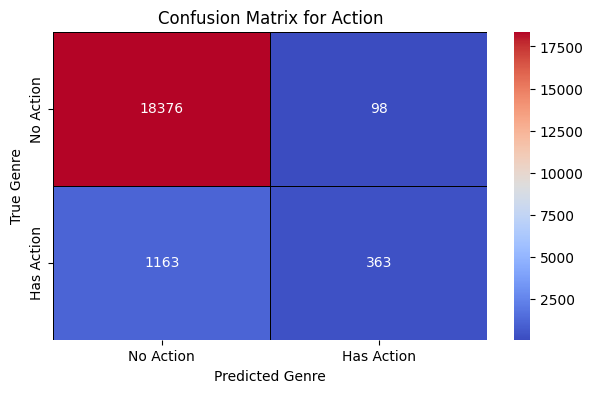

In [ ]:
## Visualizing genre-wise multilabel confusion matrices
from sklearn.metrics import multilabel_confusion_matrix
lr_conf_matrix = multilabel_confusion_matrix(y_test,lr_y_pred)
plot_confusion_matrix(lr_conf_matrix)

Analysis: Confusion Matrix shows that visualization of correct and incorrect predictions across each genre and it is evident the model performs well in correctly identifying Documementary genre.

In [ ]:
from sklearn.metrics import roc_curve,auc
## plotting ROC CURVE
def plot_roc_curve(y_test, y_prediction):
  false_positive_rate = {}
  true_positive_rate ={}
  roc_auc ={}
  for i,genre in enumerate(genre_list):
    false_positive_rate, true_positive_rate, _ = roc_curve(y_test[:,i], y_prediction[:,i])
    roc_auc = auc(false_positive_rate, true_positive_rate)
    plt.plot(false_positive_rate, true_positive_rate, label =f' AUC = {roc_auc:.2F}')
    plt.plot([0,1],[0,1],linestyle ="--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.xlim((0,1))
    plt.title(f"ROC curve for {genre} genre")
    plt.legend(loc='best')
    plt.show()

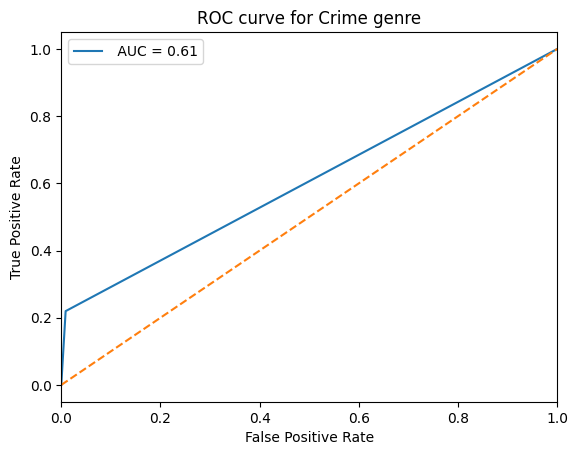

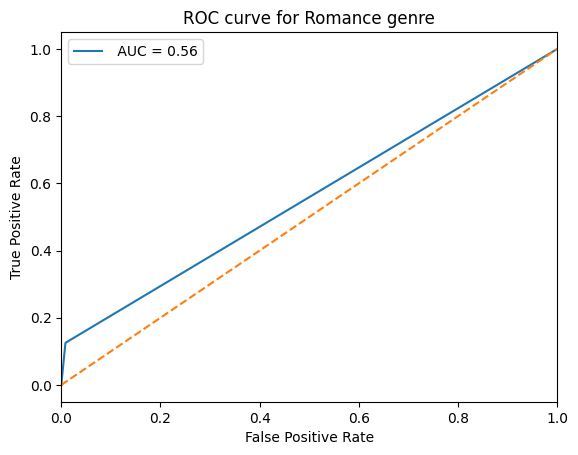

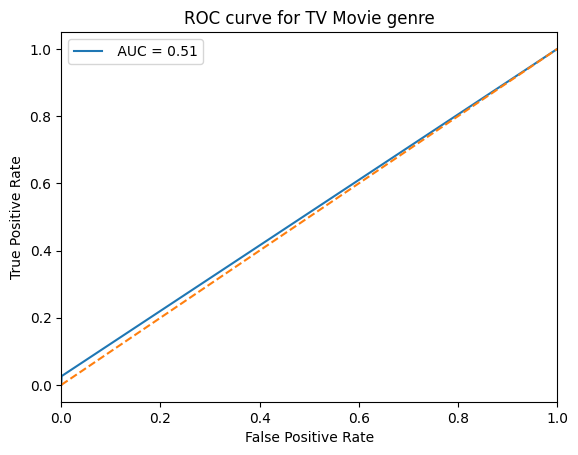

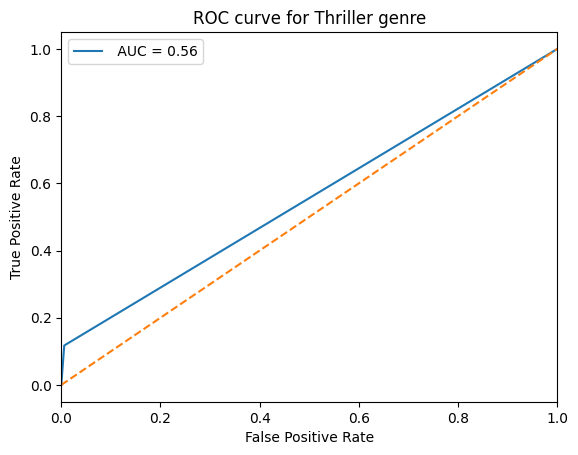

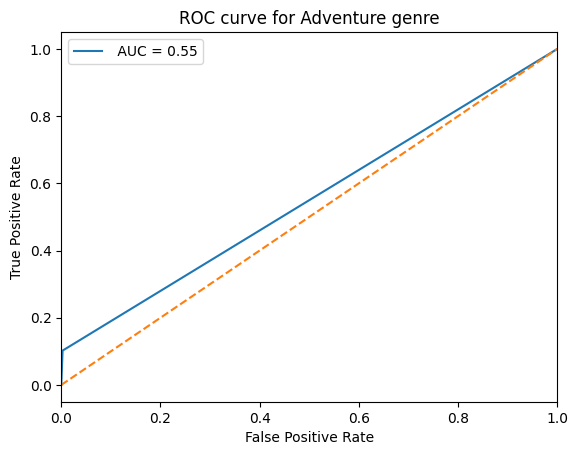

...

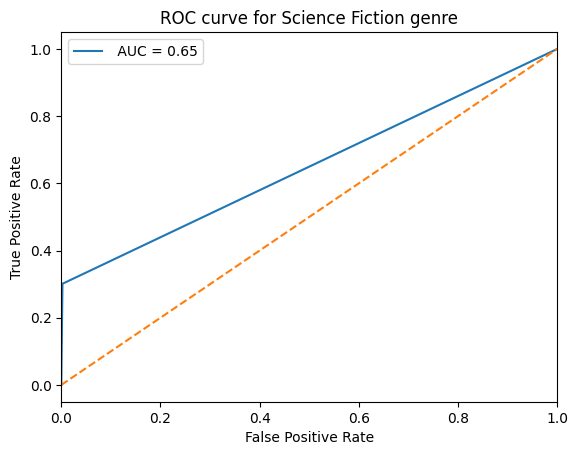

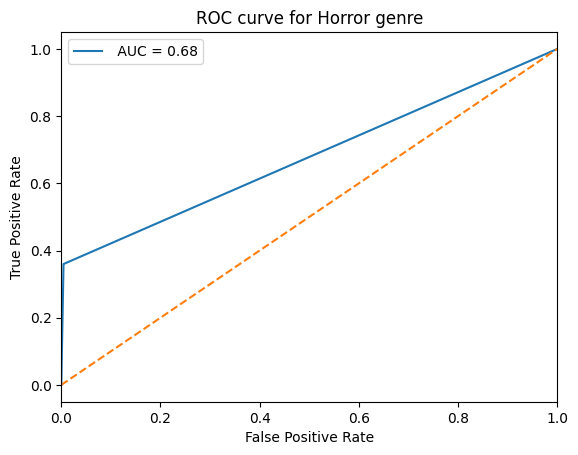

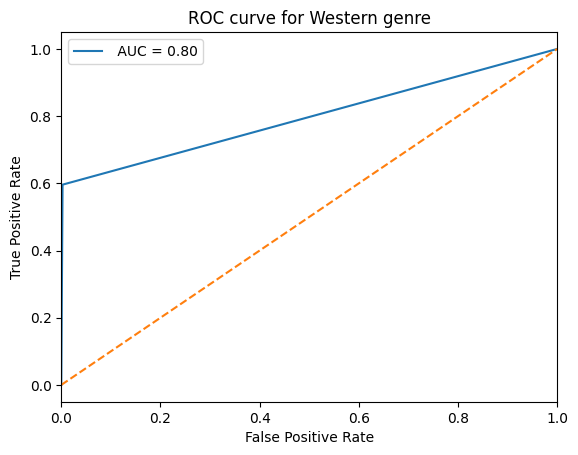

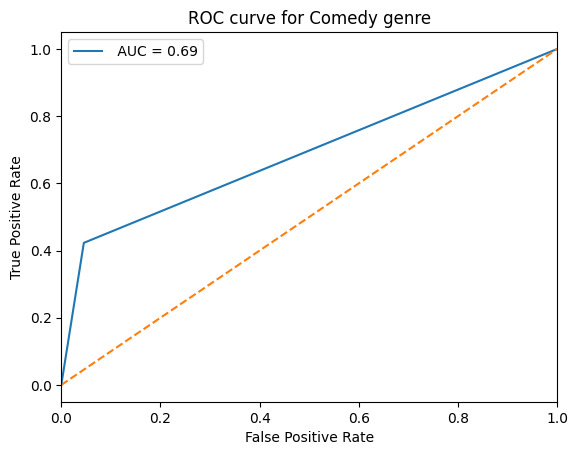

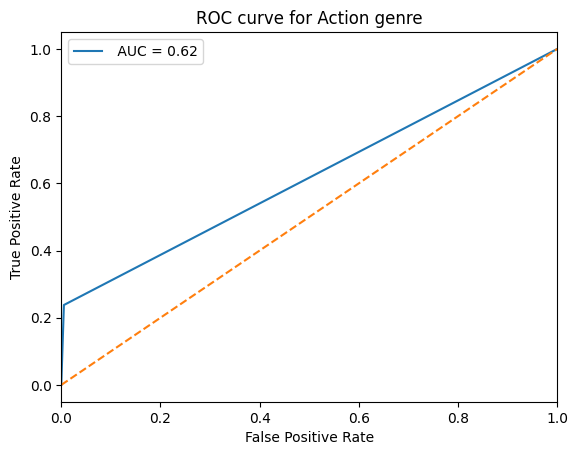

In [ ]:
### Roc curve plot for each genre
plot_roc_curve(y_test.to_numpy(), lr_y_pred)

Analysis: The higher AUC score for documentary genre highlights that logistic regression model can effectively differentiate between documentary and other genres.


##### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

##  Using Multi-output classification  since multiple target variables for genres,
## and each movie can have multiple genre classes simultaneously
rf_classifier = MultiOutputClassifier(RandomForestClassifier())

## Train  and prediction
rf_classifier.fit(X_train_data, y_train)
y_pred = rf_classifier.predict(X_test_data)


In [ ]:
from sklearn.ensemble import RandomForestClassifier

##  Using Multi-output classification  since multiple target variables for genres,
## and each movie can have multiple genre classes simultaneously
rf_classifier = MultiOutputClassifier(RandomForestClassifier())

## Train  and prediction
rf_classifier.fit(X_train_data, y_train)
y_pred = rf_classifier.predict(X_test_data)

In [ ]:
classification_reports = classification_report(y_test, y_pred, target_names=genre_list)
print(classification_reports)

                 precision    recall  f1-score   support

          Crime       0.93      0.02      0.04      1343
        Romance       0.88      0.00      0.01      1549
       TV Movie       0.72      0.01      0.02      1261
       Thriller       0.67      0.00      0.01      1329
      Adventure       0.77      0.01      0.02       911
          Drama       0.79      0.14      0.24      5195
            War       0.95      0.05      0.09       440
    Documentary       0.91      0.57      0.70      4424
         Family       0.91      0.05      0.09      1070
        Fantasy       0.56      0.01      0.03       600
        History       1.00      0.01      0.01       448
        Mystery       0.83      0.02      0.05       633
      Animation       0.92      0.54      0.68      2430
          Music       0.90      0.48      0.63      1896
Science Fiction       0.88      0.11      0.20       681
         Horror       0.91      0.12      0.21      1145
        Western       0.92    

In [ ]:
average_precision_RF = precision_score(y_test, y_pred,average ='micro')
average_precision_list['Random Forest'] = average_precision_RF
average_recall_RF = recall_score(y_test, y_pred,average ='micro')
average_recall_list['Random Forest'] = average_recall_RF
average_f1_score_RF = f1_score(y_test, y_pred,average ='micro')
average_f1_score_list['Random Forest'] = average_f1_score_RF

print("Average precision: ",average_precision_RF)
print("Average Recall: ",average_recall_RF)
print("Average f1-score: ",average_f1_score_RF)

Average precision:  0.8887510852040184
Average Recall:  0.22014008355861392
Average f1-score:  0.35287455373630433


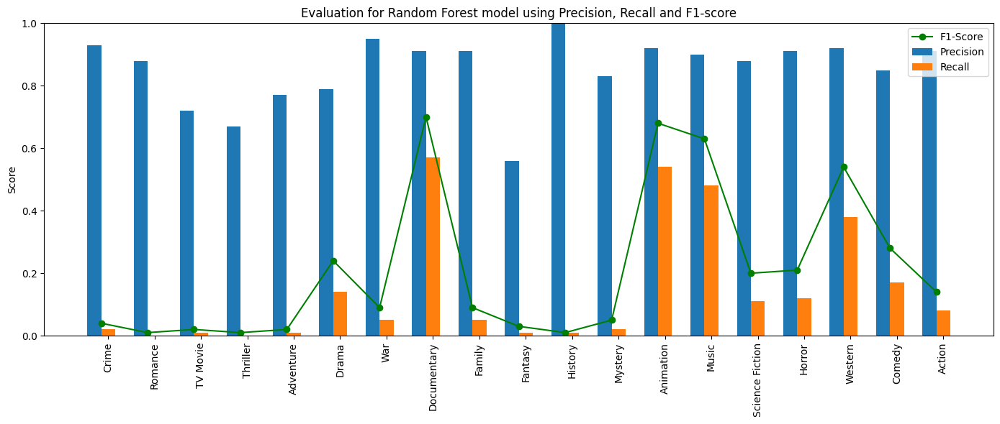

In [ ]:
### Visualizing classification report for Random Forest
plot_classification_report(classification_reports, "Random Forest")

**Result Analysis:**

By analysing Precision, Recall and F1-score, it is evident that the random forest model performs moderately well in predicting ‘Documentary’,'Western', Music and ‘Animation' genres. But, the model struggles to classify accurately for genres including 'Fantasy',‘Romance’, ‘Thriller’ which is evident from the low recall and F1-scores for these genres.

Precision helps us to measure the accuracy of the model’s positive predictions, that means, by precision, we can know what percentage of the model’s positive predictions are correct. Here, the model precision for War genre is 0.95, which means that the random forest model is correct 95% of the time when the model predicts the movie to be of War genre. Highest Precision for Random forest model is evident across History genre.

Recall helps us to understand what percentage of actual positive instances the model can accurately predict, as recall is the ratio of  correctly predicted positive instances and total positive instances.The highest recall can be seen here is for Animation genre. Here, the recall for ‘Animation’ genre is 0.54 which means that the model can predict 54% of the actual ‘Animation’ genre movies correctly.


F1- score is the harmonic mean of precision and recall, the formula of F1- score is = (2*precision * recall) / (precision+ recall).
F1-score for Documentary genre is the highest here, which is 0.70. This indicates that the random forest model effectively balances precision (the accuracy of positive predictions) and recall for 'Documentary' genre.


In [ ]:
from sklearn.metrics import multilabel_confusion_matrix
rf_conf_matrix = multilabel_confusion_matrix(y_test,y_pred)

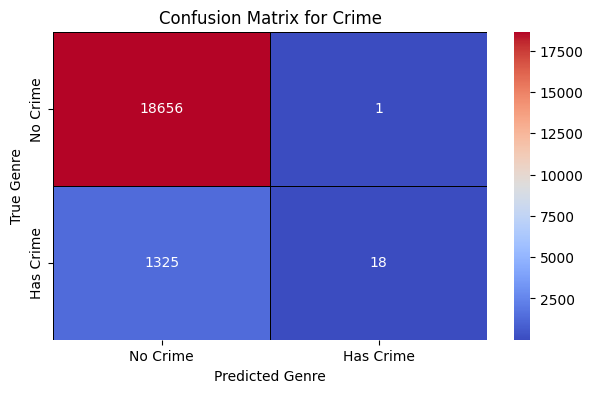

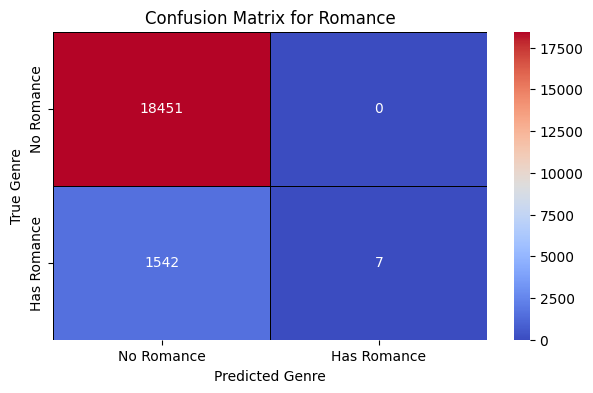

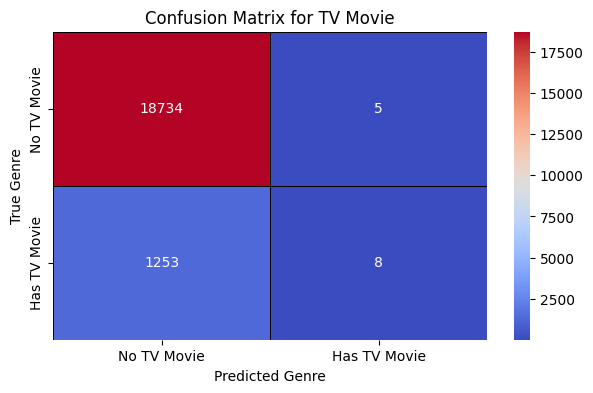

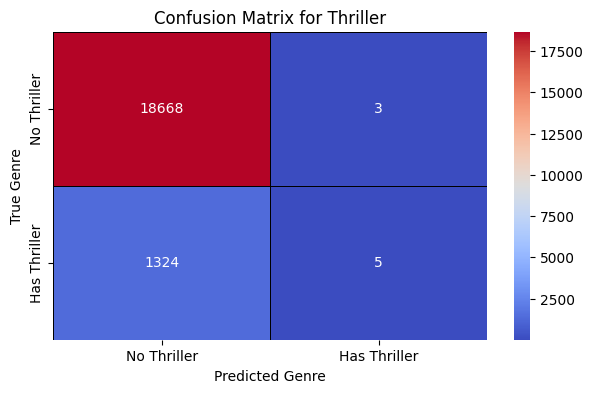

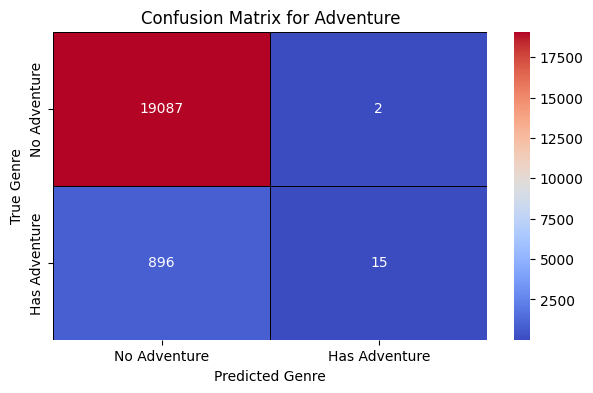

...

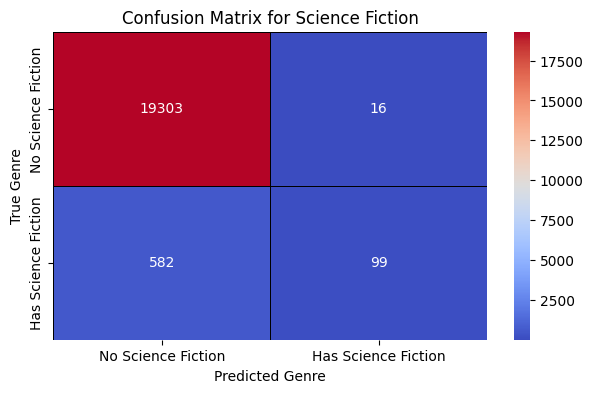

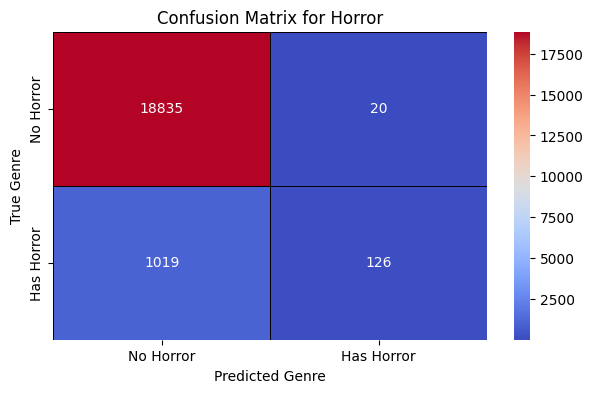

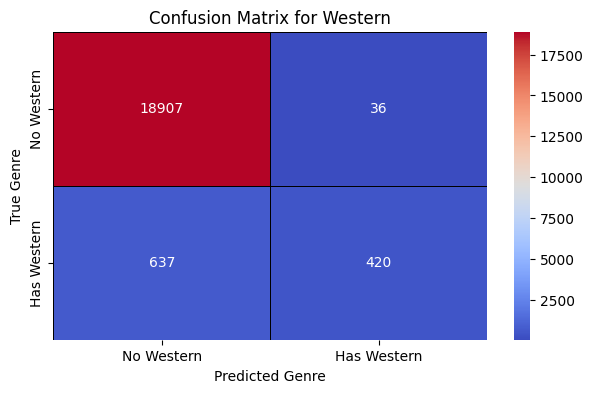

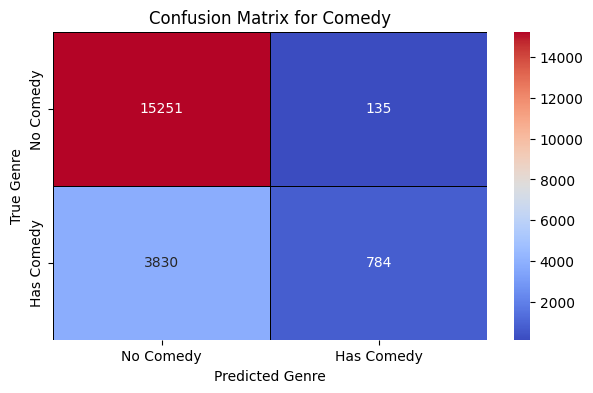

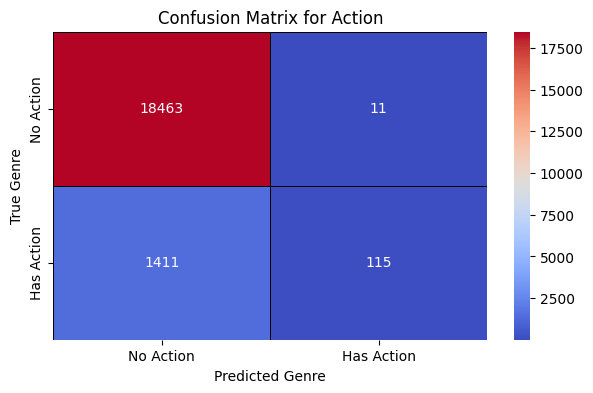

In [ ]:
### Visualizing the confusion matrix for each genre
plot_confusion_matrix(rf_conf_matrix)

Analysis: Confusion Matrix shows that visualization of correct and incorrect predictions across each genre and it is evident the model performs moderately well in  identifying Documementary  and animation genre.

In [ ]:
#### Calculating the accuracy of the random forest model for genre classification
from sklearn.metrics import accuracy_score
rf_accuracy = accuracy_score(y_test, y_pred)
print("Random Forest Model Accuracy:", rf_accuracy)

Random Forest Model Accuracy: 0.235


**Accuracy Analysis:** In multibale classification scenario, which means, instances can belong to multiple classes simultaneously, the accuracy that we got for Random Forest model is 0.2453. As this is a multilabel classification problem and there are 19 different genres and each movie can belong to multiple genres simultaneously, precision, recall and f1-score are more appropriate to evaluate the model performance than accuracy.

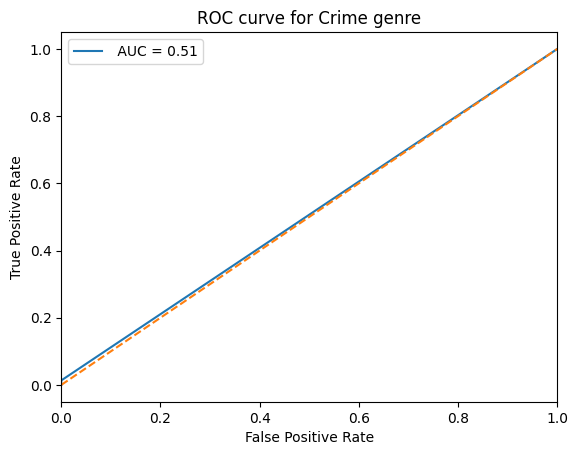

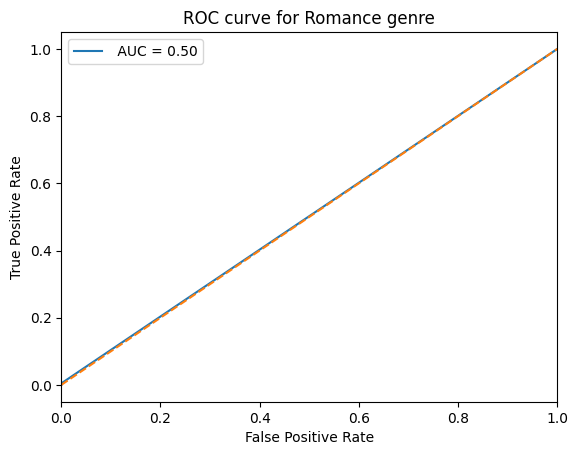

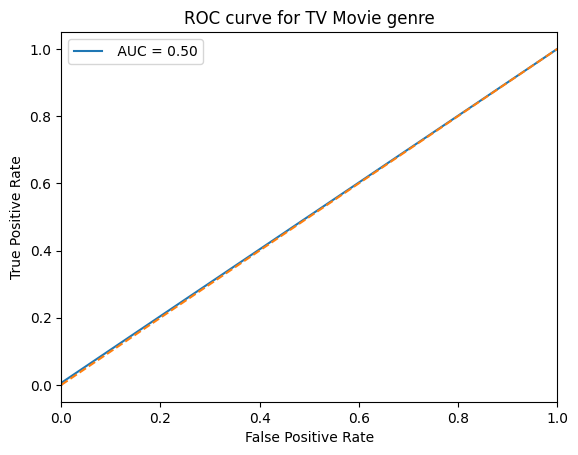

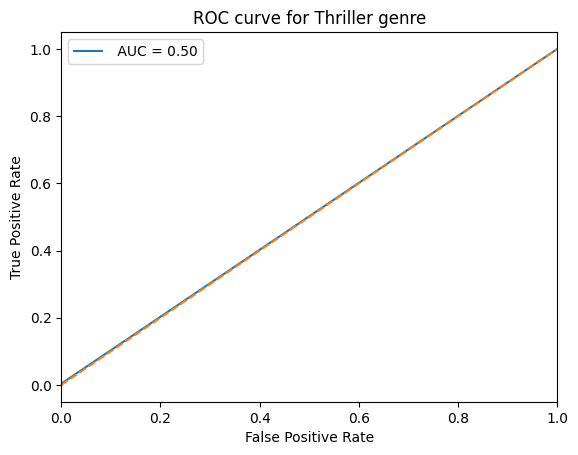

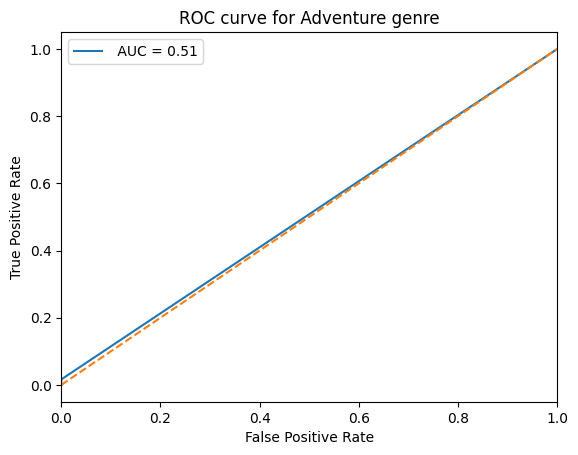

...

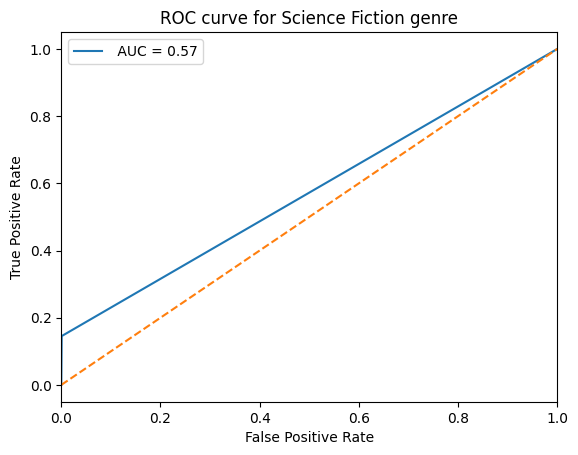

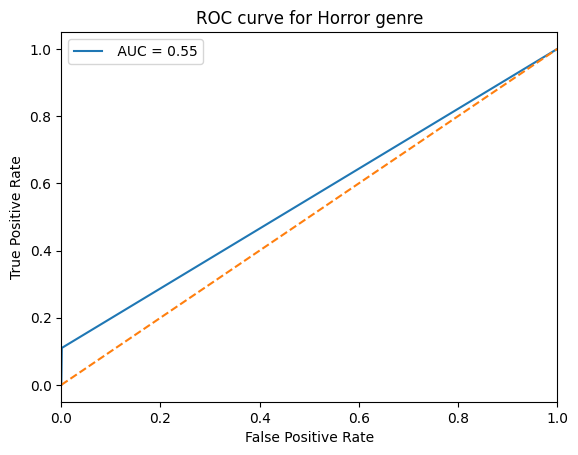

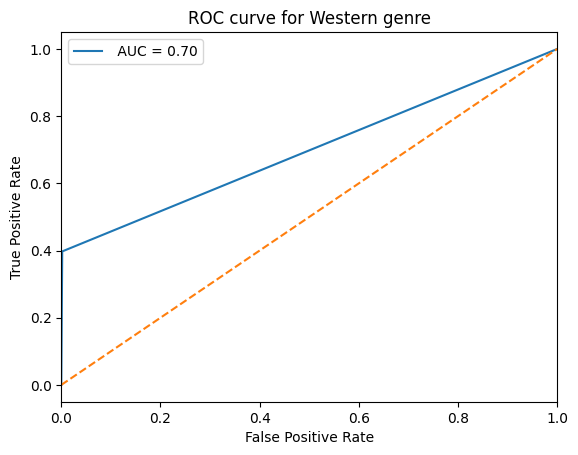

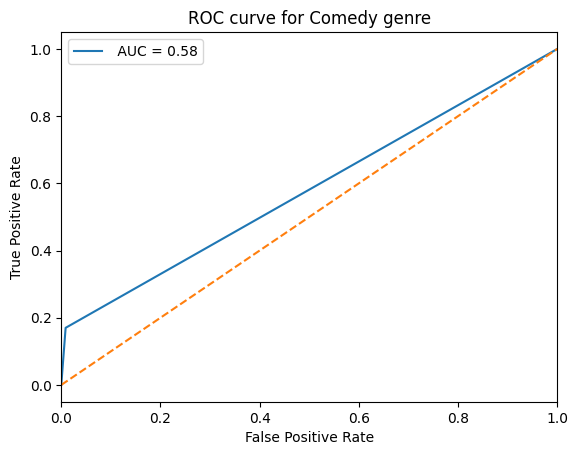

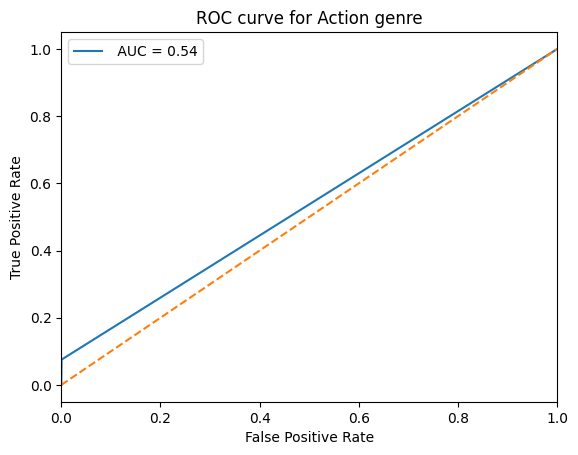

In [ ]:
### Roc curve plot for each genre
plot_roc_curve(y_test.to_numpy(), y_pred)

Analysis: The AUC for the animation genre is 0.77 using random forest model which indicates that model is performing well in distinguishing between the animation and other genre. Moreover, the model shows higher auc score for western, music and documentary genre.

##### Gradient Boosting

In [ ]:
from xgboost import XGBClassifier
##  Using Multi-output classification  since multiple target variables for genres,
## and each movie  can have multiple genre classes simultaneously
xgboost_classifier = MultiOutputClassifier(XGBClassifier())

## Train  and prediction
xgboost_classifier.fit(X_train_data, y_train)
xgboost_y_pred = xgboost_classifier.predict(X_test_data)

In [ ]:
### Showing classification report
classification_reports = classification_report(y_test, xgboost_y_pred, target_names=genre_list)
print(classification_reports)

                 precision    recall  f1-score   support

          Crime       0.60      0.25      0.35      1343
        Romance       0.50      0.12      0.19      1549
       TV Movie       0.68      0.05      0.09      1261
       Thriller       0.53      0.13      0.21      1329
      Adventure       0.64      0.13      0.22       911
          Drama       0.68      0.35      0.46      5195
            War       0.63      0.34      0.44       440
    Documentary       0.87      0.62      0.73      4424
         Family       0.67      0.18      0.28      1070
        Fantasy       0.57      0.07      0.13       600
        History       0.45      0.05      0.09       448
        Mystery       0.57      0.17      0.26       633
      Animation       0.91      0.52      0.66      2430
          Music       0.83      0.59      0.69      1896
Science Fiction       0.72      0.40      0.51       681
         Horror       0.80      0.38      0.52      1145
        Western       0.86    

In [ ]:
average_precision_XGBoost = precision_score(y_test, xgboost_y_pred,average ='micro')
average_precision_list['xgboost'] = average_precision_XGBoost
average_recall_XGBoost = recall_score(y_test, xgboost_y_pred,average ='micro')
average_recall_list['xgboost'] = average_recall_XGBoost
average_f1_score_XGBoost = f1_score(y_test, xgboost_y_pred,average ='micro')
average_f1_score_list['xgboost'] = average_f1_score_XGBoost

print("Average precision: ",average_precision_XGBoost)
print("Average Recall: ",average_recall_XGBoost)
print("Average f1-score: ",average_f1_score_XGBoost)

Average precision:  0.7662951705504897
Average Recall:  0.34851929220938804
Average f1-score:  0.4791266338661655


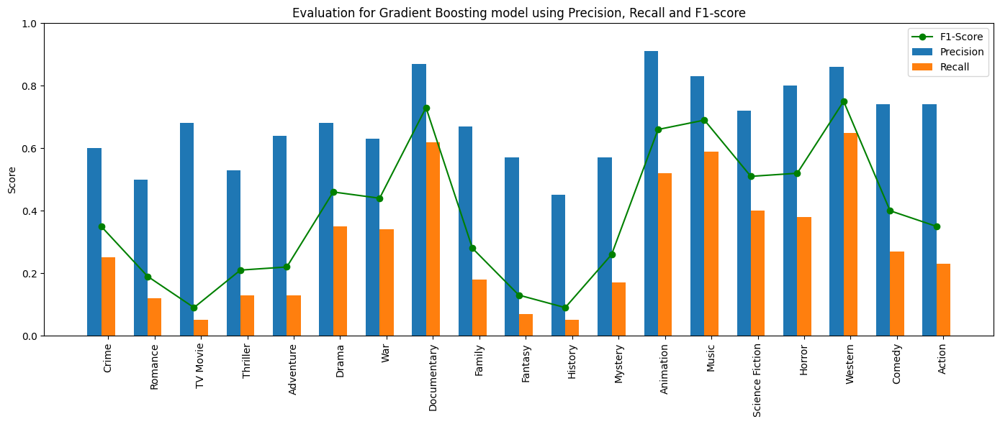

In [ ]:
### Visualizing classification report for Gradient Boosting
plot_classification_report(classification_reports,"Gradient Boosting")

**Result Analysis:**

By analysing Precision, Recall and F1-score, it is evident that the Gradient Boosting model performs moderately well in predicting **'Western', 'Documentary', Music and ‘Animation'** genres. But, the model struggles to classify accurately for genres including **'Family','Fantasy', 'TV movie' which is evident from the low recall and F1-scores for these genres.

Precision helps us to measure the accuracy of the model’s positive predictions, that means, by precision, we can know what percentage of the model’s positive predictions are correct. Here, the model precision for Animation genre is 0.91, which means that the  model is correct 91% of the time when the model predicts the movie to be of Animation genre. Highest Precision for this Gradient Boosting model can seen in 'Animation' genre.

Recall helps us to understand what percentage of actual positive instances the model can accurately predict, as recall is the ratio of  correctly predicted positive instances and total positive instances.The highest recall can be seen here is for Western genre. Here, the recall for **Western** genre is 0.65 which means that the model can predict 65% of the actual Western genre movies correctly.


F1- score for **Western** genre is the highest here, which is 0.75. This indicates that the Gradient Boosting model effectively balances precision (the accuracy of positive predictions) and recall for 'Western' genre.

In [ ]:
### showing the accuracy for Gradient boosting model
from sklearn.metrics import accuracy_score
xgboost_accuracy = accuracy_score(y_test, xgboost_y_pred)
print("Gradient Boosting Model Accuracy:", xgboost_accuracy)

Gradient Boosting Model Accuracy: 0.28585


Accuracy Analysis: In multibale classification scenario, which means, instances can belong to multiple classes simultaneously, the accuracy that we got for Gradient Boosting model is 0.2971. there is imbalanced genre class distributions.As this is a multilabel classification problem and there are 19 distinct genres, accuracy is not the perfect evaluation metric to measure model performance, for evaluation metric, I am considering Precision, Recall and F1-score.

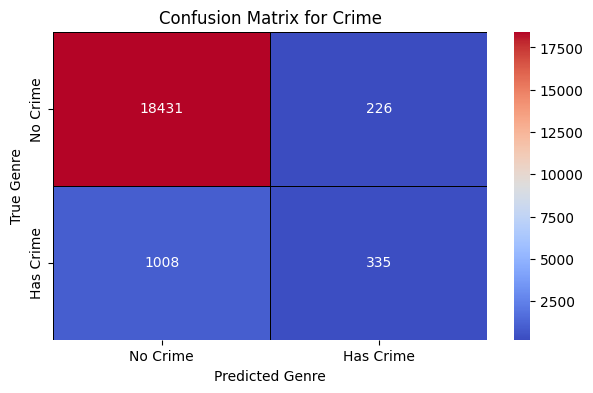

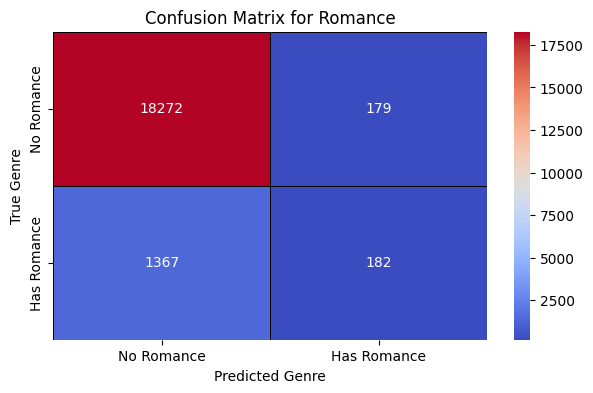

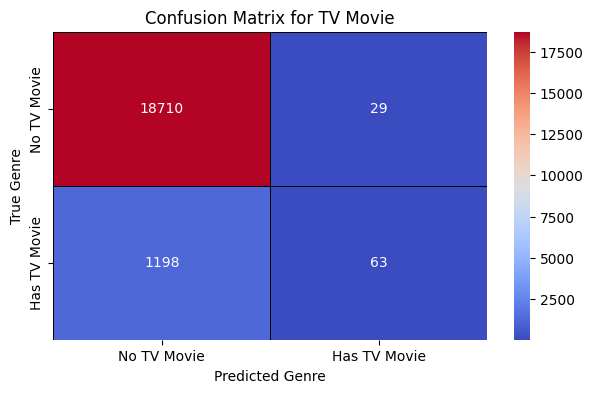

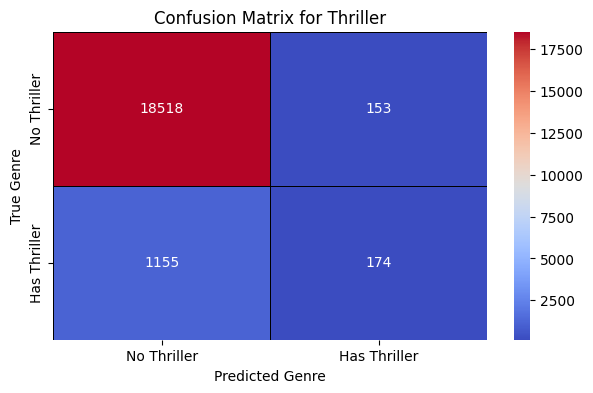

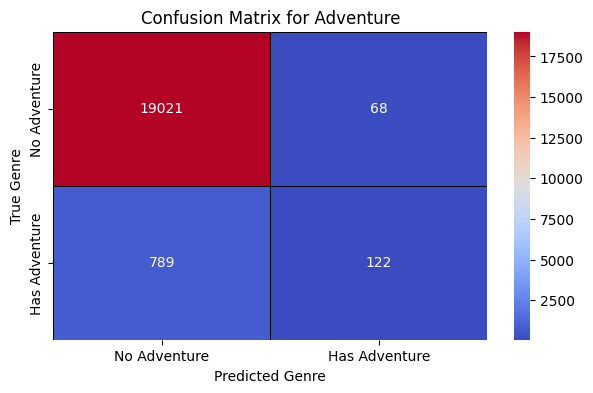

...

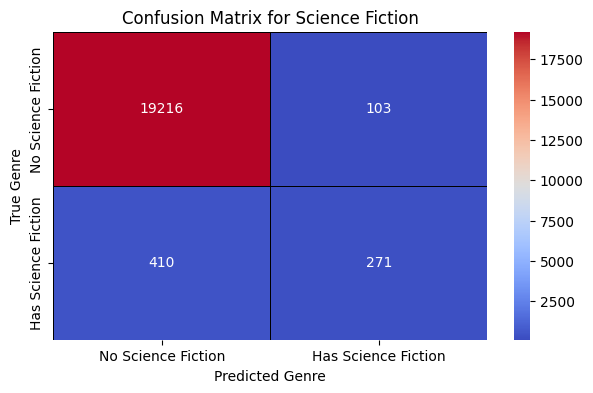

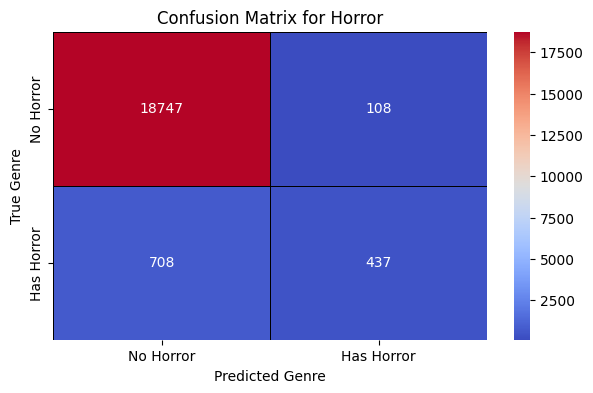

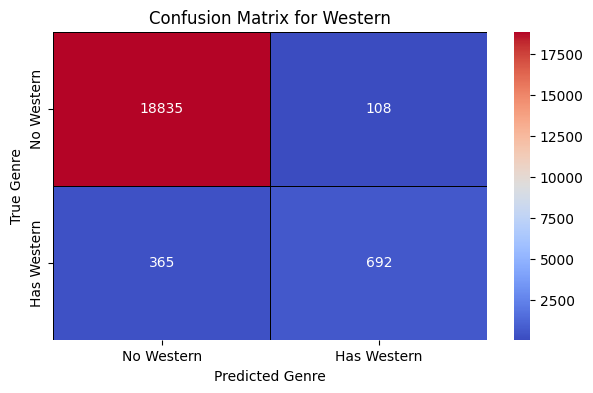

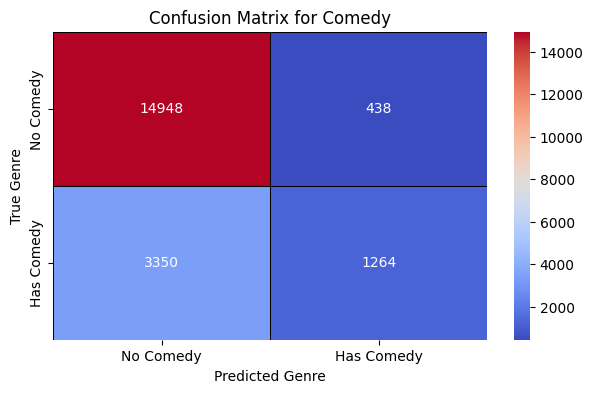

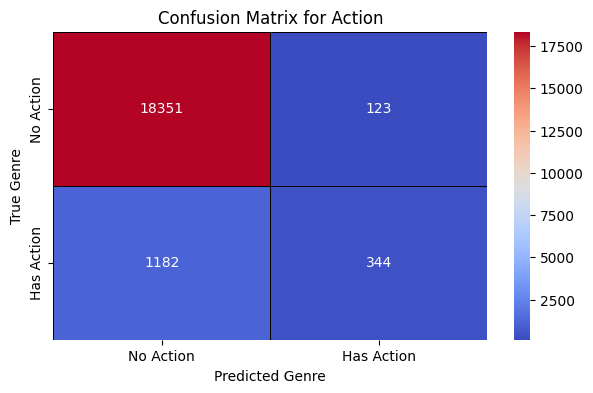

In [ ]:
## Visualizing genre-wise multilabel confusion matrices
from sklearn.metrics import multilabel_confusion_matrix
xgboost_conf_matrix = multilabel_confusion_matrix(y_test,xgboost_y_pred)
plot_confusion_matrix(xgboost_conf_matrix)

Analysis: Confusion Matrix shows that visualization of correct and incorrect predictions across each genre and it is evident the model performs moderately well in  identifying Documementary  and Western genre.

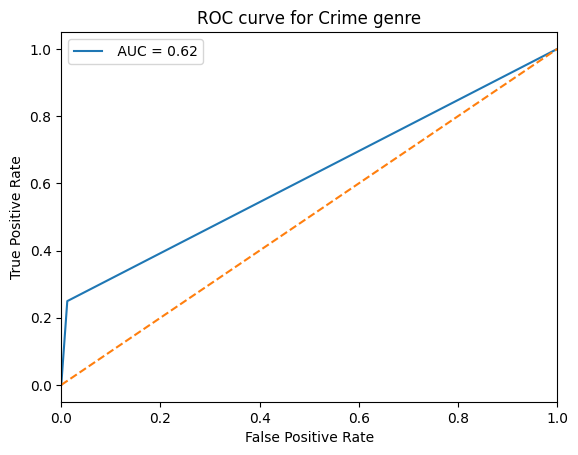

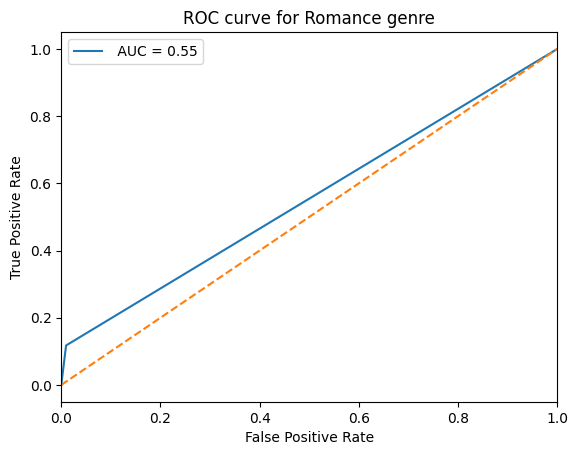

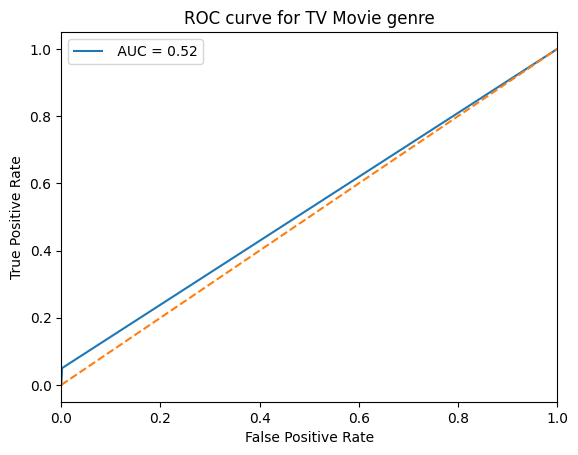

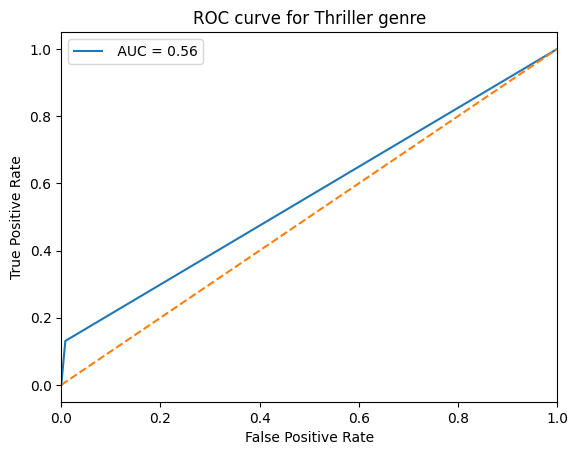

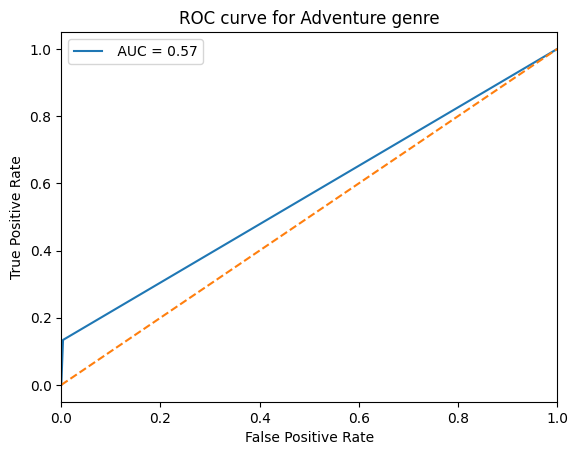

...

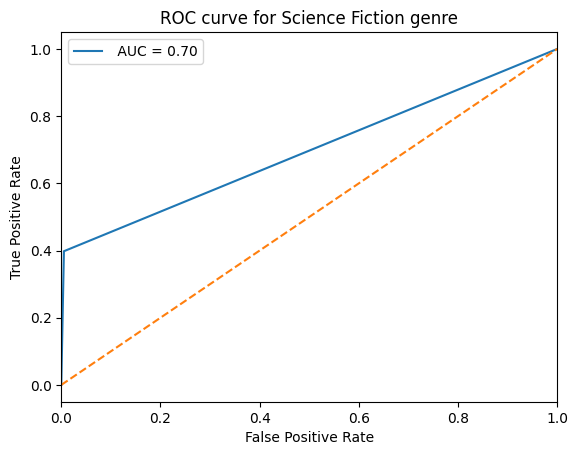

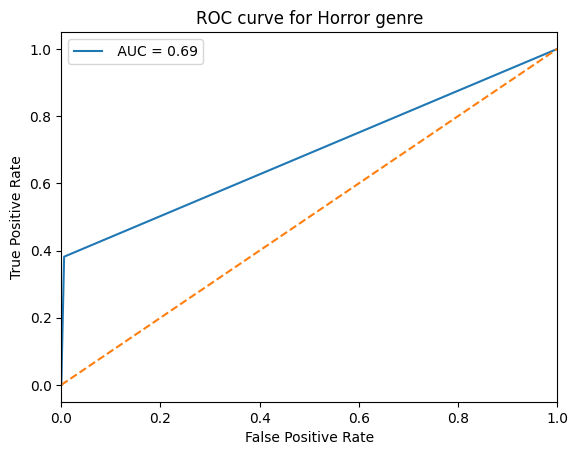

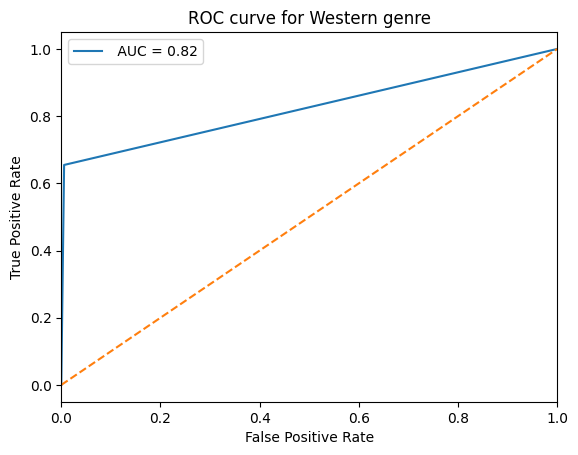

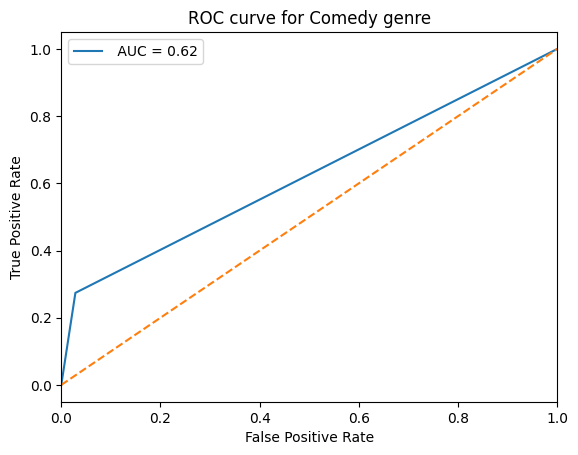

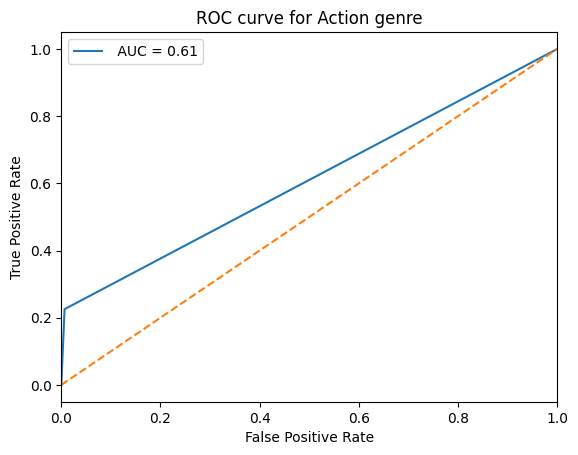

In [ ]:
## plotting roc curve for each genre
plot_roc_curve(y_test.to_numpy(),xgboost_y_pred)

 Analysis: The AUC for the western genre is 0.82 using gradient boosting model which indicates that model is performing well in distinguishing between the western and other genre.

##### Adaboost Classifier

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
##  Using Multi-output classification  since multiple target variables for genres,
## and each movie can have multiple genre classes simultaneously
adaboost_classifier = MultiOutputClassifier(AdaBoostClassifier())

## Train  and prediction
adaboost_classifier.fit(X_train_data, y_train)
adaboost_y_pred = adaboost_classifier.predict(X_test_data)

In [ ]:
## Showing classification report
classification_reports = classification_report(y_test, adaboost_y_pred, target_names=genre_list)
print(classification_reports)

                 precision    recall  f1-score   support

          Crime       0.53      0.21      0.30      1343
        Romance       0.43      0.12      0.19      1549
       TV Movie       0.46      0.03      0.06      1261
       Thriller       0.44      0.12      0.18      1329
      Adventure       0.41      0.10      0.17       911
          Drama       0.60      0.31      0.41      5195
            War       0.49      0.26      0.34       440
    Documentary       0.81      0.52      0.64      4424
         Family       0.57      0.16      0.25      1070
        Fantasy       0.52      0.10      0.17       600
        History       0.30      0.06      0.09       448
        Mystery       0.40      0.15      0.22       633
      Animation       0.86      0.46      0.60      2430
          Music       0.79      0.50      0.61      1896
Science Fiction       0.69      0.31      0.43       681
         Horror       0.66      0.34      0.45      1145
        Western       0.82    

In [ ]:
average_precision_Adaboost = precision_score(y_test, adaboost_y_pred,average ='micro')
average_precision_list['Adaboost'] = average_precision_Adaboost
average_recall_Adaboost = recall_score(y_test, adaboost_y_pred,average ='micro')
average_recall_list['Adaboost'] = average_recall_Adaboost
average_f1_score_adaboost = f1_score(y_test, adaboost_y_pred,average ='micro')
average_f1_score_list['Adaboost'] = average_f1_score_adaboost

print("Average precision: ",average_precision_Adaboost)
print("Average Recall: ",average_recall_Adaboost)
print("Average f1-score: ",average_f1_score_adaboost)

Average precision:  0.6815058889512058
Average Recall:  0.2986298844925043
Average f1-score:  0.41528537252221465


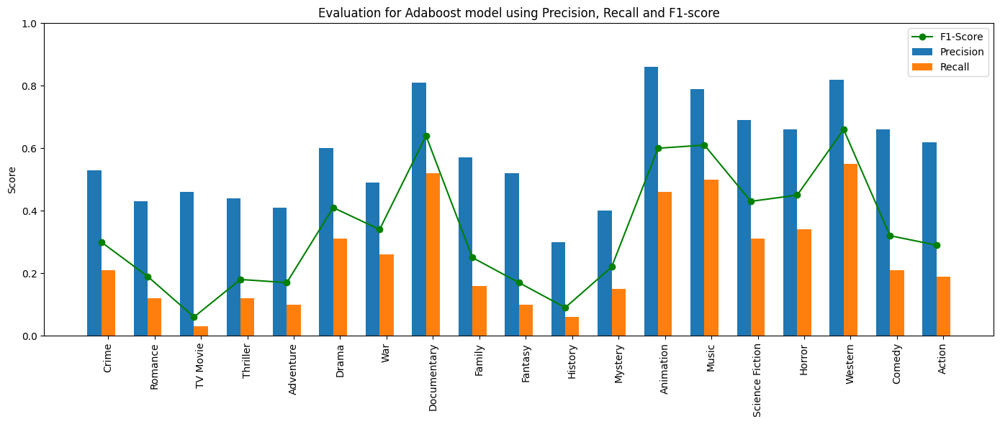

In [ ]:
### Visualizing classification report for Adaboost
plot_classification_report(classification_reports, "Adaboost")

**Result Analysis:**

By analysing Precision, Recall and F1-score, it is evident that the Adaboost Classifier model performs moderately well in predicting **'Western', documentaru, music and ‘Animation'** genres. But, the model struggles to classify accurately for genres including **'History','TV movie' which is evident from the low recall and F1-scores for these genres.

Precision helps us to measure the accuracy of the model’s positive predictions, that means, by precision, we can know what percentage of the model’s positive predictions are correct. Here, the model precision for Western genre is 0.81, which means that the  model is correct 81% of the time when the model predicts the movie to be of Western genre. Highest Precision for this Adaboost Classifier model can seen in 'Western' genre.

Recall helps us to understand what percentage of actual positive instances the model can accurately predict, as recall is the ratio of  correctly predicted positive instances and total positive instances.The highest recall can be seen here is for Animation genre. Here, the recall for **Western** genre is 0.55 which means that the model can predict 55% of the actual Western genre movies correctly.


F1- score for **Western** genre is the highest here, which is 0.66. This indicates that the Adaboost Classifier model effectively balances precision (the accuracy of positive predictions) and recall for 'Western' genre.

In [ ]:
## Calculating the accuracy for adaboost model
adaboost_accuracy = accuracy_score(y_test, adaboost_y_pred)
print("Adaboost Model Accuracy:", adaboost_accuracy)

Adaboost Model Accuracy: 0.2242


**Accuracy Analysis:** In multibale classification scenario, which means, instances can belong to multiple classes simultaneously, the accuracy that we got for Adaboost classification model is 0.2315. As this is a multilabel classification problem and there are 19 different genres, accuracy is not the proper metric to evaluate model performance in this case, for evaluating model performance, precision, recall and f1-score are considered.

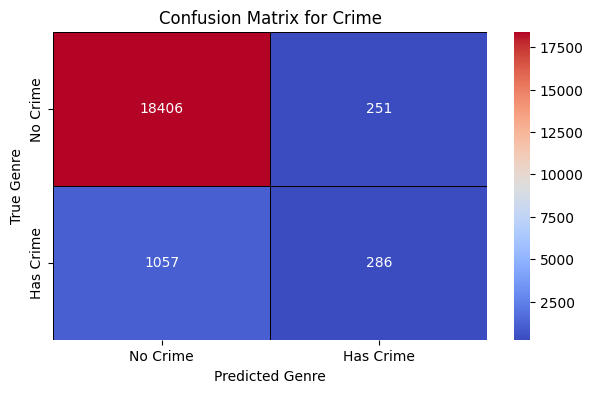

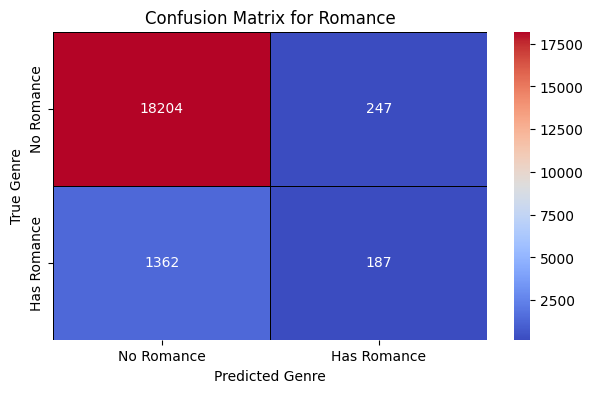

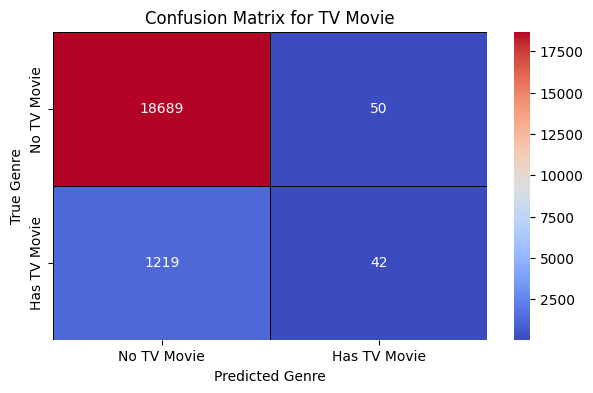

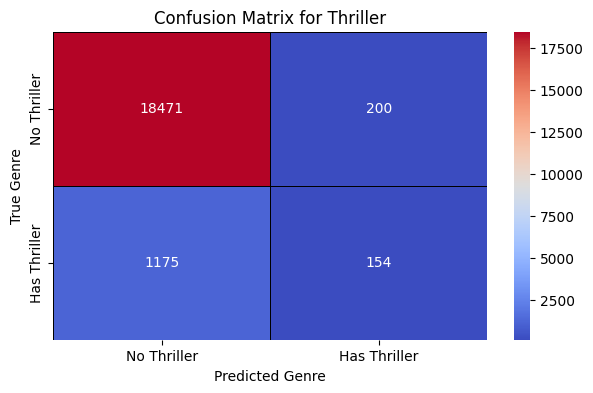

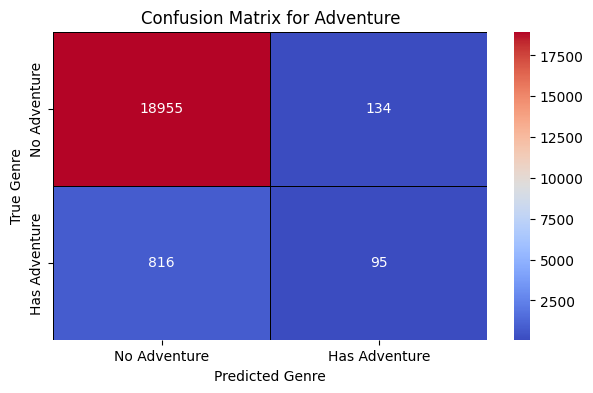

...

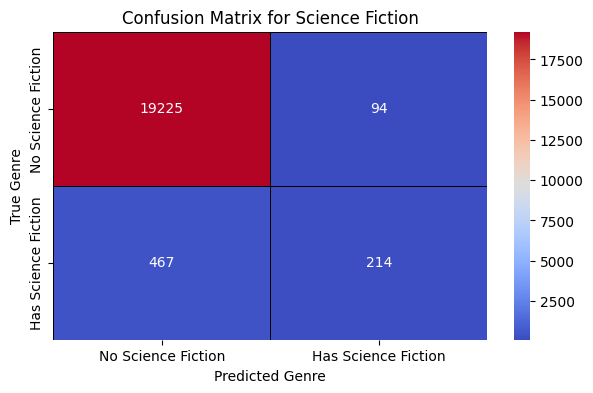

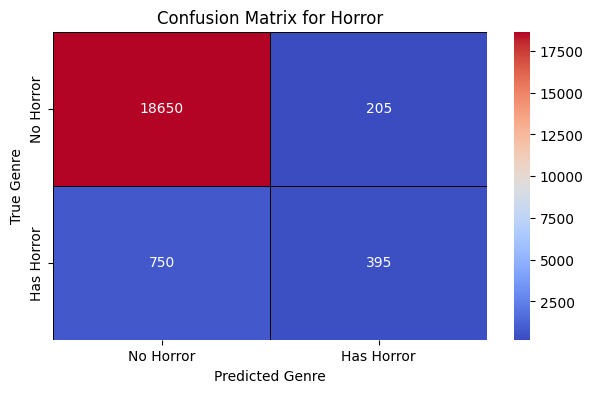

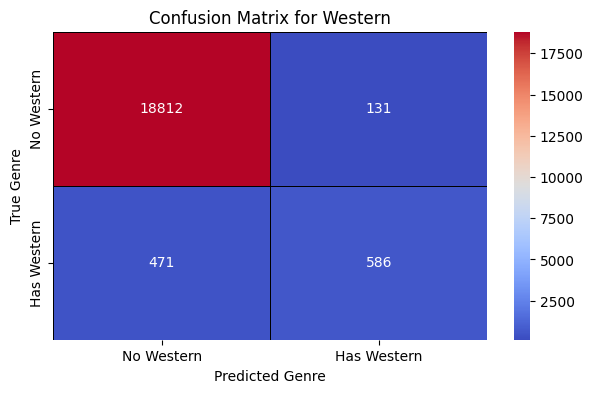

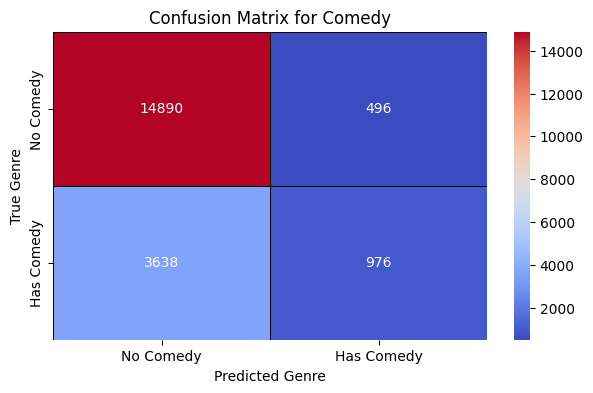

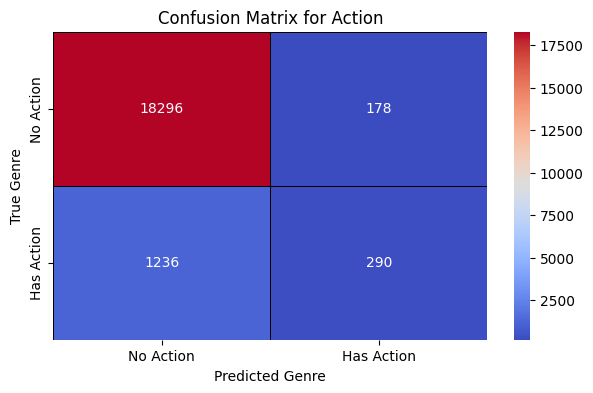

In [ ]:
## Visualizing genre-wise multilabel confusion matrices
adaboost_conf_matrix = multilabel_confusion_matrix(y_test,adaboost_y_pred)
plot_confusion_matrix(adaboost_conf_matrix)

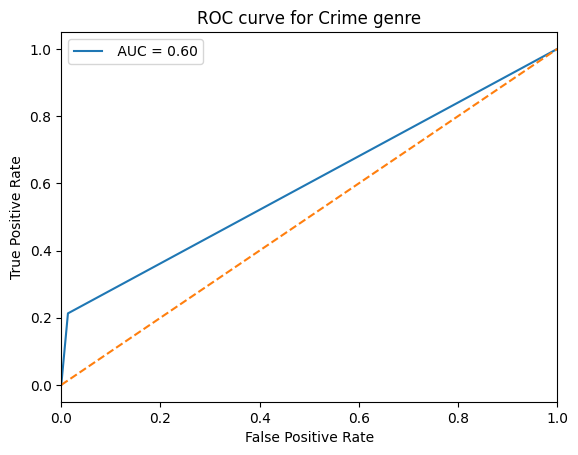

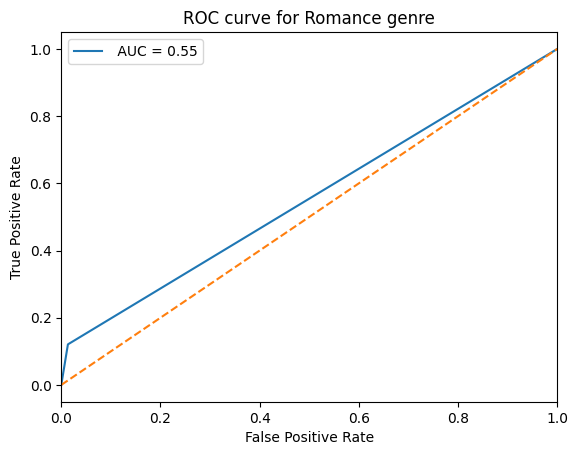

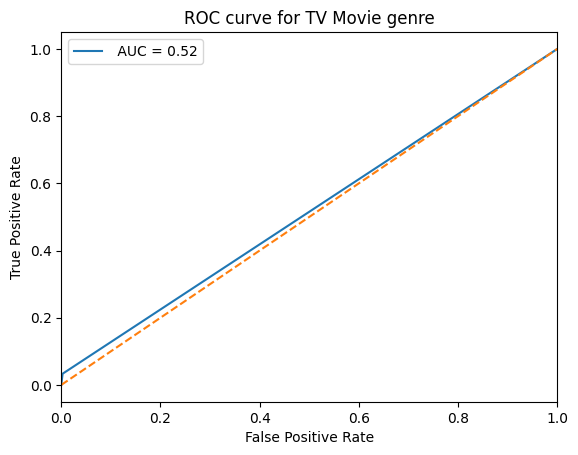

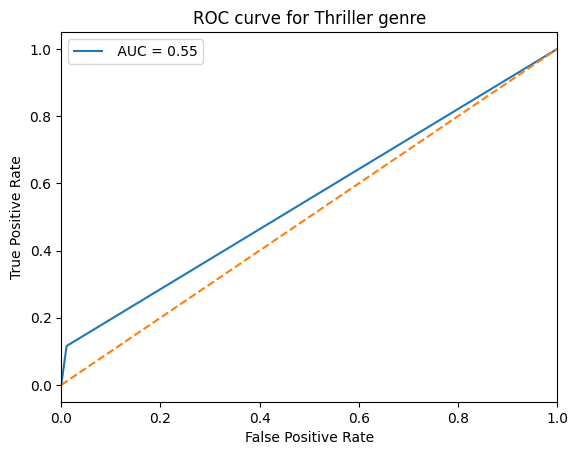

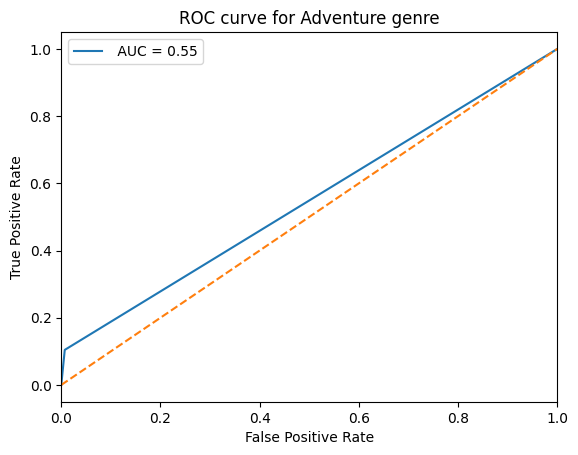

...

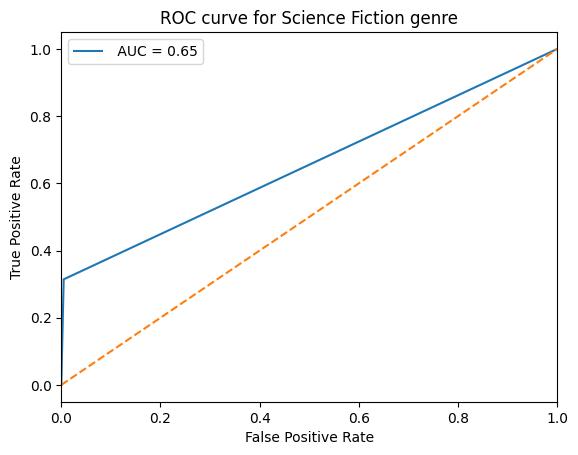

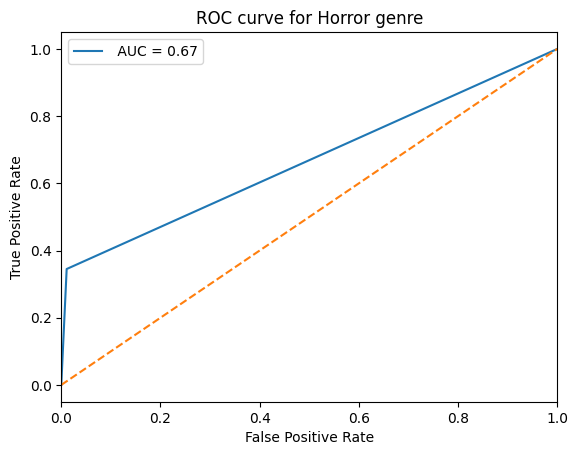

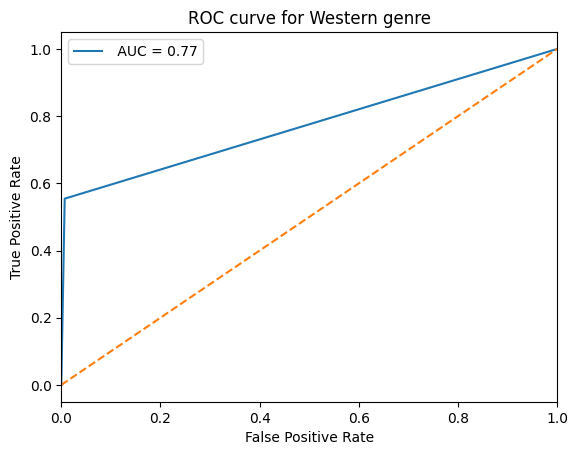

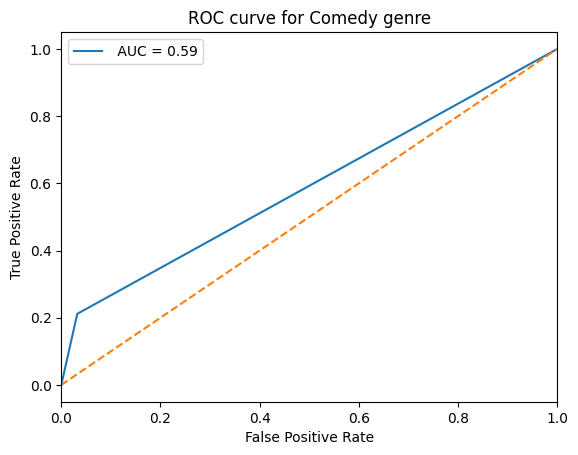

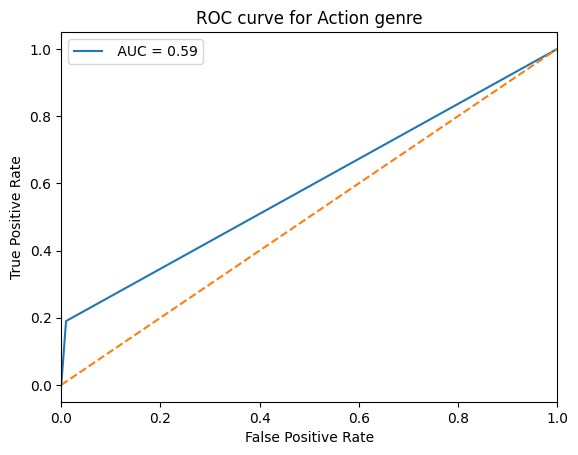

In [ ]:
## plotting roc curve for each genre
plot_roc_curve(y_test.to_numpy(),adaboost_y_pred)

Analysis of ROC curve results: Since the higher area under curve(AUC) score represents better model performance in distinguishing between classes, the adaboost model performs well in classifying documentary, animation and western genre.

##### Comparison of Model Accuacy

In [ ]:
evaluation_df = pd.DataFrame({'Model': list(average_precision_list.keys()),
                              'Average Precision': list(average_precision_list.values()),
                              'Average Recall': list(average_recall_list.values()),
                              'Average F1-Score': list(average_f1_score_list.values())
                              })
evaluation_df

,Model,Average Precision,Average Recall,Average F1-Score
0,Logistic Regression,0.788159,0.389746,0.521573
1,Adaboost,0.681506,0.298630,0.415285
2,xgboost,0.766295,0.348519,0.479127
3,Random Forest,0.888751,0.220140,0.352875


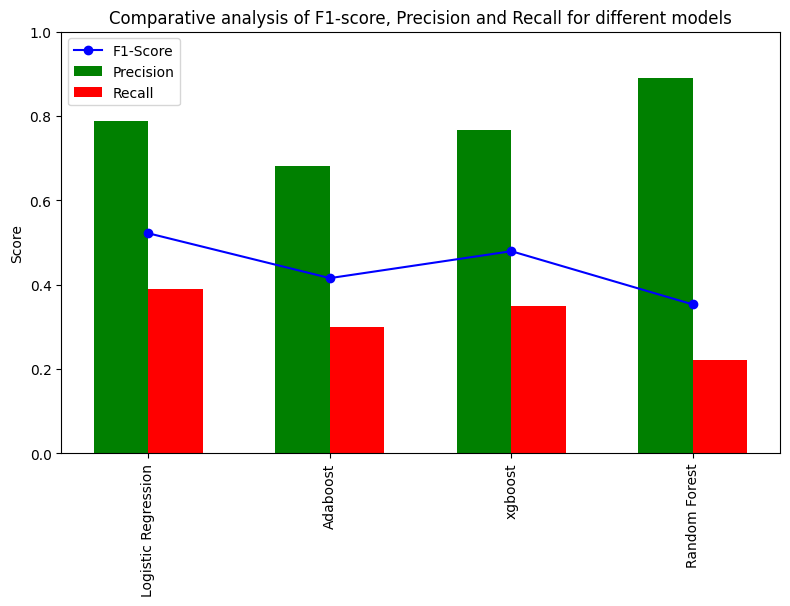

In [ ]:
models = list(average_precision_list.keys())

precision_lists = list(average_precision_list.values())
recall_lists = list(average_recall_list.values())
f1_scores_lists = list(average_f1_score_list.values())
plt.figure(figsize=(8,6))
indx = np.array(range(len(models)))
plt.bar(indx, precision_lists, width =0.3, label='Precision',color='green')
plt.bar(indx +0.3, recall_lists, width =0.3,label='Recall',color='red')
plt.plot(indx +0.15, f1_scores_lists, marker='o',label='F1-Score', color='blue')
plt.ylim((0,1))
plt.xticks(indx+0.15,models,rotation=90 )
plt.ylabel('Score')
plt.legend()
plt.tight_layout()
plt.title("Comparative analysis of F1-score, Precision and Recall for different models")
plt.show()

**Comparative Analysis:** By comparing the precision, recall and f1-score of different models for this genre classification based on movie content, it is found that Logistic Regression model provides the better performance among the compared models in terms of genre classification and the average f1-score for that model is 0.52. Logistic regresson model provides better classification result  in this mulilabel genre classification because of its ability to effectively handle multiple classes concurrently.

The average f1- scores for Random Forest, Adaboost Classifier and Gradient boosting are 0.3528, 0.415 and 0.479  respectively, which indicates that these ensemble methods also perform moderately in terms of correctly classifying all the genres in this multilabel genre classification problem due to class imbalance issues.

**One of the reasons behind lower f1-scores is the presence of imbalance class distribution and balancing the class is challenging as a movie can belong to multiple genres. Another reason is increased complexity to the classification problem due to prediction of multiple genre labels for each movie across 19 different genre classes. Moreover, misclassification of genre can occur due to overlapping characteristics between different genre classes, such as a movie with description elements of both Action and war genre may be difficult to classify accurately.**


### **Movie Ratings Prediction**

In [ ]:
### Considering those  movies which are released and actually rated
movie_rating_df = final_df.filter((col('rating_count') > 10) & (col('status') == 'Released') & (col('avg_rating') != 0))
movie_rating_prediction_df = movie_rating_df.toPandas()

In [ ]:
len(movie_rating_prediction_df)

65964

In [ ]:
movie_rating_prediction_df.columns

Index(['id', 'title', 'avg_rating', 'rating_count', 'status', 'release_date',
       'revenue', 'runtime', 'adult', 'budget', 'original_language',
       'original_title', 'overview', 'popularity', 'poster_path', 'genres',
       'production_companies', 'production_countries', 'spoken_languages',
       'release_year', 'release_month', 'Crime', 'Romance', 'TV Movie',
       'Thriller', 'Adventure', 'Drama', 'War', 'Documentary', 'Family',
       'Fantasy', 'History', 'Mystery', 'Animation', 'Music',
       'Science Fiction', 'Horror', 'Western', 'Comedy', 'Action',
       'United_States_of_America', 'United_Kingdom', 'France', 'Japan',
       'India', 'Netherlands', 'Marvel Studios', 'Pixar', 'DC Entertainment',
       'Warner Bros_ Pictures'],
      dtype='object')

In [ ]:
backup =movie_rating_prediction_df

In [ ]:
movie_rating_prediction_df = backup

In [ ]:
# Applying mapping for adult column, where 0 for false and 1 for true
movie_rating_prediction_df['adult'] = movie_rating_prediction_df['adult'].map({False:0, True:1})

In [ ]:
## Getting the list of non-numeric columns
non_numeric_columns = movie_rating_prediction_df.select_dtypes(exclude=['number']).columns.tolist()
non_numeric_columns

['title',
 'status',
 'release_date',
 'original_language',
 'original_title',
 'overview',
 'poster_path',
 'genres',
 'production_companies',
 'production_countries',
 'spoken_languages']

In [ ]:
## Now removing the non-numeric columns which are unnecessary for our target variable
movie_rating_prediction_df = movie_rating_prediction_df.drop(columns = non_numeric_columns)
movie_rating_prediction_df.head(2)

,id,avg_rating,rating_count,revenue,runtime,adult,budget,popularity,release_year,release_month,...,United_States_of_America,United_Kingdom,France,Japan,India,Netherlands,Marvel Studios,Pixar,DC Entertainment,Warner Bros_ Pictures
0,614696,7.283,1570,13416285.0,98,0,6300000.0,24.119,2020,6,...,0,0,0,0,0,0,0,0,0,0
1,416304,3.467,15,0.0,90,0,0.0,2.894,2016,9,...,1,0,0,0,0,0,0,0,0,0


In [ ]:
### Dropping unnecessary column
movie_rating_prediction_df = movie_rating_prediction_df.drop('id', axis = 1)

In [ ]:
movie_rating_prediction_df.columns

Index(['avg_rating', 'rating_count', 'revenue', 'runtime', 'adult', 'budget',
       'popularity', 'release_year', 'release_month', 'Crime', 'Romance',
       'TV Movie', 'Thriller', 'Adventure', 'Drama', 'War', 'Documentary',
       'Family', 'Fantasy', 'History', 'Mystery', 'Animation', 'Music',
       'Science Fiction', 'Horror', 'Western', 'Comedy', 'Action',
       'United_States_of_America', 'United_Kingdom', 'France', 'Japan',
       'India', 'Netherlands', 'Marvel Studios', 'Pixar', 'DC Entertainment',
       'Warner Bros_ Pictures'],
      dtype='object')

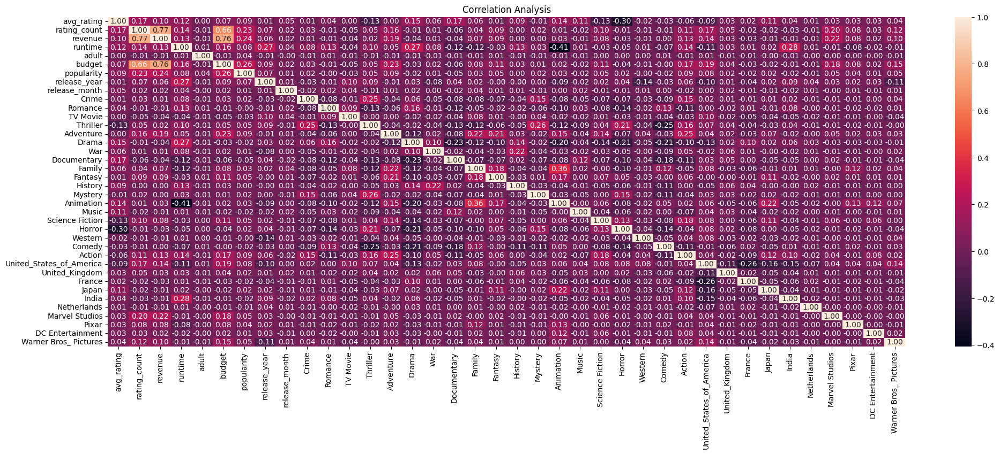

In [ ]:
import seaborn as sns
## Showing visualization for correlation analysis
plt.figure(figsize =(24,8))
sns.heatmap(movie_rating_prediction_df.corr(), annot= True, fmt='.2f')
plt.title("Correlation Analysis")
plt.show()

it can be shown that there is higher correlation between revenue and rating_count, also between budget and revenue. Also the correlation analysis shows that avg_rating column exhibits very weak correlation with all the other feature variable columns.

In [ ]:
### Splitting the dataframe into feature and target variable
X = movie_rating_prediction_df.drop('avg_rating', axis = 1)
y = movie_rating_prediction_df['avg_rating']

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

### Splitting the data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size =0.2, random_state =30)


In [ ]:
### Applying scaling to  features
scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.fit_transform(X_test)

##### Linear Regression

I split the dataset into 10 equal sized  folds. So, by training the models on 9 folds (k-1) and testing the perfomance on the remaining subset by calculating the mean squared error(mse) for each fold, then finally calculating mean of these mse values, I get the validation test set error.

Applying cross validation because the cross validation process helps in better assessment of model performance since the process trains the model on different subsets of data  and does not depend on a single validation set, which ensures consistency without being biased on a particular subset.

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold

###  linear regression model
linear_reg_model = LinearRegression()

## 10 fold
k_fold = KFold( n_splits= 10, shuffle=True, random_state = 30)


#list to store mse value
list_rmse_val = []

## K-fold  cross-validation
for train_index, test_index in k_fold.split(scaled_X_train):
  X_train_fld, X_val_fld = scaled_X_train[train_index], scaled_X_train[test_index]
  y_train_fld, y_val_fld = y_train.iloc[train_index], y_train.iloc[test_index]

  linear_reg_model.fit(X_train_fld, y_train_fld)

  ##Prediction on the validation set and calculating MSE for this fold
  y_validation_prediction = linear_reg_model.predict(X_val_fld)
  mse_val = mean_squared_error(y_val_fld, y_validation_prediction)
  list_rmse_val.append(mse_val)


### Calculating mean mse value for validation set
average_mse_Validation = np.mean(list_rmse_val)
print("Average MSE for all validation fold: ", average_mse_Validation)

Average MSE for all validation fold:  0.7742064132345918


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

### Retraining  linear regression model on the entire training dataset
linear_reg_model.fit(scaled_X_train, y_train)

### evaluating the model performance on test dataset
lr_model_y_pred = linear_reg_model.predict(scaled_X_test)
lr_model_mse = mean_squared_error(y_test, lr_model_y_pred)
print("Linear Regression model MSE on Test Dataset:", lr_model_mse)

# Calculating mean absolute error
lr_model_mae = mean_absolute_error(y_test, lr_model_y_pred)
print("Linear Regression model MAE on Test Dataset:", lr_model_mae)

Linear Regression model MSE on Test Dataset: 0.7590555808939184
Linear Regression model MAE on Test Dataset: 0.6719604395096523


In [ ]:
def comparison_predicted_actual(y_true, y_prediction):
  y_prediction =[round(value, 3) for value in y_prediction]
  comparison_df = pd.DataFrame({'Actual Rating': y_true,'Predicted Rating': y_prediction,
                                'Error in prediction': abs(y_true - y_prediction)})
  print(comparison_df.head(6))

In [ ]:
### Showing the actual and linear regression model predicted value for first few records
comparison_predicted_actual(y_test, lr_model_y_pred)

       Actual Rating  Predicted Rating  Error in prediction
24354          5.760             5.431                0.329
64664          6.500             6.226                0.274
49370          5.205             5.706                0.501
22643          6.800             6.412                0.388
59838          7.409             6.723                0.686
26403          5.853             5.492                0.361


**Result Analysis:** Here, The MSE indicates the average squared difference between the model predicted rating and actual rating. For Linear Regression Model, the MSE is 0.759 and MAE is 0.67 which indicates  that the model is performing reasonably well in predicting the movie ratings. It can be seen that there is small difference in the actual and predicted movie ratings in the predicted movie ratings.

##### Support Vector Regression (SVR)

I split the training dataset into 4 equal sized  folds. So, by training the models on 3 folds (k-1)  and testing the perfomance on the remaining subset by calculating the  mean squared error(mse) for each fold, then finally calculating mean of these mse values, I get the validation test set error.

Applying cross validation here because the cross validation process helps in better assessment of model performance since the process trains the model on different subsets of data  and does not depend on a single validation set, which ensures consistency without being biased on a particular subset.

In [ ]:
from sklearn.svm import SVR

### initilizing support vector regression model , here rbf kernel is used
svr_model = SVR(kernel='rbf')

## 4 fold
k_fold = KFold( n_splits= 4, shuffle=True, random_state = 30)


#list to store mse value
list_rmse_val_SVR = []

## Applying K-fold  cross-validation
for train_index, test_index in k_fold.split(scaled_X_train):
  X_train_fld, X_val_fld = scaled_X_train[train_index], scaled_X_train[test_index]
  y_train_fld, y_val_fld = y_train.iloc[train_index], y_train.iloc[test_index]

  svr_model.fit(X_train_fld, y_train_fld)

  ## Prediction on the validation set and calculating MSE for this fold
  y_validation_prediction = svr_model.predict(X_val_fld)
  mse_val = mean_squared_error(y_val_fld, y_validation_prediction)
  list_rmse_val_SVR.append(mse_val)


### Calculating mean mse value for validation set
average_mse_Validation_SVR = np.mean(list_rmse_val_SVR)
print("Average MSE for all validation folds for SVR: ", average_mse_Validation_SVR)

Average MSE for all validation folds for SVR:  0.6278276815000802


In [ ]:
### Retraining support vector regression model on the entire training dataset
svr_model.fit(scaled_X_train,y_train)


### evaluating the model performance on the test dataset
svr_model_pred = svr_model.predict(scaled_X_test)
svr_model_mse = mean_squared_error(y_test, svr_model_pred)
print("Support Vector Regression model MSE on test data:", svr_model_mse)

## Mean Absolute Error
svr_model_mae = mean_absolute_error(y_test, svr_model_pred)
print("Support Vector Regression model MAE on test data:", svr_model_mae)

Support Vector Regression model MSE on test data: 0.6084645215329556
Support Vector Regression model MAE on test data: 0.5877006719726923


In [ ]:
### Showing the  comparison of actual and svr model predicted value for first few records
comparison_predicted_actual(y_test, svr_model_pred)

       Actual Rating  Predicted Rating  Error in prediction
24354          5.760             5.426                0.334
64664          6.500             6.315                0.185
49370          5.205             5.608                0.403
22643          6.800             6.801                0.001
59838          7.409             7.104                0.305
26403          5.853             5.827                0.026


**Result Analysis:** Here, The MSE indicates the average squared difference between the model predicted rating and actual rating. For Support Vector Regression Model, the MSE is 0.608 and the MAE is 0.5877 which indicates  that the model is performing reasonably well in predicting the movie ratings. It can be seen that  the predicted movie ratings are close to the actual ratings and there is small difference in the actual and predicted movie ratings in the predicted movie ratings.

##### Ridge Regression

I split the training dataset into 10 equal sized  folds. So, by training the models on 9 folds (k-1)  and testing the perfomance on the remaining subset by calculating the  mean squared error(mse) for each fold, then finally calculating mean of these mse values, I get the validation test set error.

Applying cross validation here because the cross validation process helps in better assessment of model performance since the process trains the model on different subsets of data  and does not depend on a single validation set, which ensures consistency without being biased on a particular subset.

In [ ]:
from sklearn.linear_model import Ridge

###  ridge regression model, introducing penalty term by setting the value of regularization parameter(alpha)
ridge_model = Ridge(alpha = 0.1)

## 10 fold
k_fold = KFold( n_splits= 10, shuffle=True, random_state = 30)


#list to store mse value
list_rmse_val_Ridge = []

## Applying K-fold  cross-validation
for train_index, test_index in k_fold.split(scaled_X_train):
  X_train_fld, X_val_fld = scaled_X_train[train_index], scaled_X_train[test_index]
  y_train_fld, y_val_fld = y_train.iloc[train_index], y_train.iloc[test_index]

  ridge_model.fit(X_train_fld, y_train_fld)

  ## Prediction on the validation set and calculating MSE for this fold
  y_validation_prediction = ridge_model.predict(X_val_fld)
  mse_val = mean_squared_error(y_val_fld, y_validation_prediction)
  list_rmse_val_Ridge.append(mse_val)


### Calculating mean mse value for validation set
average_mse_Validation_Ridge = np.mean(list_rmse_val_Ridge)
print("Average MSE for all validation folds for Ridge model: ", average_mse_Validation_Ridge)

Average MSE for all validation folds for Ridge model:  0.7742064032877551


In [ ]:
### Retraining ridge regression model on the entire training data
ridge_model.fit(scaled_X_train, y_train)


### evaluating the model performance on test dataset
ridge_model_pred = ridge_model.predict(scaled_X_test)
ridge_model_mse = mean_squared_error(y_test, ridge_model_pred)
print("Ridge Regression model MSE on test data:", ridge_model_mse)

ridge_model_mae = mean_absolute_error(y_test, ridge_model_pred)
print("Ridge Regression model MAE on test data:", ridge_model_mae)

Ridge Regression model MSE on test data: 0.7590555352557175
Ridge Regression model MAE on test data: 0.6719604472248455


In [ ]:
### Showing the  comparison of actual and ridge regression model predicted value for first few records
comparison_predicted_actual(y_test, ridge_model_pred)

       Actual Rating  Predicted Rating  Error in prediction
56507           6.70             6.349                0.351
46960           6.00             5.810                0.190
32300           5.70             5.877                0.177
52881           6.90             6.276                0.624
23734           6.11             6.058                0.052
7657            6.10             6.520                0.420


**Result Analysis:** Here, The MSE indicates the average squared difference between the model predicted rating and actual rating. For Ridge Regression Model, the MSE is 0.759 and the MAE is 0.67 which indicates  that the model is performing  well in predicting the movie ratings. It can be seen that there is small difference in the actual and predicted movie ratings in the predicted movie ratings.

##### Decision Tree Regressor

I split the training dataset into 15 equal sized  folds. So, by training the models on 14 folds (k-1)  and testing the perfomance on the remaining subset by calculating the  mean squared error(mse) for each fold, then finally calculating mean of these mse values, I get the validation test set error.

Applying cross validation here because the cross validation process helps in better assessment of model performance since the process trains the model on different subsets of data  and does not depend on a single validation set, which ensures consistency without being biased on a particular subset.

In [ ]:
from sklearn.tree import DecisionTreeRegressor

### decision tree regressor model
dt_regressor_model = DecisionTreeRegressor()

## 15 fold
k_fold = KFold(n_splits= 15, shuffle=True, random_state = 30)


#list to store mse value
list_rmse_val_DT = []

## Applying K-fold  cross-validation
for train_index, test_index in k_fold.split(X_train):
  X_train_fld, X_val_fld = X_train.iloc[train_index], X_train.iloc[test_index]
  y_train_fld, y_val_fld = y_train.iloc[train_index], y_train.iloc[test_index]

  dt_regressor_model.fit(X_train_fld, y_train_fld)

  ## Prediction on the validation set and calculating MSE for this fold
  y_validation_prediction = dt_regressor_model.predict(X_val_fld)
  mse_val = mean_squared_error(y_val_fld, y_validation_prediction)
  list_rmse_val_DT.append(mse_val)


### Calculating mean mse value for validation set
average_mse_Validation_DT = np.mean(list_rmse_val_DT)
print("Average MSE for all validation folds for DT: ", average_mse_Validation_DT)

Average MSE for all validation folds for DT:  1.1434913617398779


In [ ]:
### Retraining decision tree regressor model on the entire training dataset
dt_regressor_model.fit(X_train, y_train)


### evaluating the model performance on the test dataset
dt_regressor_model_pred = dt_regressor_model.predict(X_test)
dt_regressor_model_mse = mean_squared_error(y_test, dt_regressor_model_pred)
print("Decision Tree Regressor model MSE on test data:", dt_regressor_model_mse)

dt_regressor_model_mae = mean_absolute_error(y_test, dt_regressor_model_pred)
print("Decision Tree Regressor model MAE on test data:", dt_regressor_model_mae)

Decision Tree Regressor model MSE on test data: 1.1224135922837868
Decision Tree Regressor model MAE on test data: 0.7999950731448496


**Result Analysis:** Here, The MSE indicates the average squared difference between the model predicted rating and actual rating. For Decision Tree Model, the MSE is 1.122 and MAE is 0.799 which indicates  that the model is performing poorly comparative to the other models in predicting the movie ratings because the model is more prone to overfitting .

In [ ]:
### Showing the comparison of actual and decision tree regressor model predicted value for first few records
comparison_predicted_actual(y_test, dt_regressor_model_pred)

       Actual Rating  Predicted Rating  Error in prediction
24354          5.760             4.976                0.784
64664          6.500             5.900                0.600
49370          5.205             4.749                0.456
22643          6.800             4.069                2.731
59838          7.409             7.700                0.291
26403          5.853             4.100                1.753


##### Random Forest

Random Forest model is useful in prediction because of its resilience to overfitting. it also provides insights into feature importance which is helpful to understand which feature is most influential factor contributing to movie ratings.

In [ ]:
from sklearn.ensemble import RandomForestRegressor

### Training  random forest model
random_forest_model = RandomForestRegressor(n_estimators=100)
## 5 fold
k_fold = KFold(n_splits= 5, shuffle=True, random_state = 30)


#list to store mse value
list_rmse_val_RF = []

## Applying K-fold  cross-validation
for train_index, test_index in k_fold.split(X_train):
  X_train_fld, X_val_fld = X_train.iloc[train_index], X_train.iloc[test_index]
  y_train_fld, y_val_fld = y_train.iloc[train_index], y_train.iloc[test_index]

  random_forest_model.fit(X_train_fld, y_train_fld)

  ## Prediction on the validation set and calculating MSE for this fold
  y_validation_prediction = random_forest_model.predict(X_val_fld)
  mse_val = mean_squared_error(y_val_fld, y_validation_prediction)
  list_rmse_val_RF.append(mse_val)


In [ ]:
### Retraining random forest model on the entire training dataset
random_forest_model.fit(X_train, y_train)
### evaluating the model performance
random_forest_pred = random_forest_model.predict(X_test)
random_forest_mse = mean_squared_error(y_test, random_forest_pred)
print("Random Forest model MSE:", random_forest_mse)

random_forest_mae = mean_absolute_error(y_test, random_forest_pred)
print("Random Forest model MAE:", random_forest_mae)

Random Forest model MSE: 0.5542582816453271
Random Forest model MAE: 0.5596337042370955


In [ ]:
### Showing the actual and predicted value for first few records
comparison_predicted_actual(y_test, random_forest_pred)

       Actual Rating  Predicted Rating  Error in prediction
24354          5.760             5.295                0.465
64664          6.500             6.115                0.385
49370          5.205             5.910                0.705
22643          6.800             6.415                0.385
59838          7.409             6.764                0.645
26403          5.853             5.485                0.368


**Result Analysis:** Here, The MSE indicates the average squared difference between the model predicted rating and actual rating. For Random Forest Model, the MSE is **0.5554** and mae is 0.559 which indicates  that the model is performing well in predicting the movie ratings. It can be seen that there is very less error in the predicted movie ratings because the **random forest model leverages the combined predictions of multiple decision tree model**, which actually helps to reduce overfitting and capture complex patterns.

In [ ]:
#### Finding the  top 4 important features for movie ratings
important_feature = random_forest_model.feature_importances_
important_feature_df = pd.DataFrame({'Feature_Name': X.columns, 'Feature_Importance':important_feature })
top4_features = important_feature_df.sort_values(by='Feature_Importance', ascending = False).head(4)
top4_features

,Feature_Name,Feature_Importance
0,rating_count,0.155179
2,runtime,0.150800
6,release_year,0.139980
5,popularity,0.125219


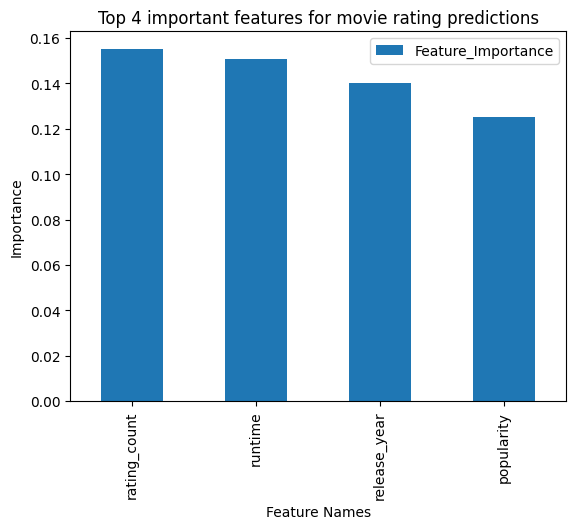

In [ ]:
### Visualizing the important features for movie rating predictions in a bar chart
ax = top4_features.plot(kind='bar', x= 'Feature_Name', y='Feature_Importance')
plt.title("Top 4 important features for movie rating predictions")
plt.xlabel("Feature Names")
plt.ylabel("Importance")

plt.xticks(rotation =90)
plt.show()

The feature importances suggest that runtime, rating count, release year and popularity are really important and most influential features for prediction of movie ratings. These insights are really useful for understanding the most crucial and impactful features that influence the movie ratings.

##### Bagging Regressor

Bagging regressor which is an ensemble learning method, is useful because in bagging, predictions of multiple base estimators are combined which helps to reduce variance and improve model performance.

In [ ]:
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor

### Training bagging regressor model
base_estimate_model = DecisionTreeRegressor()
bagging_model = BaggingRegressor(estimator = base_estimate_model,
                                 n_estimators = 50)
bagging_model.fit(X_train, y_train)


### evaluating the model performance
bagging_model_pred = bagging_model.predict(X_test)
bagging_model_mse = mean_squared_error(y_test, bagging_model_pred)
print("Bagging Regressor model MSE:", bagging_model_mse)

bagging_model_mae = mean_absolute_error(y_test, bagging_model_pred)
print("Bagging Regressor model MAE:", bagging_model_mae)

Bagging Regressor model MSE: 0.5609163589822482
Bagging Regressor model MAE: 0.5636869976502691


In [ ]:
### Showing the comparison of actual and bagging regressor model predicted value for first few records
comparison_predicted_actual(y_test, bagging_model_pred)

       Actual Rating  Predicted Rating  Error in prediction
24354          5.760             5.455                0.305
64664          6.500             5.955                0.545
49370          5.205             5.870                0.665
22643          6.800             6.547                0.253
59838          7.409             6.801                0.608
26403          5.853             5.538                0.315


**Result Analysis:** Here, The MSE indicates the average squared difference between the model predicted rating and actual rating. For Bagging Regressor Model, the MSE is 0.56 and MAE(mean absolute error) is 0.563 which indicates  that the model is performing extremely well in predicting the movie ratings. It can be seen that there is very small difference in the actual and predicted movie ratings in the predicted movie ratings, because it is an ensemble approach which averages the prediction of multiple decision trees, this helps to reduce overfitting.

##### extreme Gradient Boosting (XGBoost)

extreme Gradient Boosting (XGBoost) which is an ensemble learning method is chosen due it's abiltity to capture complex and non-linear relationship between the variables and the robustness to overfitting.

In [ ]:
import xgboost as xgb

### Training gradient boosting model
xgboost_model = xgb.XGBRegressor(objective = 'reg:squarederror',
                                 n_estimators = 800,
                                 learning_rate =0.1)
xgboost_model.fit(X_train, y_train)


### evaluating the model performance
xgboost_model_pred = xgboost_model.predict(X_test)
xgboost_model_mse = mean_squared_error(y_test, xgboost_model_pred)
print("extreme Gradient Boosting model MSE:", xgboost_model_mse)

xgboost_model_mae = mean_absolute_error(y_test, xgboost_model_pred)
print("extreme Gradient Boosting model MAE:", xgboost_model_mae)

extreme Gradient Boosting model MSE: 0.5400134436103625
extreme Gradient Boosting model MAE: 0.5503139931993868


In [ ]:
### Showing the actual and predicted value for first few records
comparison_predicted_actual(y_test, xgboost_model_pred)

       Actual Rating  Predicted Rating  Error in prediction
24354          5.760             5.617                0.143
64664          6.500             5.963                0.537
49370          5.205             5.764                0.559
22643          6.800             6.835                0.035
59838          7.409             6.785                0.624
26403          5.853             6.132                0.279


**Result Analysis:** For extreme gradient boosting Model, the MSE is 0.54 and the MAE is 0.55 which indicates  that the model is performing extremely well in predicting the movie ratings. It can be seen that the predicted ratings are close to the actual rating and there is very small amount of difference between the actual and predicted ratings because **it is an ensemble approach .aggregating predictions of multiple base models**

##### Comparative Analysis of different models performance for Movie Rating Prediction

###### Comparison of the Mean Squared Error of different models for Movie Rating Prediction

In [ ]:
## Here, creating a datframe for showing the mse values for different models

model_names =['Linear Regression', 'Ridge Regression','Support Vector Regression',
              'Decision Tree Regressor', 'Random Forest','Bagging Regressor','XGBoost']
mse_list =[lr_model_mse,ridge_model_mse,svr_model_mse,dt_regressor_model_mse,random_forest_mse,bagging_model_mse,xgboost_model_mse]
mse_df = pd.DataFrame({'Model Name': model_names, 'MSE': mse_list})
mse_df

,Model Name,MSE
0,Linear Regression,0.759056
1,Ridge Regression,0.759056
2,Support Vector Regression,0.608465
3,Decision Tree Regressor,1.122414
4,Random Forest,0.554258
5,Bagging Regressor,0.560916
6,XGBoost,0.540013


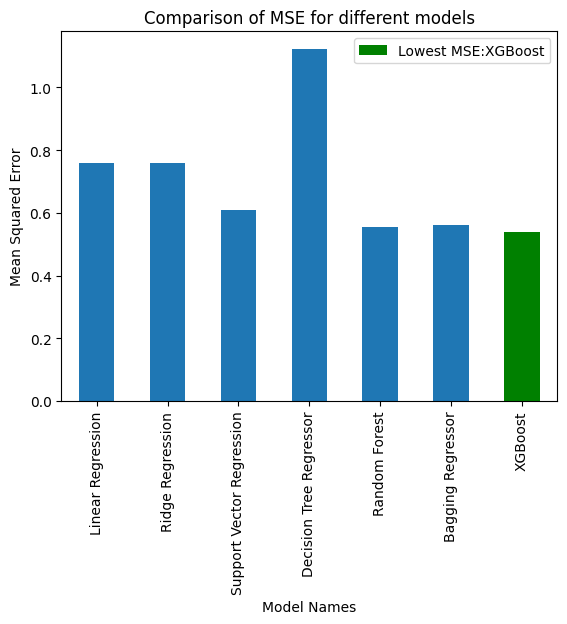

In [ ]:
### Visualizing the comparison of mse for  different models a bar chart

ax = mse_df.plot(kind='bar', x= 'Model Name')
plt.title("Comparison of MSE for different models")
plt.xlabel("Model Names")
plt.ylabel("Mean Squared Error")

## Setting green color for highlighting the model having lowest mse
lowest_mse = mse_df['MSE'].idxmin()
lowest_mse_patch = ax.patches[lowest_mse]
lowest_mse_patch.set_facecolor('green')
ax.legend([lowest_mse_patch], [f'Lowest MSE:{mse_df.iloc[lowest_mse]["Model Name"]}'], loc='best')
plt.xticks(rotation =90)
plt.show()

###### Comparison of the Mean Absolute Error of different models for Movie Rating Prediction

In [ ]:
## Here, creating a datframe for showing the mse values for different models

model_names =['Linear Regression', 'Ridge Regression','Support Vector Regression',
              'Decision Tree Regressor', 'Random Forest','Bagging Regressor','XGBoost']
mae_list =[lr_model_mae,ridge_model_mae,svr_model_mae,dt_regressor_model_mae,random_forest_mae,bagging_model_mae,xgboost_model_mae]
mae_df = pd.DataFrame({'Model Name': model_names, 'MAE': mae_list})
mae_df

,Model Name,MAE
0,Linear Regression,0.671960
1,Ridge Regression,0.671960
2,Support Vector Regression,0.587701
3,Decision Tree Regressor,0.799995
4,Random Forest,0.559634
5,Bagging Regressor,0.563687
6,XGBoost,0.550314


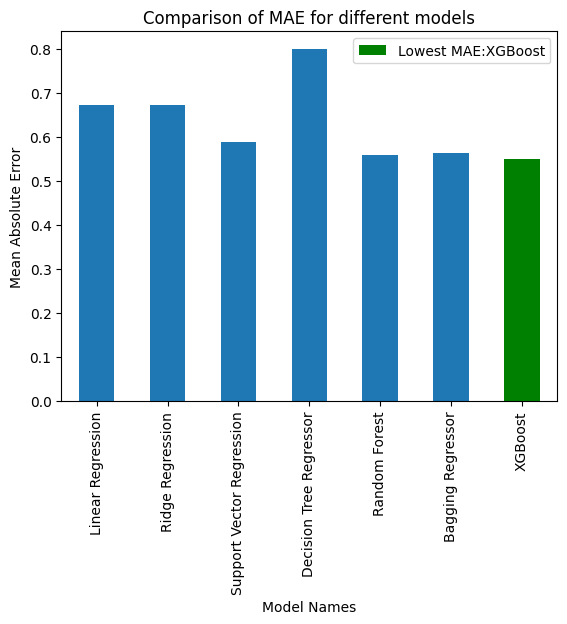

In [ ]:
### Visualizing the comparison of mse for  different models a bar chart

ax = mae_df.plot(kind='bar', x= 'Model Name')
plt.title("Comparison of MAE for different models")
plt.xlabel("Model Names")
plt.ylabel("Mean Absolute Error")

## Setting green color for highlighting the model having lowest mae
lowest_mae = mae_df['MAE'].idxmin()
lowest_mae_patch = ax.patches[lowest_mae]
lowest_mae_patch.set_facecolor('green')
ax.legend([lowest_mae_patch], [f'Lowest MAE:{mae_df.iloc[lowest_mae]["Model Name"]}'], loc='best')
plt.xticks(rotation =90)
plt.show()

**Comparative Result Analysis:**

It is evident that the ensemble methods like Random forest regressor, Bagging regressor and extreme gradient boosting actually outperform the individual models (Linear Regression, Decision Tree Regressor, Support Vector Regressor) becase combining the predictions of multiple base models helps to reduce overfitting and improve generalization.

extreme Gradient Boosting model(XGBoost) provides the better performance compared to the other models for movie rating prediction and the MSE(Mean Squared Error) for XGBoost model is 0.5499 and MAE(Mean Absolute Error) is 0.55 because it is an ensemble approach which optimzes model performance by iteratively minimizing the loss functions.

Also, By observing the the mean squared error(MSE) and Mean Absolue Erro(MAE) in prediction, it it evident that Random Forest, bagging regressor, support vector regressor model perform well in predicting the movie ratings.

Finally, as the decision trees are prone to overfitting, the decision tree regressor exhibits the higher MSE (mean squared error) and higher MAE(Mean Absolute Error) among all the models, that means the decision tree regressor model has the highest prediction error compared to the other models.